# Error analysis notebook (test data)

## Import packages

In [49]:
import pandas as pd
import math

import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from elasticsearch import Elasticsearch

import warnings
import matplotlib
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)
warnings.filterwarnings("ignore")

from enum import IntEnum



## Set filepaths

#### Meta, DocHLevel

In [13]:
ranking = '../evaluation/resources/2020/jsonruns/p_controller_train_nle_meta_9_1_train.json'
eval_result_hlevel = '../evaluation/resources/2020/eval_results/p_controller_train_nle_meta_9_1_train_hlevel.tsv'
eval_result_level = '../evaluation/resources/2020/eval_results/p_controller_train_nle_meta_9_1_train_level.tsv'
gt = '../pre_processing/resources/training/2020/TREC-Fair-Ranking-training-sample.json'
est_rel_meta_p = '../reranking/resources/relevances/Training_rel_scores_model_A.csv'
annotations = '../pre_pre_processing/resources/merged-annotations.json'

## Prepare dataframes

In [18]:
# ranking df
rdf = pd.read_json(ranking, lines=True)

# ground truth df
gtdf = pd.read_json(gt, lines=True).explode('documents')
gtdf['doc_id'] = gtdf.documents.apply(lambda row: row.get('doc_id'))
gtdf['doc_rel'] = gtdf.documents.apply(lambda row: row.get('relevance'))

# paired down relevances df
reldf = gtdf[['qid','query','doc_id','doc_rel']]

# eval result dfs
ehldf = pd.read_csv(eval_result_hlevel, sep='\t', names=['key', 'qid', 'value'])
ehldf = ehldf.pivot(index='qid', columns='key', values='value')

eldf = pd.read_csv(eval_result_level, sep='\t', names=['key', 'qid', 'value'])
eldf = eldf.pivot(index='qid', columns='key', values='value')


# est rel df
est_rel_meta = pd.read_csv(est_rel_meta_p)
est_rel_meta.head()

# annotations
adf = pd.read_json(annotations,lines=True)
adf = adf.explode('authors')
adf[['name','wiki','country','type','valid','auth_id', 'h_index','level','region']] = adf.authors.apply(pd.Series).rename({'id':'auth_id'},axis=1)

In [19]:
rdf.head(2)

,q_num,qid,ranking
0,0.0,5438,"[b2fdee22aa02477292b858fbafcb418932732bce, 993..."
1,0.1,5438,"[70f3a58b0fc6916c2e6616bfbae5758c00408894, ec1..."


In [20]:
gtdf.head(2)

,qid,query,frequency,documents,doc_id,doc_rel
0,5438,cloud computing,0.000057,{'doc_id': '3e19046c665867bbe557685da60738a407...,3e19046c665867bbe557685da60738a40738010a,0
0,5438,cloud computing,0.000057,{'doc_id': '7ef08f1fa127af817cdfd9d3bd00bdf60e...,7ef08f1fa127af817cdfd9d3bd00bdf60e32143b,0


In [21]:
reldf.head(2)

,qid,query,doc_id,doc_rel
0,5438,cloud computing,3e19046c665867bbe557685da60738a40738010a,0
0,5438,cloud computing,7ef08f1fa127af817cdfd9d3bd00bdf60e32143b,0


In [22]:
ehldf.head(2)

key,difference,disparity,relevance
qid,,,
69,0.146308,2.820826,2.254359
258,0.549351,1.043557,0.679082


In [23]:
eldf.head(2)

key,difference,disparity,relevance
qid,,,
69,0.211649,3.322678,2.491326
258,0.479589,2.230424,1.349051


In [9]:
adf.head(2)

,id,missing_authors,authors,name,wiki,country,type,valid,auth_id,h_index,level,region
0,f3b7db81ee8642cf2deab7a9834e07b8df54185b,False,"{'name': 'David M. Szymanski', 'wiki': 'Texas ...",David M. Szymanski,Texas A&M University,US,academic,True,50215565.0,9.0,Advanced,Americas
0,f3b7db81ee8642cf2deab7a9834e07b8df54185b,False,"{'name': 'David H. Henard', 'wiki': 'North Car...",David H. Henard,North Carolina State University,US,academic,True,115002169.0,8.0,Advanced,Americas


## Extract information for specific query

Helper methods.

In [51]:
def extract_results_based_on_qid(qid, ranking_df):
    return ranking_df[ranking_df.qid == qid]

def extract_relevances_based_on_qid(qid, relevance_df):
    return relevance_df[relevance_df.qid == qid]

In [53]:
def count_relgrades(relevance_df):
    rel_counts = relevance_df.doc_rel.value_counts()
    rel_count = rel_counts[1]
    nonrel_count = rel_counts[0]
    return rel_count, nonrel_count

def count_relgrades_qid(qid, relevance):
    subrelevance = extract_relevances_based_on_qid(qid, relevance)
    return count_relgrades(subrelevance)


## Visualization

We use different visualizations to gain more insight into the way rankings are formed.

- Given a query with N documents to be re-ranked, for each rank in a list of size N we compute the number of times a relevant or non-relevant item appears at this rank. For poorly performing queries, we expect to see more non-relevant items in top positions and fewer relevant items. These plots can show us whether the relevant items occur towards the middle or the back of the rankings instead.
    - We either plot the relevant and non-relevant items per rank in the same plot, or in separate plots. The separate plots are more readable, since the number of relevant and non-relevant documents across 150 rankings are in different orders of magnitude.
    
    
- Given a query with N documents to be re-ranked, for a specific rank in a list of size N we compute how often each of the documents occurs at that rank. We color-code the documents by relevant/non-relevant. In an ideal scenario, we expect all relevant documents to occur roughly equally as often at the top positions, and more often than non-relevant documents at that. For non-relevant documents, we expect the same behavior at bottom positions. Departures from this behavior can show us whether there are documents that are treated differently than they should. Inspecting these documents may teach us more about *why* they show up in a place where they do not belong.


- Complementary to the previous plot, we show the number of times each document occurs in a "top" or in a "bottom" position. Under the expected exposure model [2], an ideal ranking is any ranking where all documents with a higher relevance grade are followed by all documents with a lower relevance grade. For example, if doc1 and doc2 both have relevance 1, then a ranking that starts as [doc1, doc2, ...] is identical in quality to one that starts with [doc2, doc1, ...]. A "top" position is then any position with rank <= # relevant documents, and a "bottom" position is any position with rank > # relevant documents. 

  In an ideal scenario, we expect each relevant document to occur equally as often in a "top" position, and each non-relevant document to occur equally as often in a "bottom" position. The additional information gained by this plot compared to the previous plot is that we can see whether there are documents that are systematically in a "wrong" (top if they are non-relevant, bottom if they are relevant) position, where the previous plot only shows if they are missing from a *specific* top or bottom rank.

- 


We visualize how often a ranking position is occupied by a relevant versus a non-relevant document, aggregated over all 150 returned rankings for that query.


In [23]:
def plot_rel_nonrel_per_rank(data):
    """Plot the number of times a (non)relevant item appeared at a rank."""
    
    sns.set(rc={'figure.figsize':(11.7,8.27)})
    sns.barplot(x="rank", y="count", hue="relkind", data=data)

In [30]:
def plots_for_qid(qid,ranking,relevance,k=2):
    plot_rel_nonrel_per_rank_per_relkind_for_qid(qid, ranking, relevance, regline=False)
    plot_rel_nonrel_per_rank_per_relkind_for_qid(qid, ranking, relevance, regline=True)

    plot_doc_occurrence_per_rank_for_qid(qid, ranking, relevance,k)
    plot_doc_occurrence_per_rank_for_qid(qid, ranking, relevance,k,rev=True)
    plot_doc_pos_count_for_qid(qid, ranking, relevance)

## Error analysis template
For each ranker and grouping, we answer the following questions to gain insight into the points of failure of the ranker.

1. How often were top positions occupied by relevant documents? Can these documents be categorized and distinguished from other documents?
2. How often were top positions occupied by non-relevant documents? Can these documents be categorized and distinguished from other documents?
3. Which relevant documents appear rarely or not at all in the top positions? Why did these documents not appear in the top positions more often?
4. How does the distribution of disparity, relevance, and constant terms change with increasing query difficulty?
5. What obvious mistakes did the system make that it could have easily avoided?
7. Other features of note  
    a. Number of top positions for this query.
8. What should the system do to improve performance?
9. What added information would be helpful? How can the system get that information?
10. Are there differences between the NIST assessment of documents and your own assessment?

## Select queries/rankings to inspect

[1] select the queries/rankings to inspect based on the MAP value of the rankings. One of the criteria is to select queries whose ranking's MAP is lower than the average for all queries/systems. The metric for our system is Difference in Group Expected Exposure (DGEE). We look at which queries are the easiest and most difficult for this ranker by ordering the queries by increasing DGEE. A point of interest here is that DGEE depends on the chosen grouping. Therefore, we look at the ordering for two different groupings, and then see if they agree with each other/take the average of the two orderings.

In [25]:
print("hlevel: ", ehldf.difference.mean(), "\tlevel: ", eldf.difference.mean())

hlevel:  0.43443999 	level:  0.42675122000000004


In [28]:
print("# docs with DGEE below/above mean")
print("hlevel\t<: ", len(ehldf[ehldf.difference > ehldf.difference.mean()]), "\t >: ", len(ehldf[ehldf.difference <= ehldf.difference.mean()]))
print("level\t<: ", len(eldf[eldf.difference > eldf.difference.mean()]), "\t >: ", len(eldf[eldf.difference <= eldf.difference.mean()]))

# docs with DGEE below/above mean
hlevel	<:  65 	 >:  135
level	<:  60 	 >:  140


The worst ten queries are:

In [31]:
worstquerieshl = ehldf.sort_values(by='difference',ascending=False).head(10)
worstqueriesl = eldf.sort_values(by='difference',ascending=False).head(10)

In [32]:
worstquerieshl

key,difference,disparity,relevance
qid,,,
111469,2.834201,2.170455,0.463842
31412,2.778232,2.016028,0.413475
33337,2.726048,2.320659,0.603397
47984,2.577560,2.464784,0.344646
5762,2.339087,1.462709,0.352224
11856,1.930131,1.856165,0.371319
125125,1.687319,1.136316,0.509687
84087,1.513666,1.270282,0.696999
76875,1.464672,1.654475,0.507753


In [33]:
worstqueriesl

key,difference,disparity,relevance
qid,,,
33337,2.721092,2.321960,0.606525
47984,2.516947,2.491764,0.392598
111469,2.113990,2.170805,0.443202
31412,1.963736,2.059793,0.465875
11856,1.949971,2.090150,0.490230
30631,1.908784,1.694742,0.712375
76875,1.684732,1.838814,0.898037
24848,1.675040,1.830550,0.884516
59905,1.356650,1.642870,0.556799


The best ten queries are:

In [34]:
bestquerieshl = ehldf.sort_values(by='difference',ascending=True).head(10)
bestqueriesl = eldf.sort_values(by='difference',ascending=True).head(10)

In [35]:
bestquerieshl

key,difference,disparity,relevance
qid,,,
132049,0.002713,1.421254,1.403715
71096,0.029287,1.975807,1.862498
21984,0.032334,1.367385,1.271935
15395,0.040510,2.053024,1.890567
52728,0.057478,1.047360,0.839632
35778,0.063421,2.324523,2.033133
96265,0.068044,1.389924,1.122292
5667,0.068762,1.593546,1.318426
46183,0.076931,1.775022,1.730961


In [36]:
bestqueriesl

key,difference,disparity,relevance
qid,,,
132049,0.002713,1.421254,1.403715
71096,0.026328,1.972820,1.862484
15395,0.026948,2.035232,1.888323
68960,0.055780,1.806684,1.757368
129480,0.062249,1.349351,1.105418
54538,0.067307,1.435857,1.134208
21984,0.071535,1.515766,1.326630
77011,0.074452,1.456289,1.180714
36824,0.078852,2.012095,1.869204


We order the queries from lowest to highest DGEE according to each grouping. Then we plot the "difficulty rank" of each query according to the "hlevel" grouping against its difficulty according to the "level" grouping. This allows us to see if the DGEE for both groupings is generally in accordance or not.

In [45]:
edf = pd.merge(ehldf.sort_values(by='difference').reset_index().reset_index(),eldf.sort_values(by='difference').reset_index().reset_index(),on='qid')
edf.head()

key,index_x,qid,difference_x,disparity_x,relevance_x,index_y,difference_y,disparity_y,relevance_y
0,0,132049,0.002713,1.421254,1.403715,0,0.002713,1.421254,1.403715
1,1,71096,0.029287,1.975807,1.862498,1,0.026328,1.972820,1.862484
2,2,21984,0.032334,1.367385,1.271935,6,0.071535,1.515766,1.326630
3,3,15395,0.040510,2.053024,1.890567,2,0.026948,2.035232,1.888323
4,4,52728,0.057478,1.047360,0.839632,13,0.098930,1.011948,0.728643


<AxesSubplot:xlabel='index_x', ylabel='index_y'>

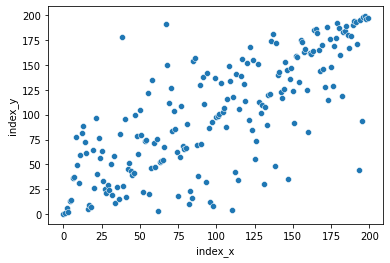

In [46]:
sns.scatterplot(data=edf, x='index_x', y='index_y')

We see a clear upward trend in the plot above. This tells us that in general, the DGEE according to the two groupings is similar. We would not expect great differences in the analysis results for different groupings.

In [48]:
edf['difference'] = edf.apply(lambda row: (row.difference_x + row.difference_y)/2, axis=1)
edf = edf.sort_values(by='difference')
edf.head()

key,index_x,qid,difference_x,disparity_x,relevance_x,index_y,difference_y,disparity_y,relevance_y,difference
0,0,132049,0.002713,1.421254,1.403715,0,0.002713,1.421254,1.403715,0.002713
1,1,71096,0.029287,1.975807,1.862498,1,0.026328,1.972820,1.862484,0.027807
3,3,15395,0.040510,2.053024,1.890567,2,0.026948,2.035232,1.888323,0.033729
2,2,21984,0.032334,1.367385,1.271935,6,0.071535,1.515766,1.326630,0.051934
4,4,52728,0.057478,1.047360,0.839632,13,0.098930,1.011948,0.728643,0.078204


## 1. How often were top positions occupied by relevant documents?
Can these documents be categorized and distinguished from others? We want to find out which characteristics of a document help the ranker to place it in the correct location.

### Methods count per rank

In [58]:
def count_rel_nonrel_per_rank(rankings_df, relevance_df):
    """rankings_df and relevance_df should already be reduced to the information for a single qid"""
    countdict = {k :{'r':0,'nr':0} for k in range(1,len(rankings_df['ranking'].iloc[0]) + 1)}
    for idx, row in rankings_df.iterrows():
        for i, doc in enumerate(row['ranking']):
            rel = relevance_df[relevance_df.doc_id == doc].doc_rel.iloc[0]
            if rel == 0:
                countdict[i+1]['nr'] = countdict[i+1]['nr'] + 1
            elif rel == 1:
                countdict[i+1]['r'] = countdict[i+1]['r'] + 1
            else:
                raise ValueError
    return countdict
            

In [59]:
def rel_nonrel_per_rank_counts_to_sns_df(countdict):
    unpacked = [record for reclist in [[{**{'rank':k},**{'relkind':k2,'count':v2}} for k2,v2 in v.items()] for k,v in countdict.items()] for record in reclist]
    return pd.DataFrame(unpacked)

In [136]:
def plot_rel_nonrel_per_rank_per_relkind(data,num_rel,regline=False):
    """Plot the number of times a (non)relevant item appeared at a rank, split by rank."""
    
    pi = iter(sns.color_palette())
    pi2 = iter(sns.color_palette('dark'))
    f = next(pi)
    f2 = next(pi2)
    s = next(pi)
    s2 = next(pi2)
    next(pi)
    next(pi2)
    t = next(pi)
    t2 = next(pi2)

    fig, ax = plt.subplots(1,2,figsize = (17.7,8.27))
    ax[0].title.set_text('Relevant item counts')
    ax[1].title.set_text('Nonrelevant item counts')

    colorsf = [f] * num_rel + [f2] * (len(data) - num_rel)
    colorss = [s] * num_rel + [s2] * (len(data) - num_rel)
    
    sns.barplot(x="rank", y="count", data=data[data.relkind=='r'],ax=ax[0],palette=sns.color_palette(colorsf))
    sns.barplot(x="rank", y="count", data=data[data.relkind=='nr'],ax=ax[1],palette=sns.color_palette(colorss))

    if regline:
        colorst = [t] * num_rel + [t2] * (len(data) - num_rel)
        sns.regplot(x="rank", y="count", data=data[data.relkind=='r'],ax=ax[0], scatter_kws={"s": 0}, palette=sns.color_palette(colorst))
        sns.regplot(x="rank", y="count", data=data[data.relkind=='nr'],ax=ax[1], scatter_kws={"s": 0},palette=sns.color_palette(colorst))
    return fig


In [132]:
def plot_rel_nonrel_per_rank_per_relkind_for_qid(qid, ranking, relevance, regline=False):
    subranking = extract_results_based_on_qid(qid, ranking)
    subrelevance = extract_relevances_based_on_qid(qid, relevance)
    
    num_rel_docs, num_nonrel_docs = count_relgrades(subrelevance)
    
    rel_nonrel_counts = count_rel_nonrel_per_rank(subranking, subrelevance)
    rel_nonrel_df = rel_nonrel_per_rank_counts_to_sns_df(rel_nonrel_counts)
    fig = plot_rel_nonrel_per_rank_per_relkind(rel_nonrel_df,num_rel_docs,regline=regline)
    fig.suptitle(f"(Non-)relevant documents per rank for {qid}, top={num_rel_docs}")
    

### Methods doc occurrence in top positions

In [76]:
def count_doc_occurrence_per_rank(rankings_df):
    """Count how often each document occurs at each rank."""
    count_per_doc_per_rank = {i: {} for i in list(range(1,len(rankings_df['ranking'].iloc[0]) + 1))}

    for idx, row in rankings_df.iterrows():
        for j, doc in enumerate(row['ranking']):
            i = j + 1
            if not doc in count_per_doc_per_rank[i]:
                count_per_doc_per_rank[i][doc] = 0
            count_per_doc_per_rank[i][doc] = count_per_doc_per_rank[i][doc] + 1
    return count_per_doc_per_rank

In [69]:
def doc_occurrence_per_rank_to_sns_df(occurrence_dict, relevance_df):
    unpacked = [d for dlist in [[{'rank':k, 'doc_id':k2, 'count':v2} for k2, v2 in v.items()] for k,v in occurrence_dict.items()] for d in dlist]
    unpacked_df = pd.DataFrame(unpacked)

    return pd.merge(unpacked_df,reldf[['doc_id','doc_rel']],on='doc_id',how='left')

In [57]:
def plot_doc_occurrence_per_rank(data, k=2, rev=False):
    """Show how often each document in :data: appears at each rank <= k."""
    sns.set_palette("tab10")
    pi = iter(sns.color_palette())
    first = next(pi)
    second = next(pi)
    
    data["doc_labels"] = data.doc_id.apply(lambda row: f"{row[:4]}...")
    
    fig, ax = plt.subplots(1, k, figsize = (9*k, 8))
    
    for i in range(0,k):
        rank = i + 1
        if rev:
            rank = len(set(data["rank"].to_list())) - rank
    
        thisaxdata = data[data['rank'] == rank].sort_values(by='count',ascending=False)
    
        clrs = [first if rel == 1 else second for rel in thisaxdata.doc_rel.to_list()]
        sns.barplot(x="doc_labels", y="count",palette=clrs, data=thisaxdata,ax=ax[i])
        ax[i].title.set_text(f'Rank {rank}')
        _ = ax[i].set_xticklabels(ax[i].get_xticklabels(),rotation = -70)
        ax[i].legend(labels=["rel","nonrel"], title='relkind')
        leg = ax[i].get_legend()
        leg.legendHandles[0].set_color(first)
        leg.legendHandles[1].set_color(second)
    return fig

In [62]:
def plot_doc_occurrence_per_rank_for_qid(qid, ranking, relevance, k=2, rev=False):
    subranking = extract_results_based_on_qid(qid, ranking)
    subrelevance = extract_relevances_based_on_qid(qid, relevance)

    doc_per_rank_counts = count_doc_occurrence_per_rank(subranking)
    rank_occurrence_df = doc_occurrence_per_rank_to_sns_df(doc_per_rank_counts, subrelevance)

    fig = plot_doc_occurrence_per_rank(rank_occurrence_df, k, rev)
    fig.suptitle(f"Document counts per rank for {qid}")
    
    

### Methods number of times a doc is in a top position

In [206]:
def count_pos_of_documents(ranking_df, num_relevant_docs):
    doc_pos_count_dict = {}

    for idx, row in ranking_df.iterrows():
        for i, doc in enumerate(row['ranking']):
            if not doc in doc_pos_count_dict:
                doc_pos_count_dict[doc] = {"top": 0, "bot": 0}
            if i < num_relevant_docs:
                doc_pos_count_dict[doc]["top"] = doc_pos_count_dict[doc]["top"] + 1
            else:
                doc_pos_count_dict[doc]["bot"] = doc_pos_count_dict[doc]["bot"] + 1

    return doc_pos_count_dict        

In [207]:
def document_pos_count_to_sns_df(doc_pos_count_dict, relevance_df):
    unpacked = [d for dlist in [[{'doc_id':k, 'pos':k2, 'count':v2} for k2, v2 in v.items()] for k,v in doc_pos_count_dict.items()] for d in dlist]
    unpacked_df = pd.DataFrame(unpacked)

    return pd.merge(unpacked_df,reldf[['doc_id','doc_rel']],on='doc_id',how='left')

In [212]:
def document_pos_count_df_for_qid(qid,ranking,relevance):
    subranking = extract_results_based_on_qid(qid, ranking)
    subrelevance = extract_relevances_based_on_qid(qid,relevance)
    
    doc_position_counts = count_pos_of_documents(subranking, num_rel_docs)
    doc_pos_count_df = document_pos_count_to_sns_df(doc_position_counts, subrelevance)
    return doc_pos_count_df
    

In [262]:
def plot_doc_pos_count(data,numrel,numnrel,sortby=['count'],no_author_ids=None):
    """Plot how many times each document occurred in the top and bottom positions."""
    sns.set_palette("tab10")
    pi = iter(sns.color_palette())
    first = next(pi)
    second = next(pi)

    data["doc_labels"] = data.doc_id.apply(lambda row: f"{row[:4]}...")


    fig, ax = plt.subplots(1, 2, figsize = (18, 8))
    _ = ax[0].title.set_text(f'Occurrence of doc in top pos (k={numrel})')
    _ = ax[1].title.set_text(f'Occurrence of doc in bottom pos (k={numnrel})')

    for i, pos in enumerate(["top","bot"]):
        _ = ax[i].set_xticklabels(ax[i].get_xticklabels(),rotation = -70)
        thisaxdata = data[data['pos'] == pos].sort_values(by=sortby,ascending=False)
        
        clrs = [first if rel == 1 else second for rel in thisaxdata.doc_rel.to_list()]
        
        sns.barplot(x="doc_labels", y="count",palette=clrs, data=thisaxdata,ax=ax[i])
        
        if no_author_ids:
            thisaxdata['secondcount'] = thisaxdata.apply(lambda row: row['count'] if row['doc_id'] in no_author_ids else 0, axis=1)
            sns.barplot(x="doc_labels", y="secondcount",palette=clrs, data=thisaxdata,ax=ax[i],hatch='//')
     
        ax[i].legend(labels=["rel","nonrel"], title='relkind')
        
        leg = ax[i].get_legend()
        leg.legendHandles[0].set_color(first)
        leg.legendHandles[1].set_color(second)
        
  
    return fig


In [264]:
def plot_doc_pos_count_for_qid(qid, ranking, relevance,sortby=['count'], no_author_ids=None):
    doc_pos_count_df = document_pos_count_df_for_qid(qid,ranking,relevance)
    subrelevance = extract_relevances_based_on_qid(qid,relevance)
    num_rel_docs, num_nonrel_docs = count_relgrades(subrelevance)
    fig = plot_doc_pos_count(doc_pos_count_df,num_rel_docs,num_nonrel_docs,sortby=sortby,no_author_ids=no_author_ids)

    fig.suptitle(f"Document position counts {qid}")

### Computation
1. What percentage of the top positions was occupied by relevant documents?  
    a. Which relevant documents were most often in a top position?  
    b. What was their predicted relevance score?  
    c. What was their author?  
        - Did their author write more of the documents in the ranking?

In [232]:
for q in edf.head(10).qid.to_list():
    subrdf = extract_results_based_on_qid(q, rdf)
    subreldf = extract_relevances_based_on_qid(q, reldf)
    
    num_rel_docs, num_nonrel_docs = count_relgrades(subreldf)
    
    rel_nonrel_counts = count_rel_nonrel_per_rank(subrdf, subreldf)
    rel_nonrel_df = rel_nonrel_per_rank_counts_to_sns_df(rel_nonrel_counts)
    
    # doc_per_rank_counts = count_doc_occurrence_per_rank(subrdf)
    # rank_occurrence_df = doc_occurrence_per_rank_to_sns_df(doc_per_rank_counts, subreldf)
    
    top_with_rel_frac = round(rel_nonrel_df[(rel_nonrel_df['rank'] <= num_rel_docs) & (rel_nonrel_df['relkind'] == 'r')]['count'].sum() / (150 * num_rel_docs) * 100,2)
    print(q, "\t", top_with_rel_frac)

132049 	 78.92
71096 	 33.17
15395 	 36.33
21984 	 34.4
52728 	 33.62
54538 	 23.93
35778 	 22.0
77011 	 17.24
27887 	 32.28
96265 	 12.33


In [254]:
for q in edf.tail(10).iloc[::-1].qid.to_list():
    subrdf = extract_results_based_on_qid(q, rdf)
    subreldf = extract_relevances_based_on_qid(q, reldf)
    
    num_rel_docs, num_nonrel_docs = count_relgrades(subreldf)
    
    rel_nonrel_counts = count_rel_nonrel_per_rank(subrdf, subreldf)
    rel_nonrel_df = rel_nonrel_per_rank_counts_to_sns_df(rel_nonrel_counts)
    
    # doc_per_rank_counts = count_doc_occurrence_per_rank(subrdf)
    # rank_occurrence_df = doc_occurrence_per_rank_to_sns_df(doc_per_rank_counts, subreldf)
    
    top_with_rel_frac = round(rel_nonrel_df[(rel_nonrel_df['rank'] <= num_rel_docs) & (rel_nonrel_df['relkind'] == 'r')]['count'].sum() / (150 * num_rel_docs) * 100,2)
    print(q, "\t", top_with_rel_frac)

33337 	 7.33
47984 	 10.0
111469 	 8.67
31412 	 8.0
11856 	 9.0
30631 	 11.33
76875 	 19.0
24848 	 19.67
5762 	 5.33
82759 	 4.67


In [256]:
toptoplist = []
print("\t".join(["qid","doc_id","pos","count","doc_rel"]))
for q in edf.head(10).qid.to_list():
    doc_pos_count = document_pos_count_df_for_qid(q,rdf,reldf)
    doc_pos_count = doc_pos_count[(doc_pos_count.pos == 'top')  & (doc_pos_count.doc_rel == 1)]
    doc_pos_count["qid"] = q
    maxcount = doc_pos_count["count"].max()
    toptoplist = toptoplist + doc_pos_count[doc_pos_count["count"] == maxcount].doc_id.to_list()
    print(doc_pos_count[["qid","doc_id","pos","count","doc_rel"]][doc_pos_count["count"] == maxcount].to_string(index = False, header=False))
    print()
toptoplist

qid	doc_id	pos	count	doc_rel
 132049  5a2de88464b2307f1fd89f3d84c6d507a49cb47f  top  19  1
 132049  8462f4b6590713db112d6fc665b43cfeb88bab41  top  19  1

 71096  6afc97668839a439e6858691ada76c9ddf798c2a  top  109  1

 15395  67cb7ec0f36f9396b85b18cad90c0d7eec1658ce  top  93  1

 21984  406d1ef750ba4520b8c57f95596cd42852c0e3fa  top  88  1

 52728  2a7e7fba70c6ad91e79b5d4fdd1f487551a808bb  top  21  1
 52728  5313735b8f660d43c9ec0adbc9ed3c1e8d7da85c  top  21  1

 54538  6621f6f8087226645cc00120a9b14da4354518ca  top  15  1

 35778  e9a499241fcdf3802a9bc7d9d84d48ee4e8c5fcc  top  37  1

 77011  eadd6edc8a0dc4126b467ad3e45097ed86a456c9  top  11  1

 27887  2423ea8cf66765d79363988086bf0f6066a13872  top  7  1
 27887  d253458401932876e55c3a2a7cb7718e57dd8160  top  7  1
 27887  1d1ab0f586eadfa1054be723d58f6cef2fba0e6d  top  7  1
 27887  88228be96774ec5cf3757296c7238a6efbd91598  top  7  1
 27887  bbab30c44043235190726a7b0796d66df69cc84b  top  7  1
 27887  f56a4e7e9cd1ac1e9d7c7a74cdd965f12e97b113  

['5a2de88464b2307f1fd89f3d84c6d507a49cb47f',
 '8462f4b6590713db112d6fc665b43cfeb88bab41',
 '6afc97668839a439e6858691ada76c9ddf798c2a',
 '67cb7ec0f36f9396b85b18cad90c0d7eec1658ce',
 '406d1ef750ba4520b8c57f95596cd42852c0e3fa',
 '2a7e7fba70c6ad91e79b5d4fdd1f487551a808bb',
 '5313735b8f660d43c9ec0adbc9ed3c1e8d7da85c',
 '6621f6f8087226645cc00120a9b14da4354518ca',
 'e9a499241fcdf3802a9bc7d9d84d48ee4e8c5fcc',
 'eadd6edc8a0dc4126b467ad3e45097ed86a456c9',
 '2423ea8cf66765d79363988086bf0f6066a13872',
 'd253458401932876e55c3a2a7cb7718e57dd8160',
 '1d1ab0f586eadfa1054be723d58f6cef2fba0e6d',
 '88228be96774ec5cf3757296c7238a6efbd91598',
 'bbab30c44043235190726a7b0796d66df69cc84b',
 'f56a4e7e9cd1ac1e9d7c7a74cdd965f12e97b113',
 '1c2fc3db949b0ec866ba6a636182860754def193']

In [255]:
tailtoplist = []
print("\t".join(["qid","doc_id","pos","count","doc_rel"]))
for q in edf.tail(10).qid.to_list():
    doc_pos_count = document_pos_count_df_for_qid(q,rdf,reldf)
    doc_pos_count = doc_pos_count[(doc_pos_count.pos == 'top') & (doc_pos_count.doc_rel == 1)]
    doc_pos_count["qid"] = q
    maxcount = doc_pos_count["count"].max()
    tailtoplist = tailtoplist + doc_pos_count[doc_pos_count["count"] == maxcount].doc_id.to_list()
    print(doc_pos_count[["qid","doc_id","pos","count","doc_rel"]][doc_pos_count["count"] == maxcount].to_string(index = False, header=False))
    print()
tailtoplist

qid	doc_id	pos	count	doc_rel
 82759  739cf634cd54b21acbf3aea035bbac2c6f877154  top  10  1

 5762  f8a27b6591312fba8108500ab2e8275c92009a71  top  13  1

 24848  dfe6cbeae293613e33f90450d43c89681898a2a9  top  31  1

 76875  76e199fcf5537c4e8ef774d792afd2978aa11ebb  top  37  1

 30631  ab609df01b35223d4c1ec4d6fe84cfe349ad608b  top  19  1

 11856  fa4ddfc3df658ae1451047ed8904a3184154ad2a  top  14  1

 31412  59ab54f50c6a278425bdbf115921bd2f94923e28  top  13  1

 111469  34b6de1aee17441021e62b63c543abc1c28b0928  top  13  1
 111469  647444c4963ddac18626a4d2817eb85e438405c0  top  13  1

 47984  96fb6950aba868ff4a6e8f96bd232cf84e5c6da3  top  20  1

 33337  4244f5595bc6ddf93eb0e5c568b5967134652f27  top  11  1
 33337  f33c709a637322a2eec2ab2d35cb4f17f3da9f71  top  11  1



['739cf634cd54b21acbf3aea035bbac2c6f877154',
 'f8a27b6591312fba8108500ab2e8275c92009a71',
 'dfe6cbeae293613e33f90450d43c89681898a2a9',
 '76e199fcf5537c4e8ef774d792afd2978aa11ebb',
 'ab609df01b35223d4c1ec4d6fe84cfe349ad608b',
 'fa4ddfc3df658ae1451047ed8904a3184154ad2a',
 '59ab54f50c6a278425bdbf115921bd2f94923e28',
 '34b6de1aee17441021e62b63c543abc1c28b0928',
 '647444c4963ddac18626a4d2817eb85e438405c0',
 '96fb6950aba868ff4a6e8f96bd232cf84e5c6da3',
 '4244f5595bc6ddf93eb0e5c568b5967134652f27',
 'f33c709a637322a2eec2ab2d35cb4f17f3da9f71']

We inspect the relevant documents that are in the top positions.

### Overlapping documents

There is little overlap between the documents returned for different queries. The following queries have documents that occur for more than one query.

In [197]:
temp = rdf.explode('ranking')[['qid','ranking']]
temp2 = temp.groupby('ranking')['qid'].apply(set).reset_index(name='qids')
temp2[temp2.qids.map(len) > 1].head()


,ranking,qids
2,001d90376ea9a5672e6a2b37ff468d6f3ee0a3e5,"{52728, 48360, 2728}"
17,00a407540a8bdd6d7425bd8a561eb21d69682511,"{7163, 30631}"
30,017e7c1bf71101c24c65aca784a4f867e8718ef1,"{104830, 68183}"
62,038a789bbb8f211176d5e9b0c8394bf6b6d2cc59,"{16040, 18348, 2728}"
85,04bc9c61c81c9125e39a6c52bee56f794e463a6f,"{73836, 5438}"


In [ ]:
doubleqs = set([qid for qidlist in temp2[temp2.qids.map(len) > 1].qids.to_list() for qid in qidlist]).intersection(set(edf.head(10).qid.to_list() + edf.tail(10).qid.to_list()))
doubleqs

In [195]:
temp3 = rdf[rdf.qid.isin(doubleqs)].explode("ranking").drop_duplicates().groupby("ranking")["qid"].apply(set).reset_index(name='qids')
temp3.head()

,ranking,qids
0,001d90376ea9a5672e6a2b37ff468d6f3ee0a3e5,{52728}
1,00a407540a8bdd6d7425bd8a561eb21d69682511,{30631}
2,0e43caeb9d476264d307e8da0ad71ecc4d804ced,{30631}
3,153550ab4a88092f8eac151479e36e053e9e37e9,{52728}
4,1601e9f2bbf89f04f967a4f5f49d7adeca7f0719,{30631}


The queries which are both in the top/bottom 10 queries and have the same documents are 31412 and 30631. The coinciding documents are 3aebc8afc97439a26332526ba4c362771e332087 and 81b95e0483d32945aad0c09849f1a9b2022d59c4.

In [196]:
temp3[temp3.qids.map(len) > 1]

,ranking,qids
20,3aebc8afc97439a26332526ba4c362771e332087,"{31412, 30631}"
59,81b95e0483d32945aad0c09849f1a9b2022d59c4,"{31412, 30631}"


### Visualization

For each rank, we show how often it is occupied by a relevant document. We show this for the top and bottom 10 queries so we can determine both what documents are placed in top positions on easy queries and which on difficult queries.

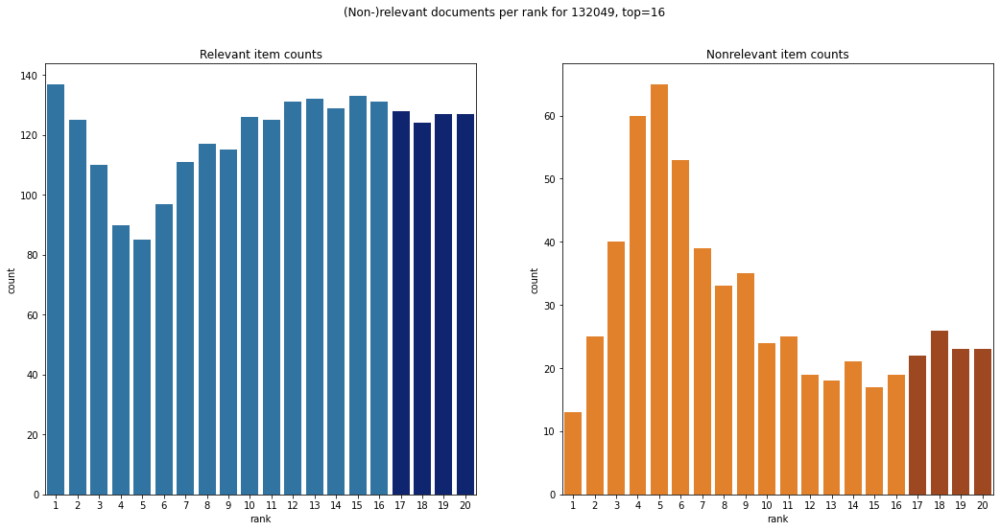

In [133]:
for q in edf.head(1).qid.to_list():
    plot_rel_nonrel_per_rank_per_relkind_for_qid(q, rdf, reldf)

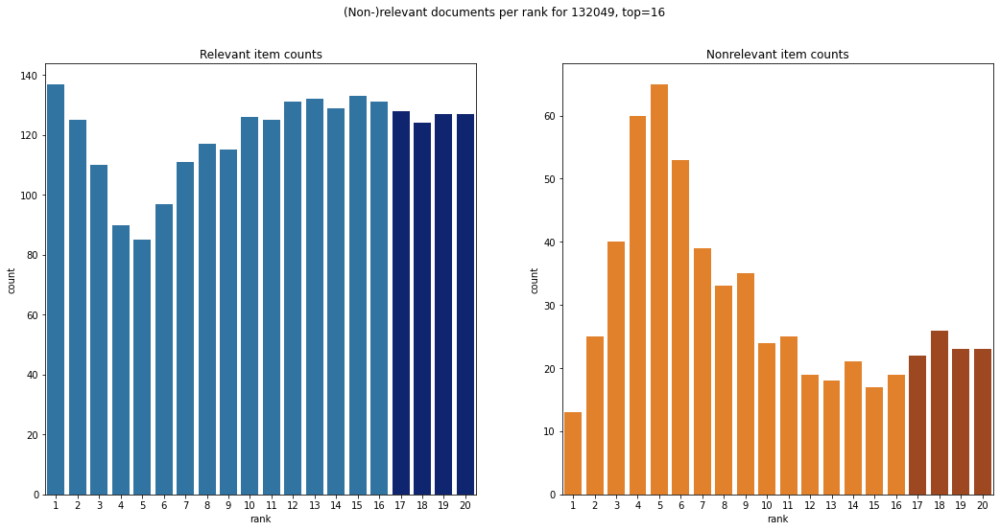

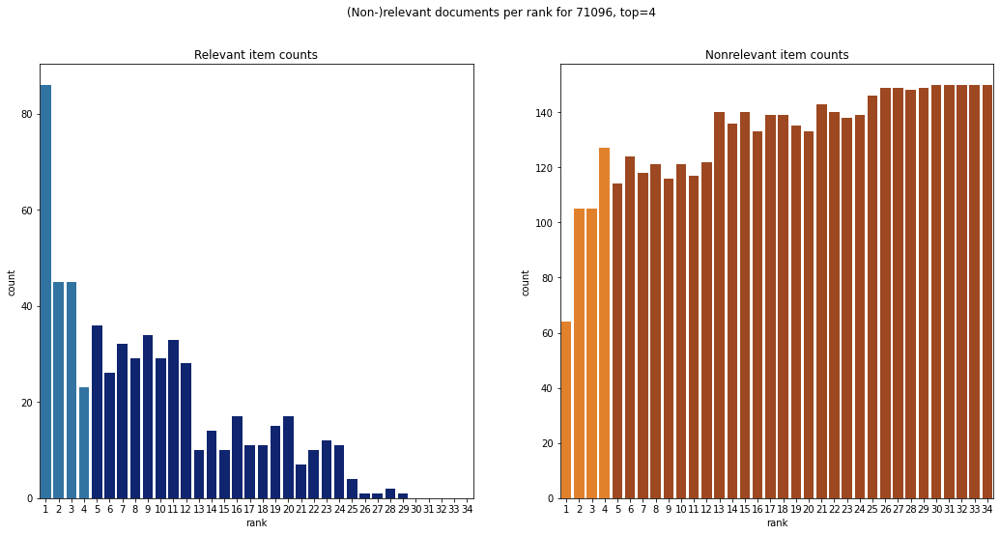

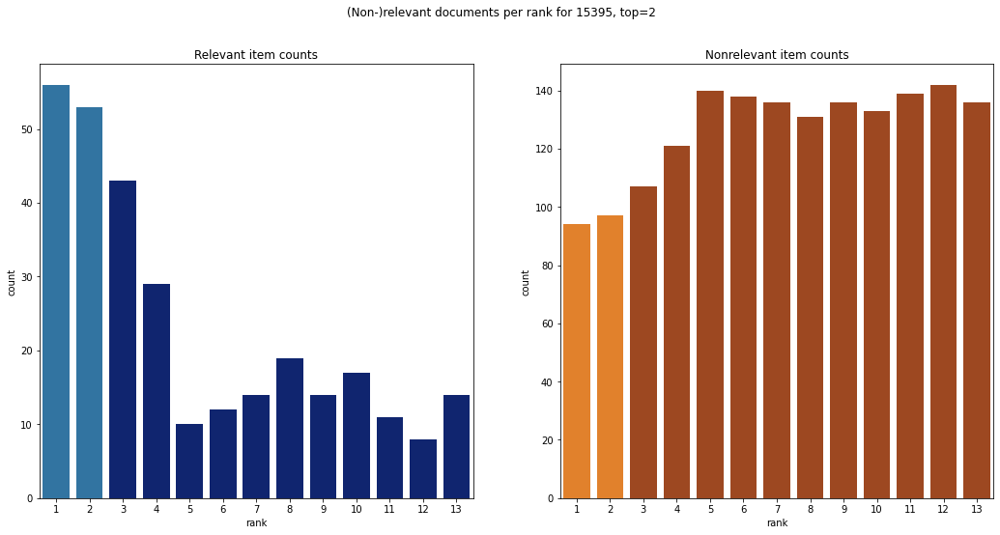

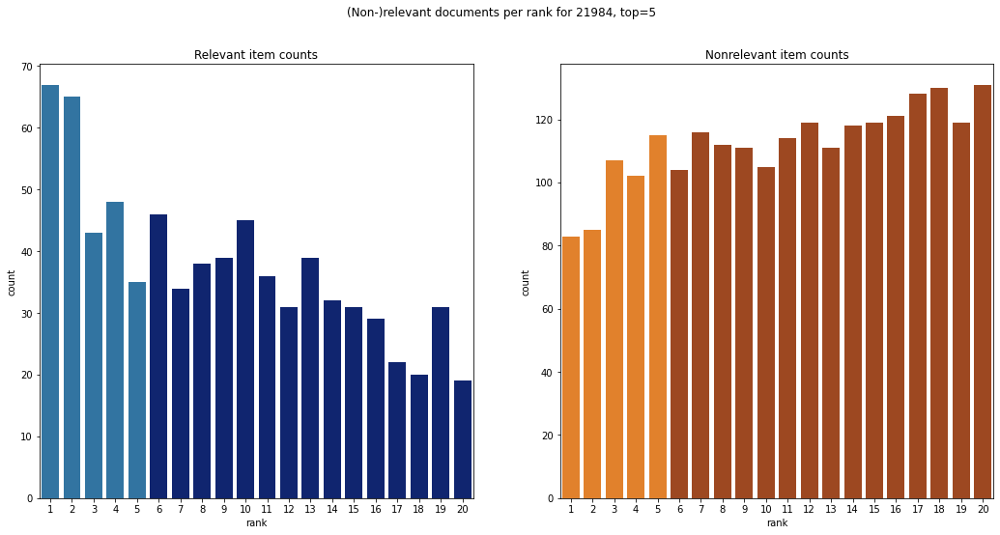

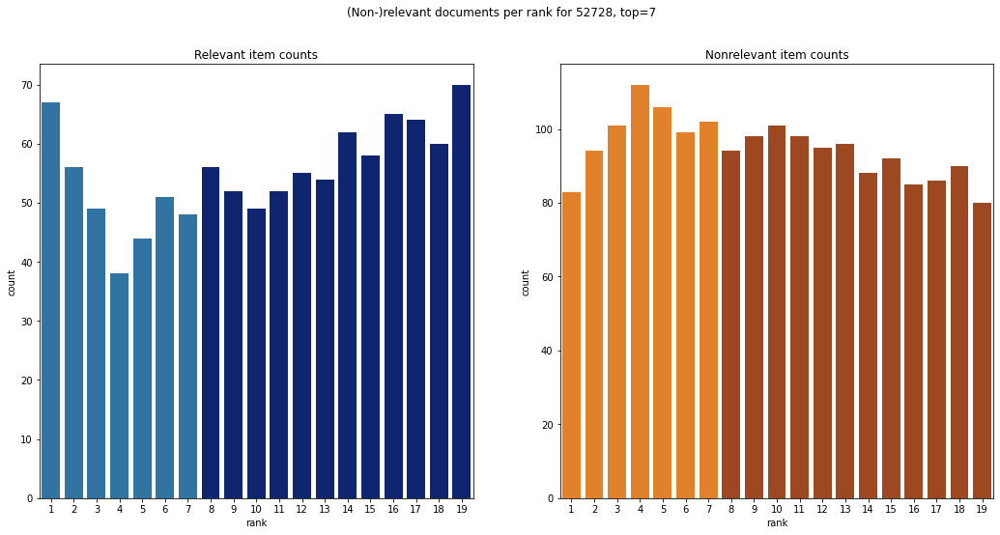

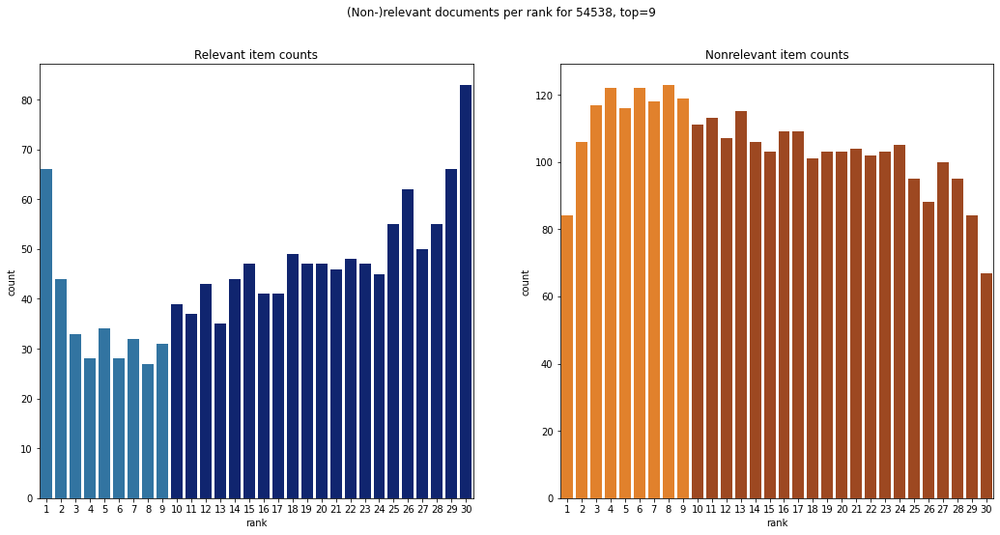

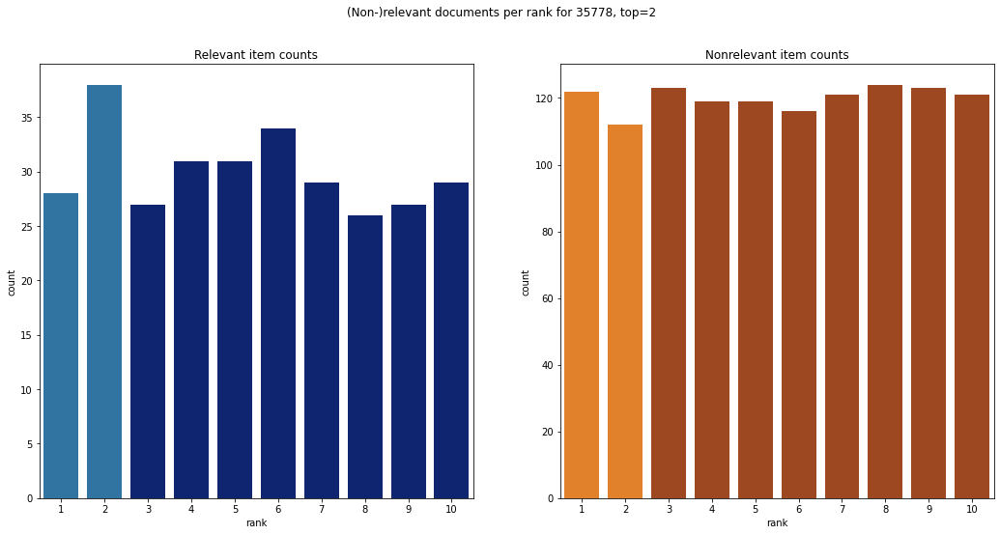

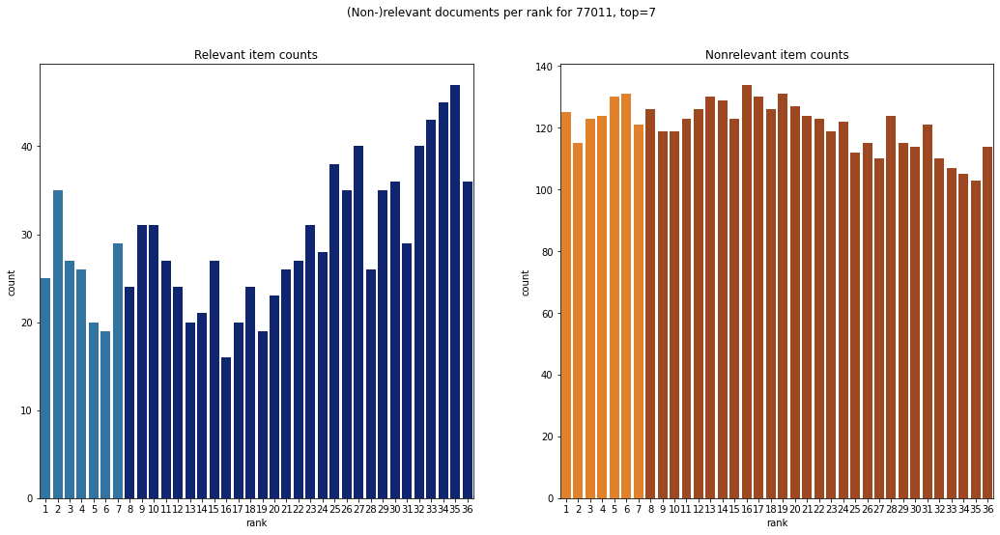

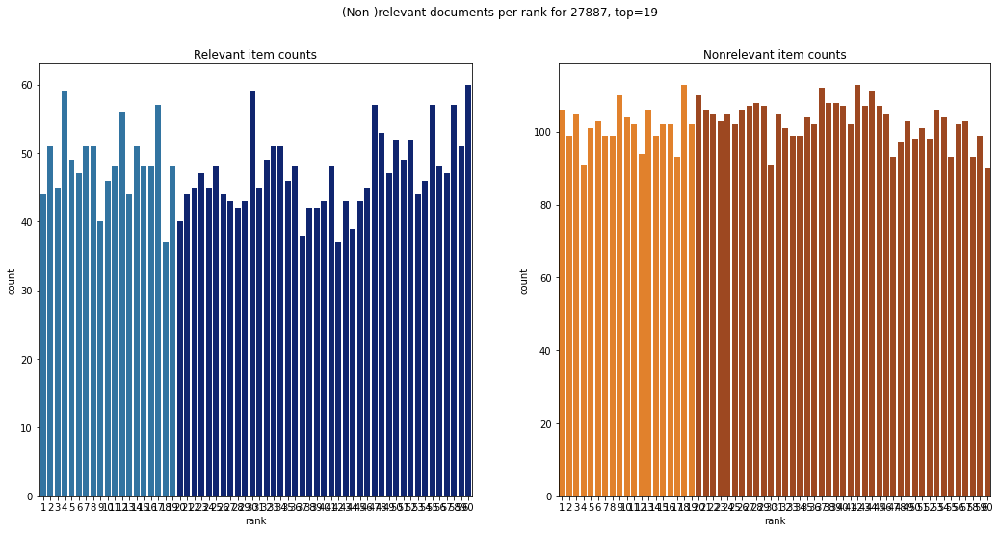

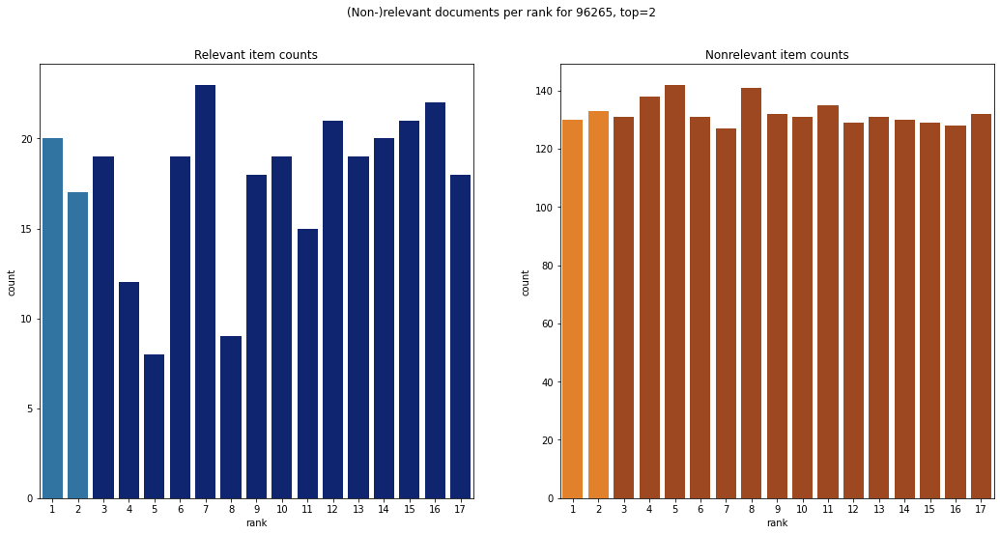

In [134]:
for q in edf.head(10).qid.to_list():
    plot_rel_nonrel_per_rank_per_relkind_for_qid(q, rdf, reldf)

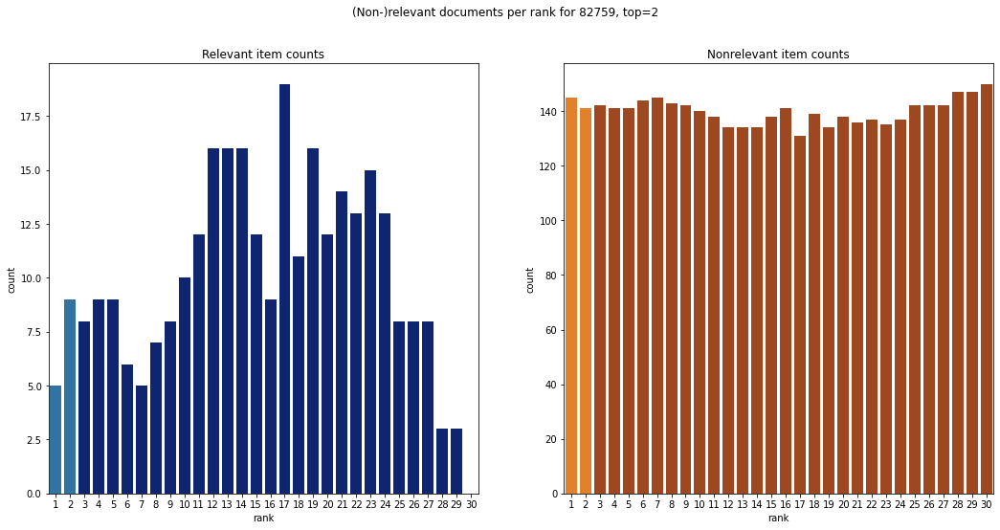

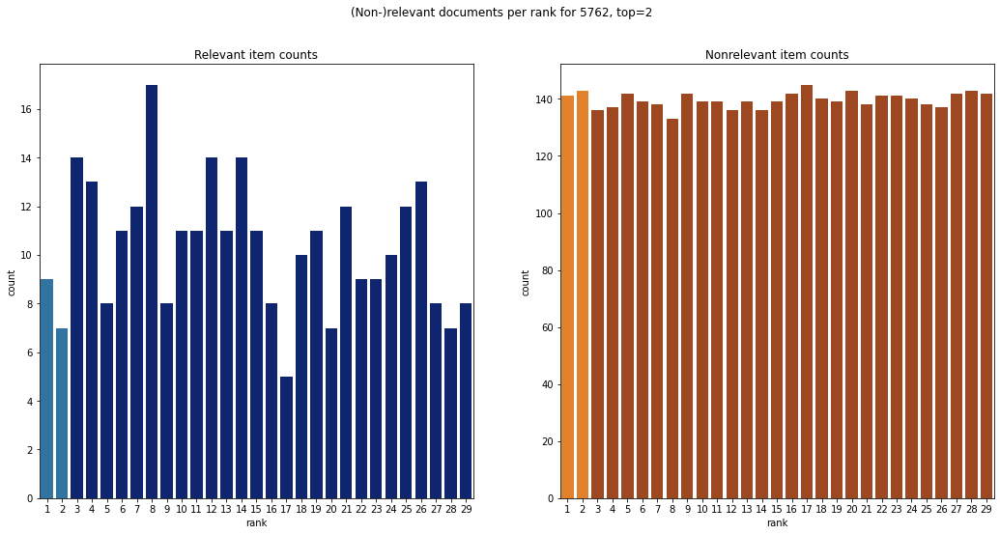

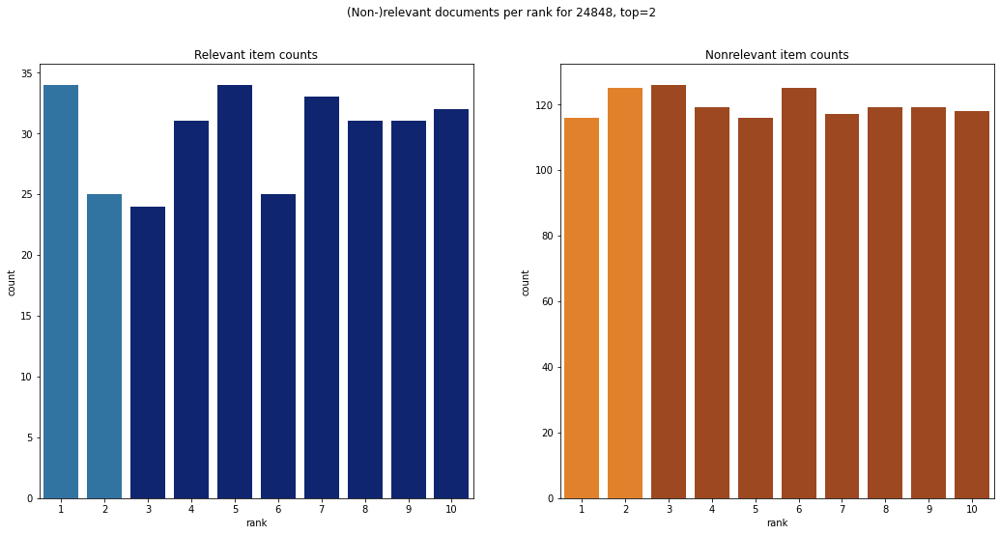

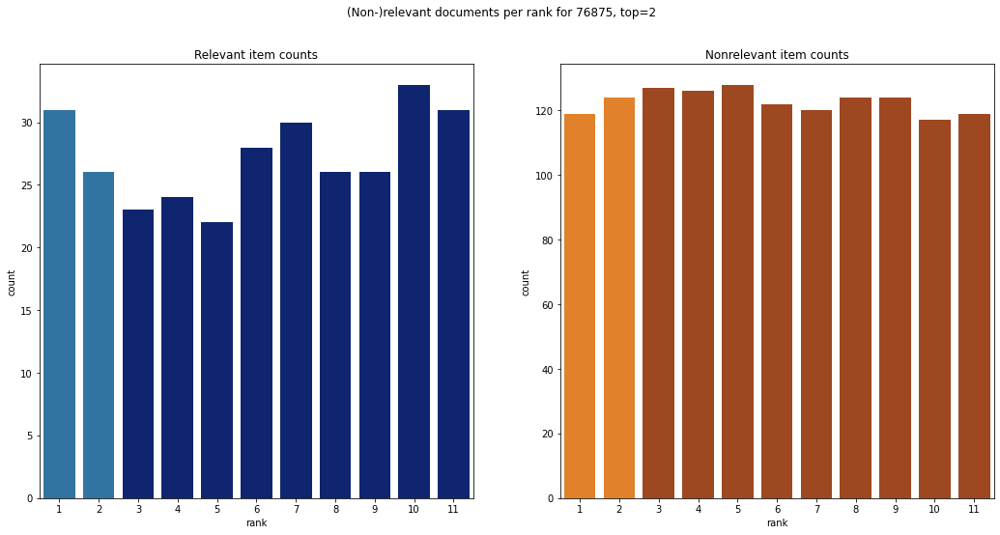

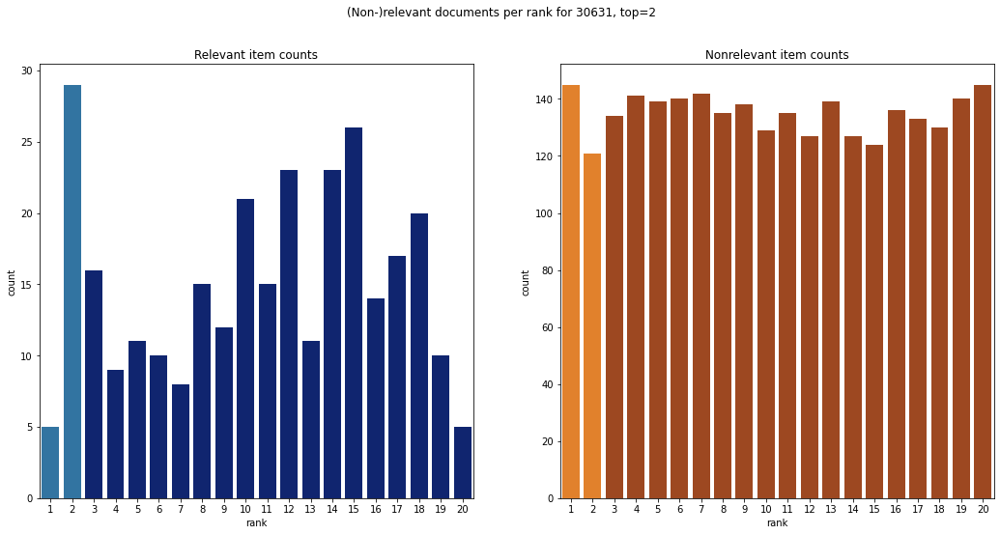

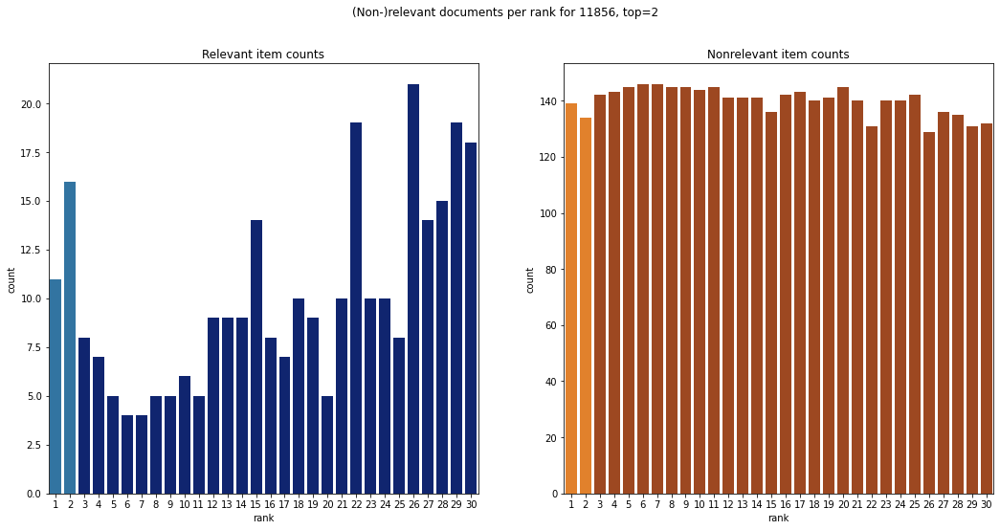

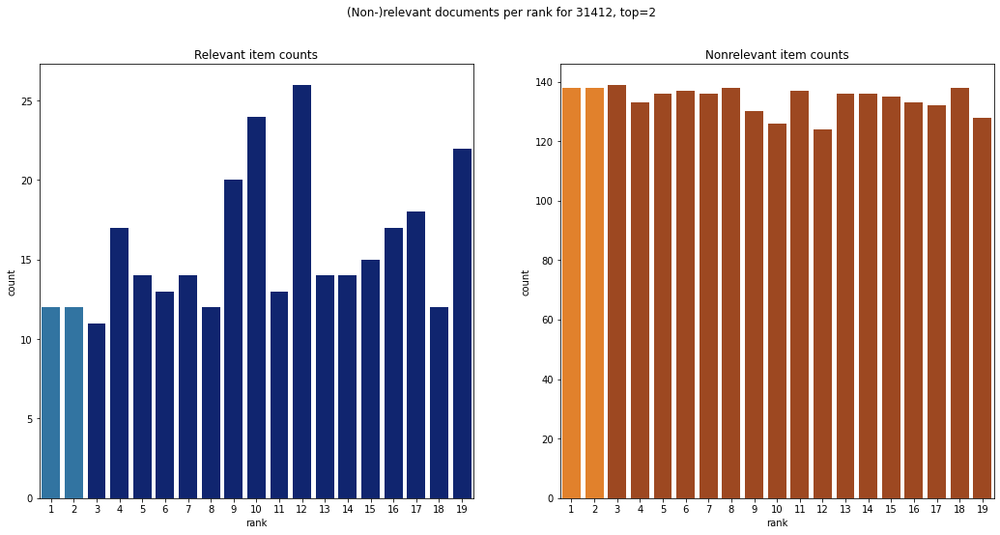

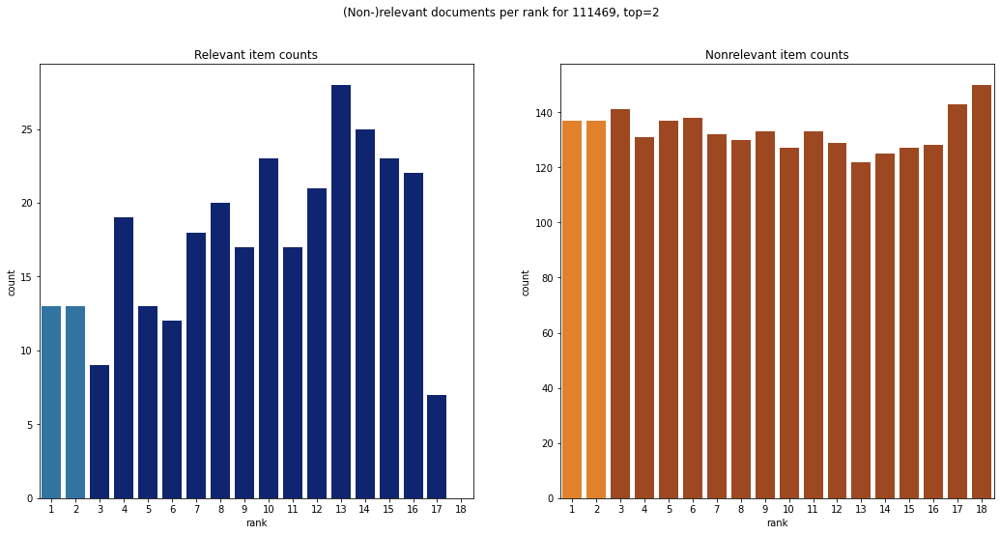

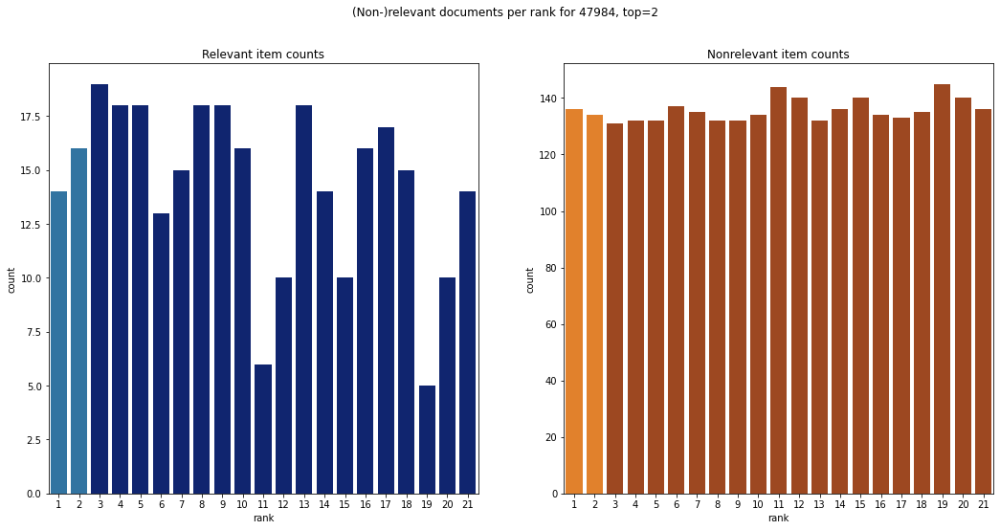

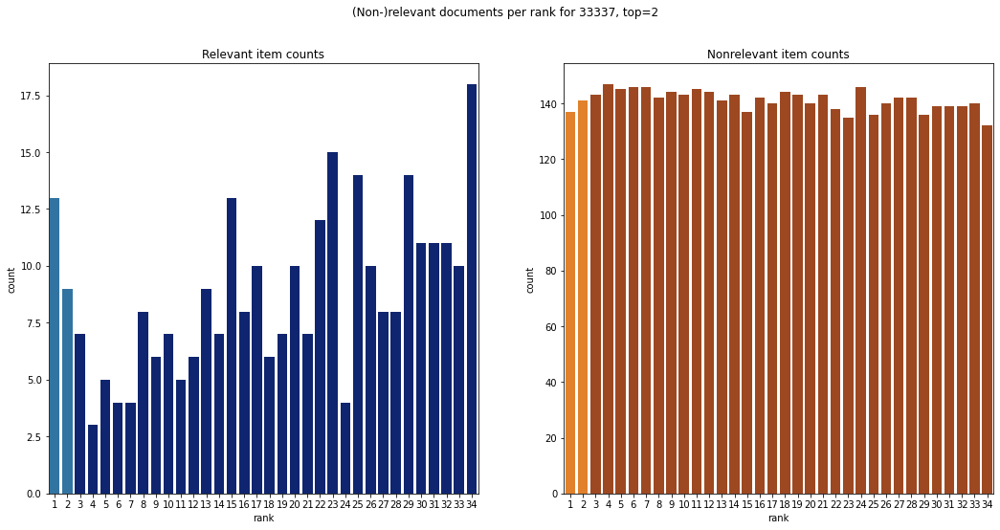

In [135]:
for q in edf.tail(10).qid.to_list():
    plot_rel_nonrel_per_rank_per_relkind_for_qid(q, rdf, reldf)

We also show which documents are found most often in the top positions for the top and bottom 10 queries.

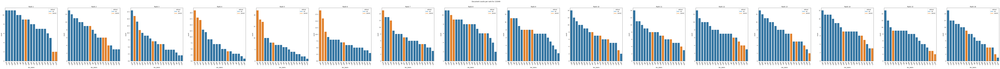

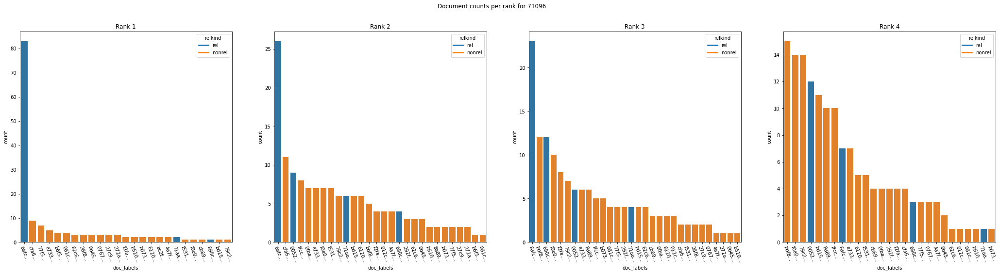

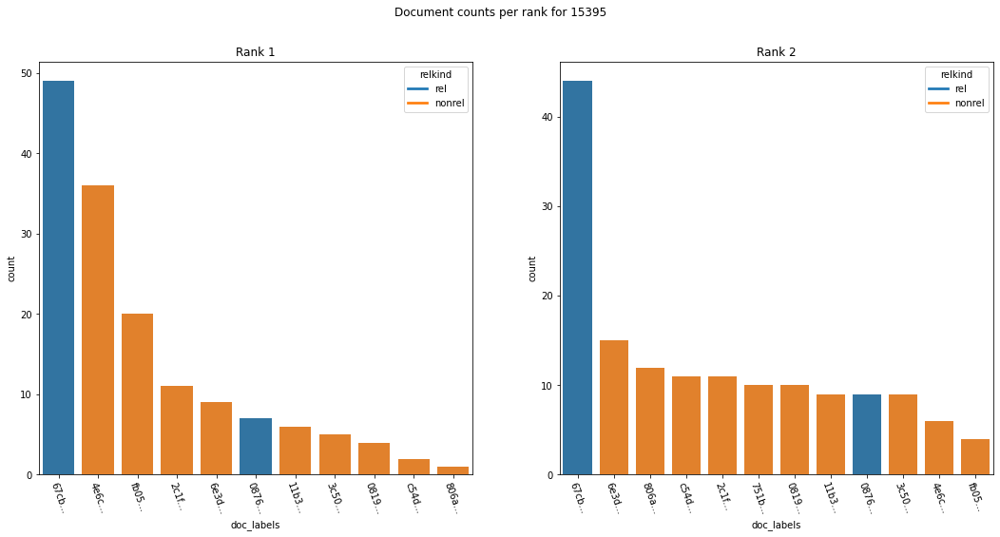

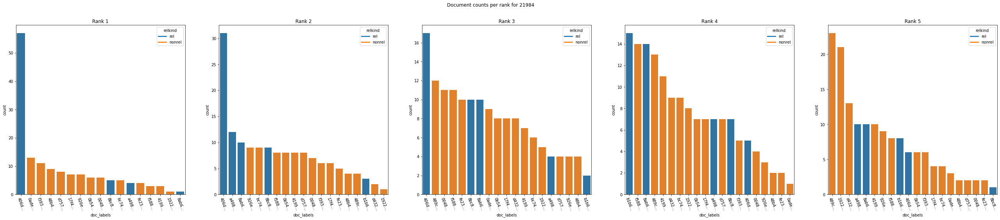

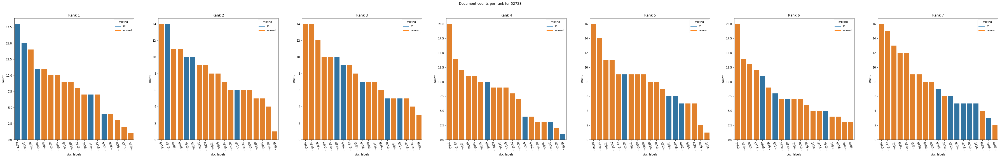

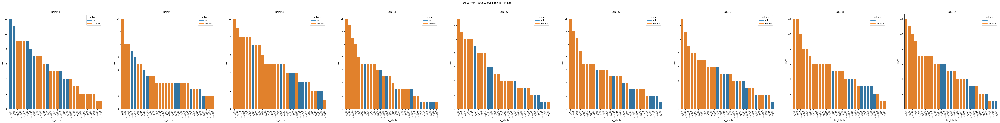

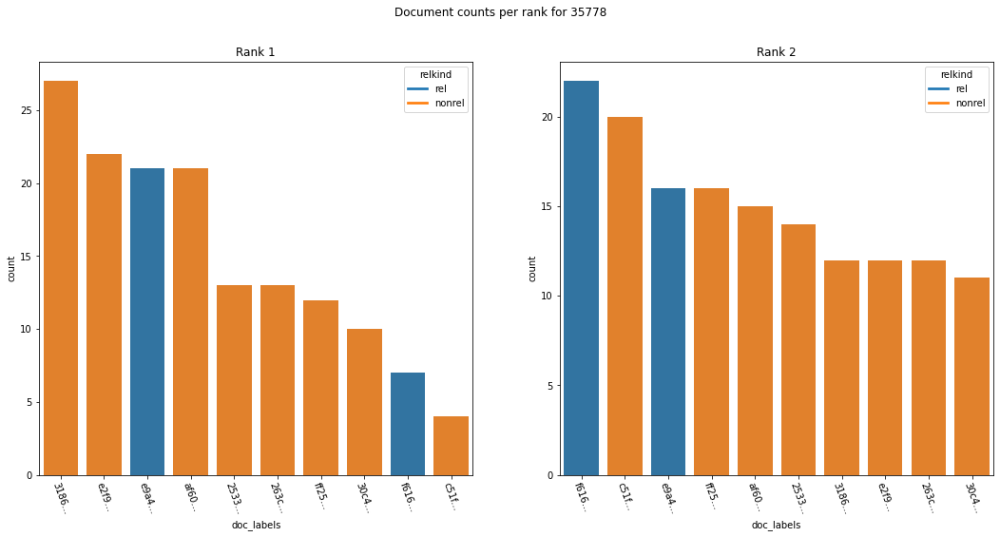

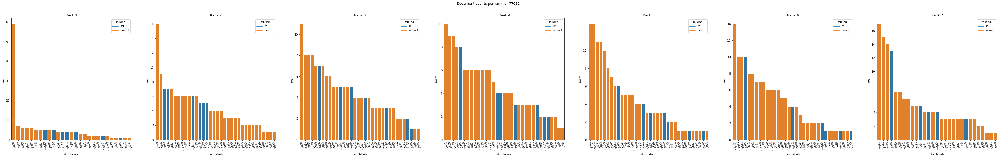

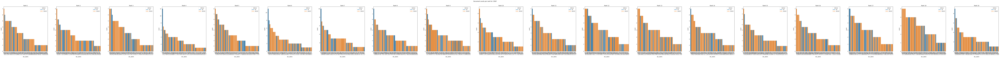

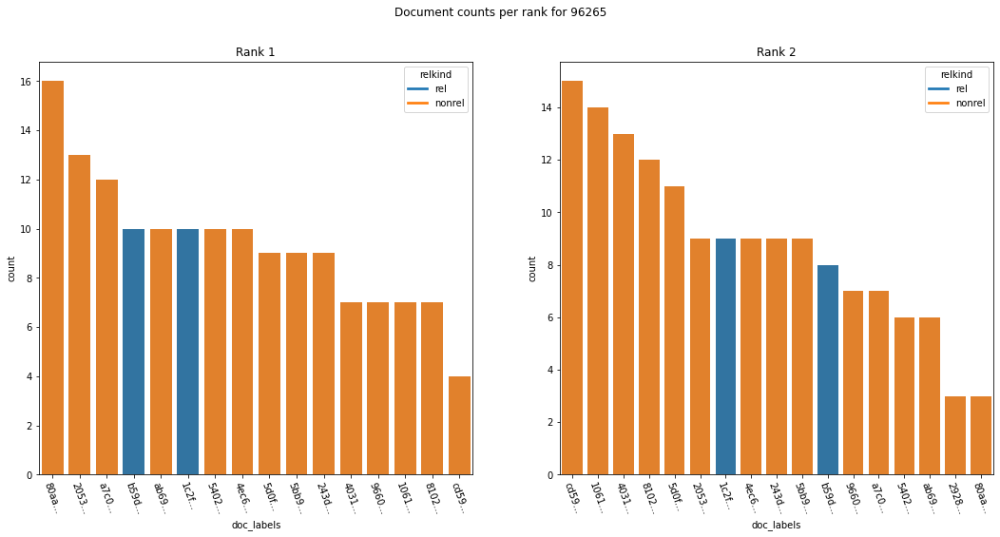

In [70]:
for q in edf.head(10).qid.to_list():
    rel,nonrel = count_relgrades_qid(q,reldf)
    plot_doc_occurrence_per_rank_for_qid(q,rdf,reldf,k=rel)

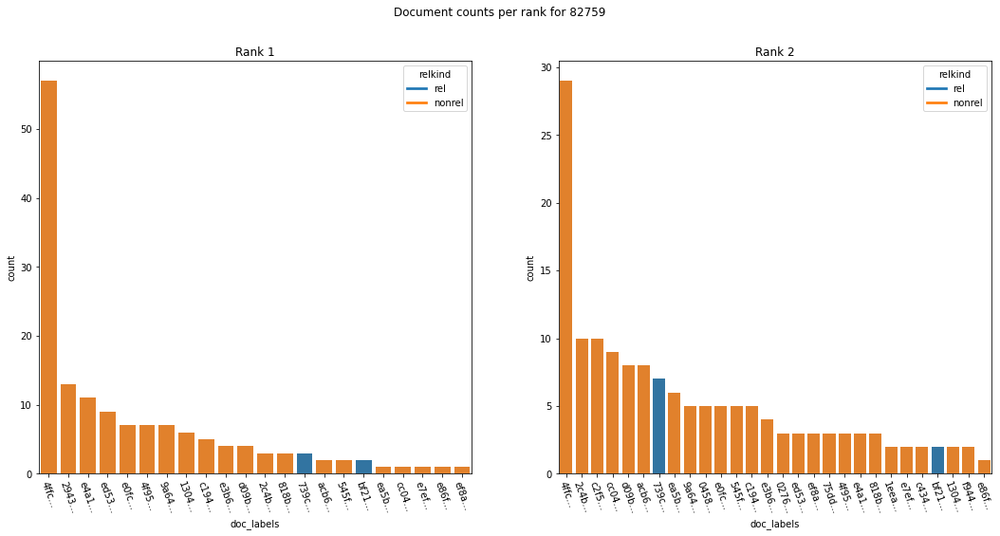

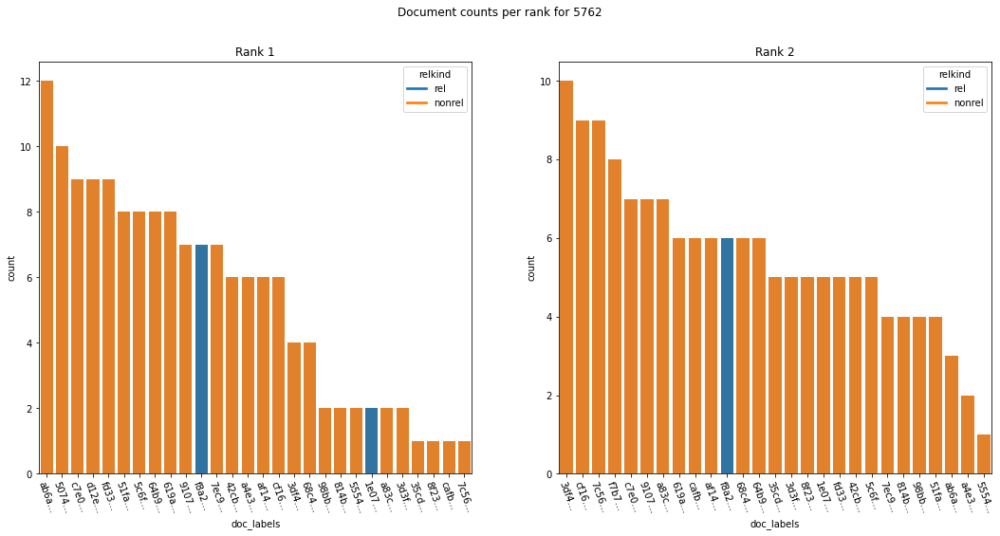

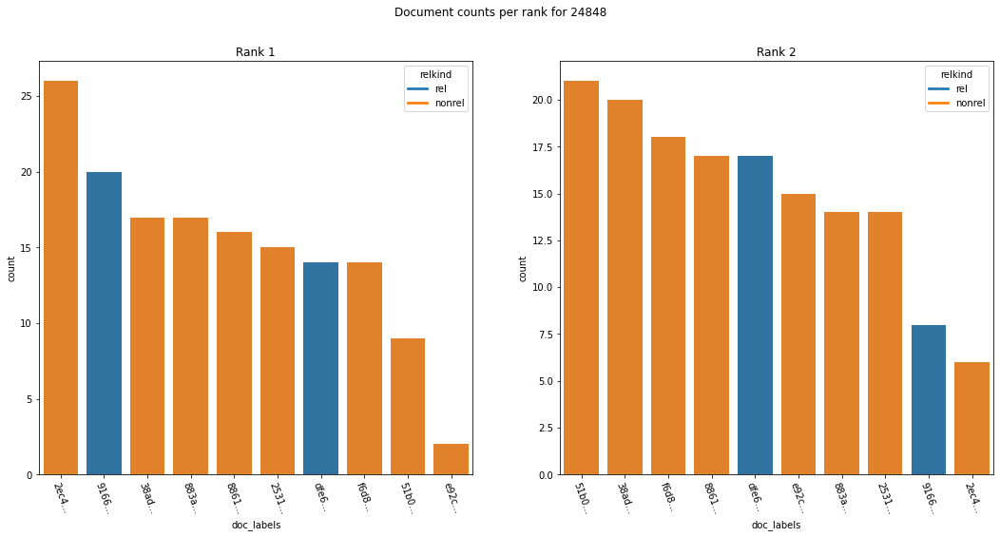

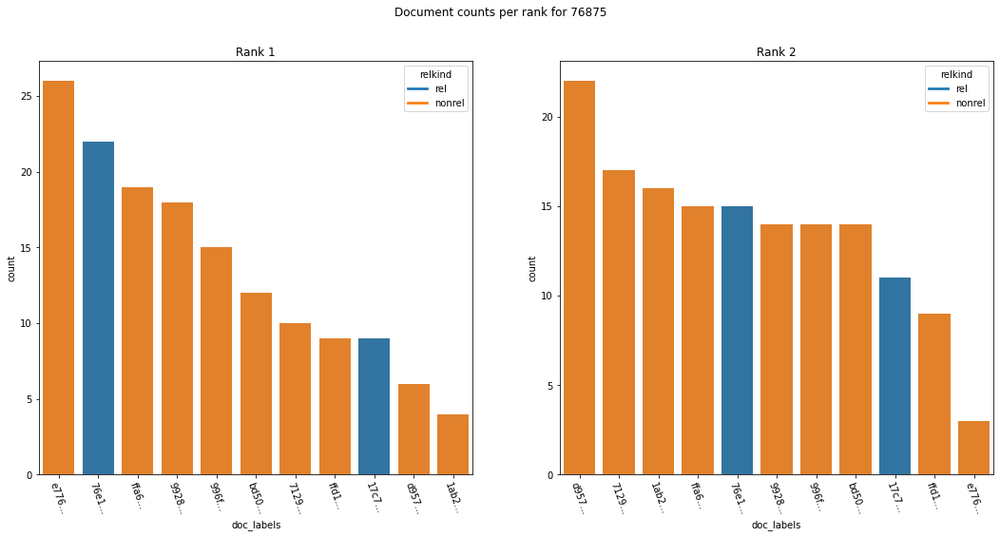

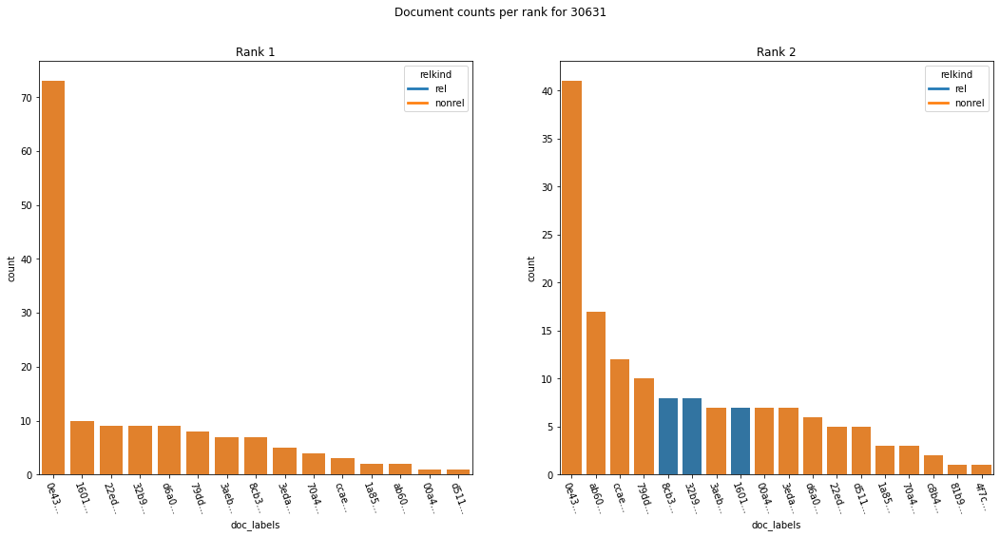

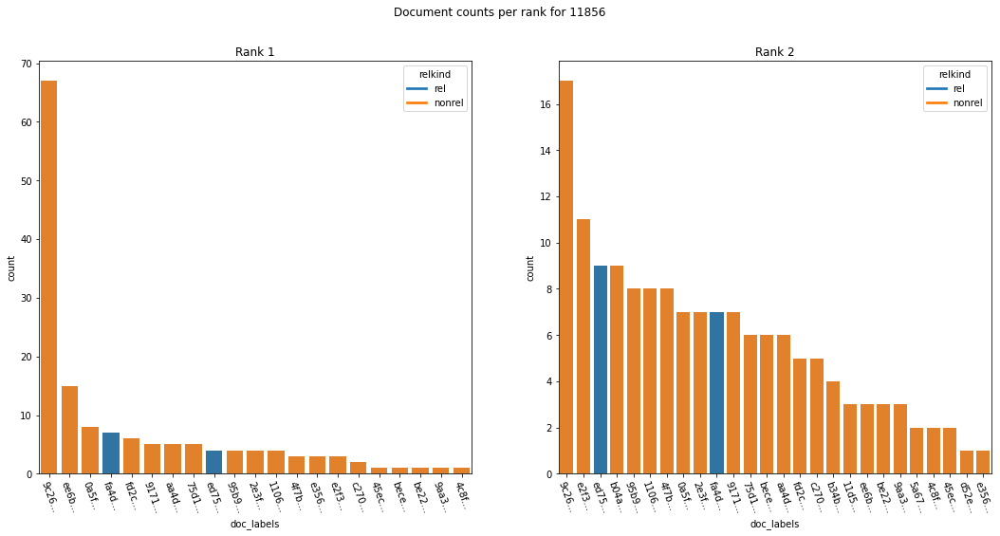

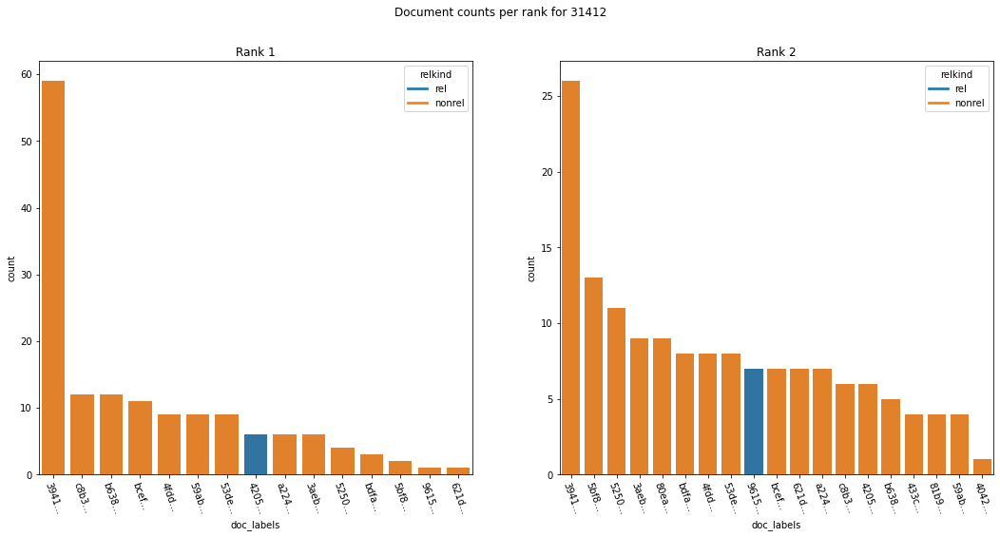

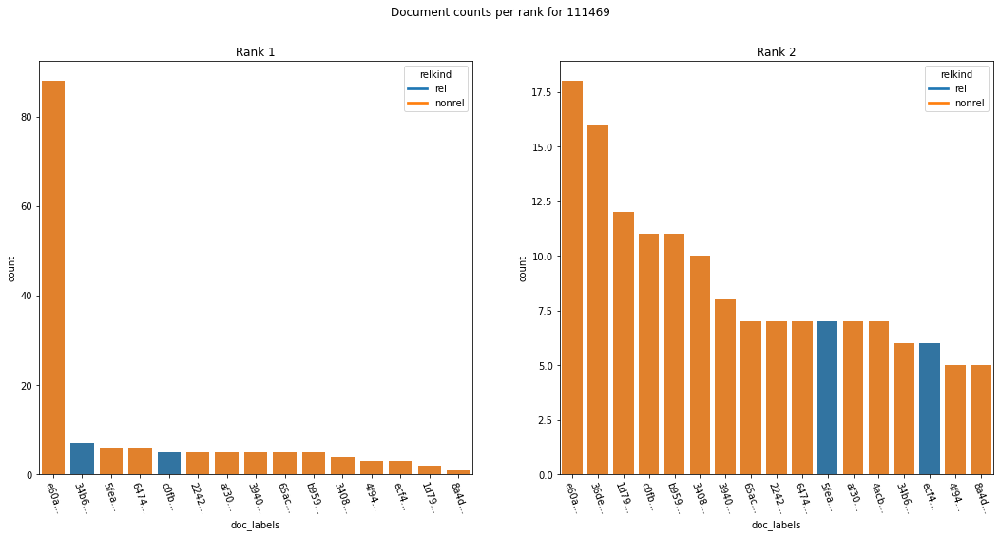

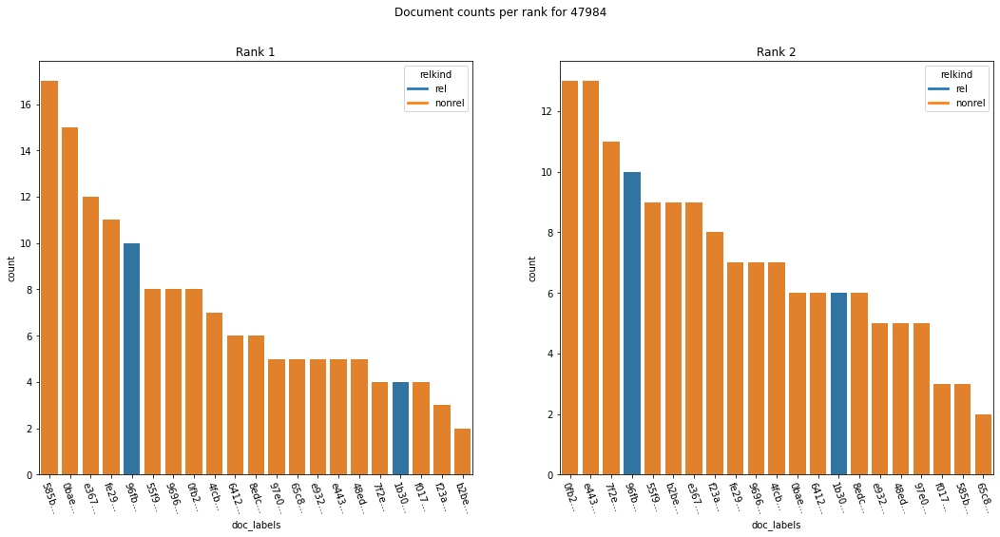

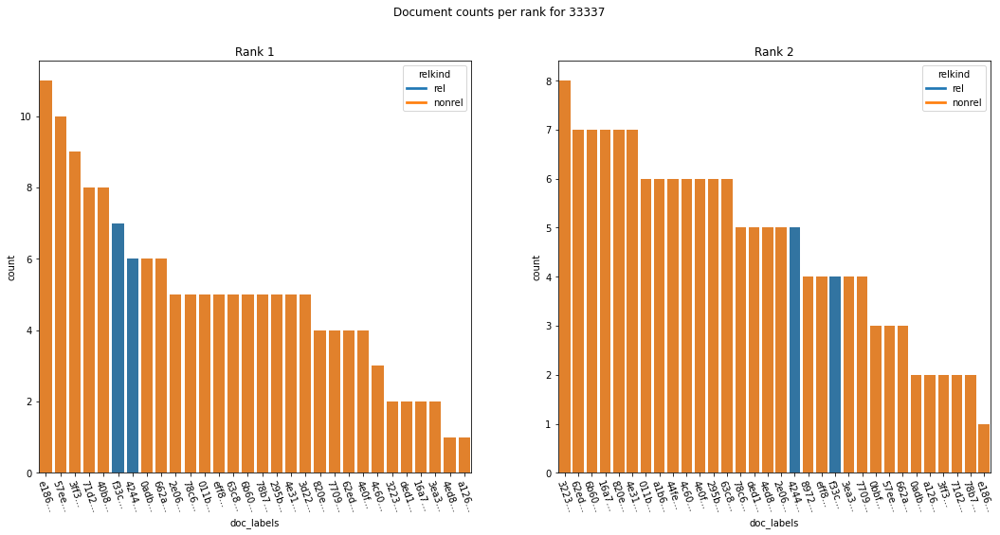

In [71]:
for q in edf.tail(10).qid.to_list():
    rel,nonrel = count_relgrades_qid(q,reldf)
    plot_doc_occurrence_per_rank_for_qid(q,rdf,reldf,k=rel)

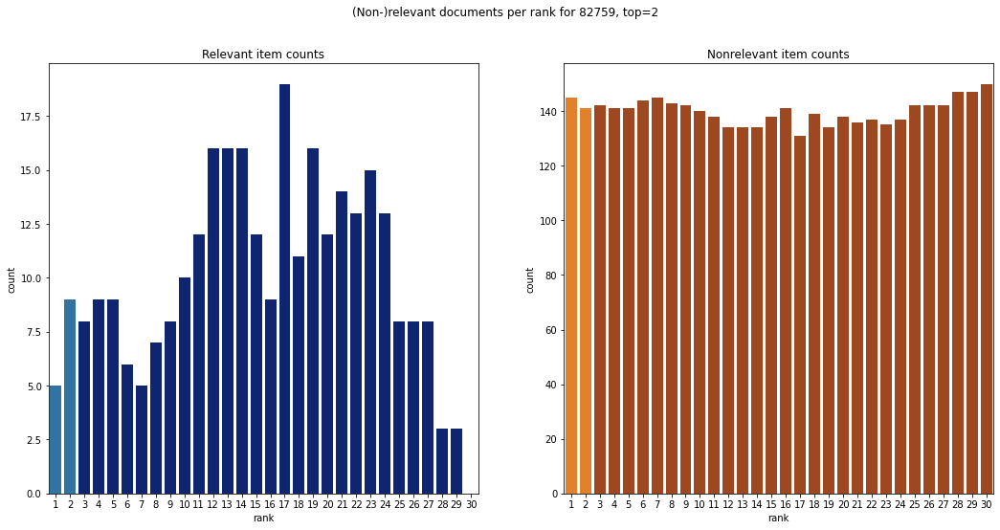

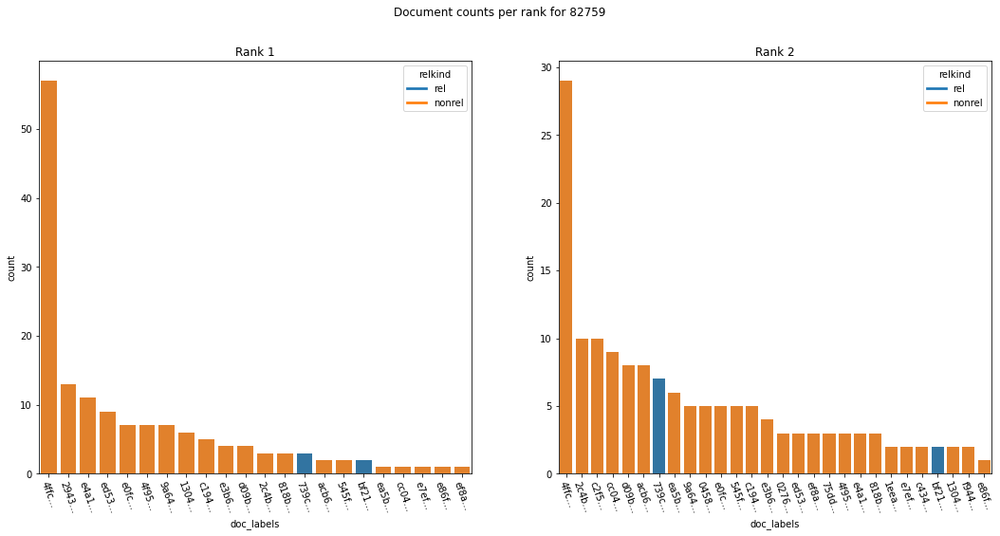

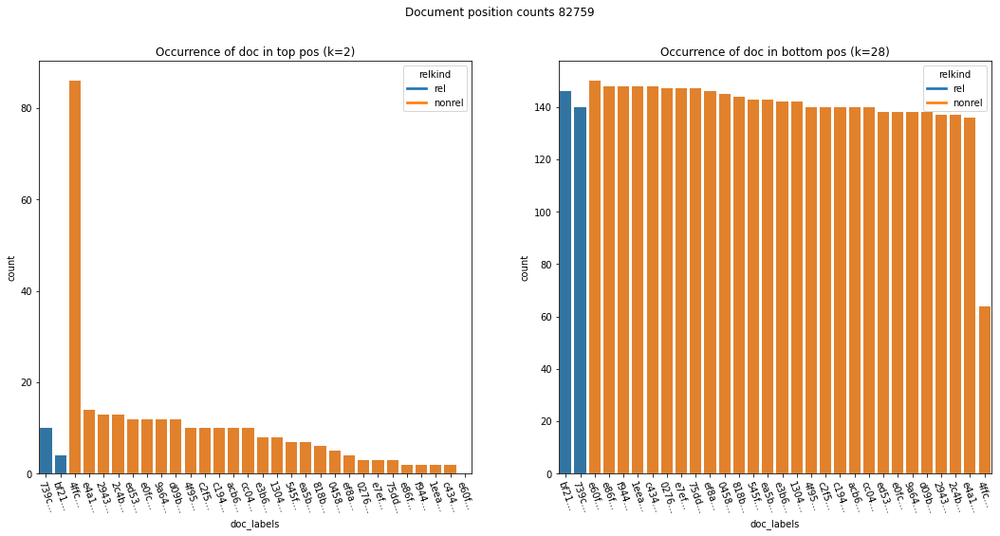

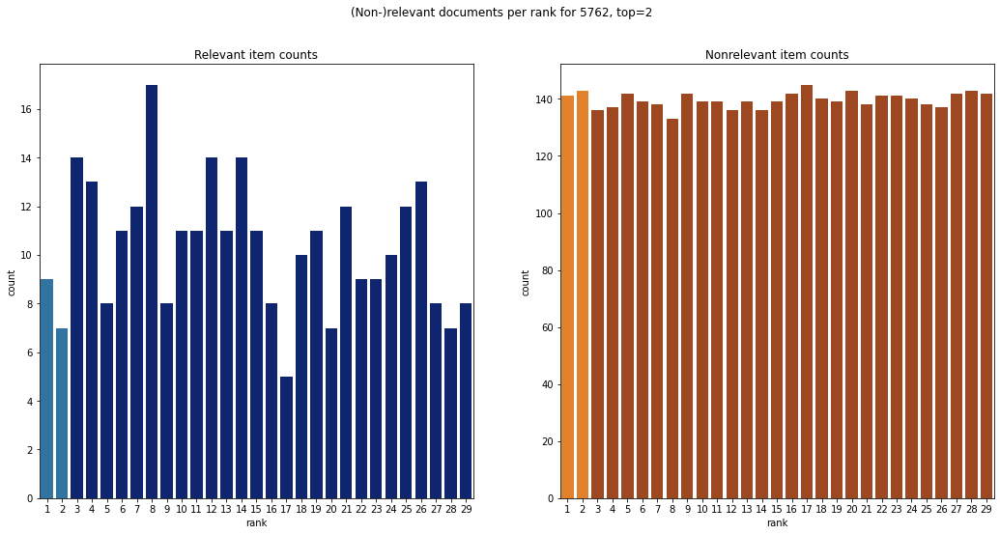

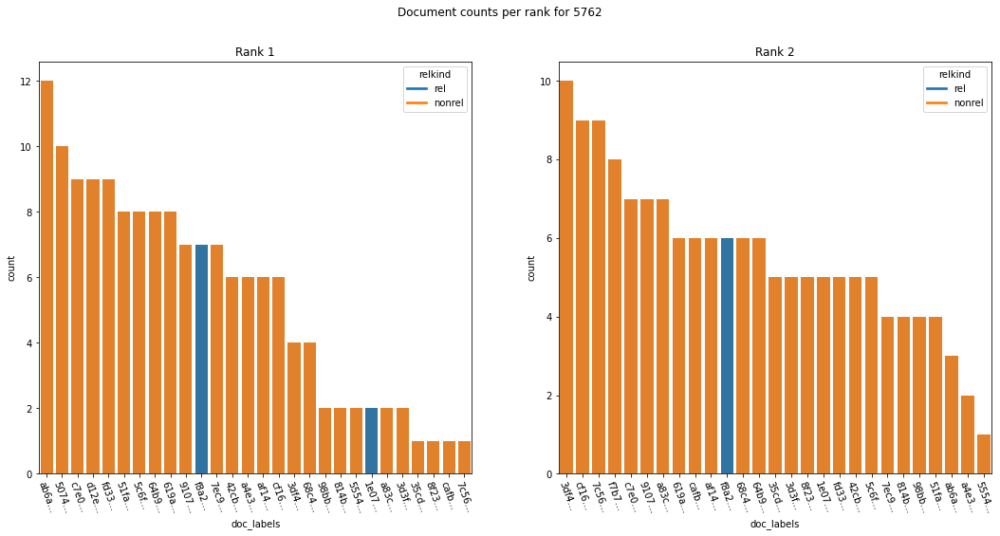

...

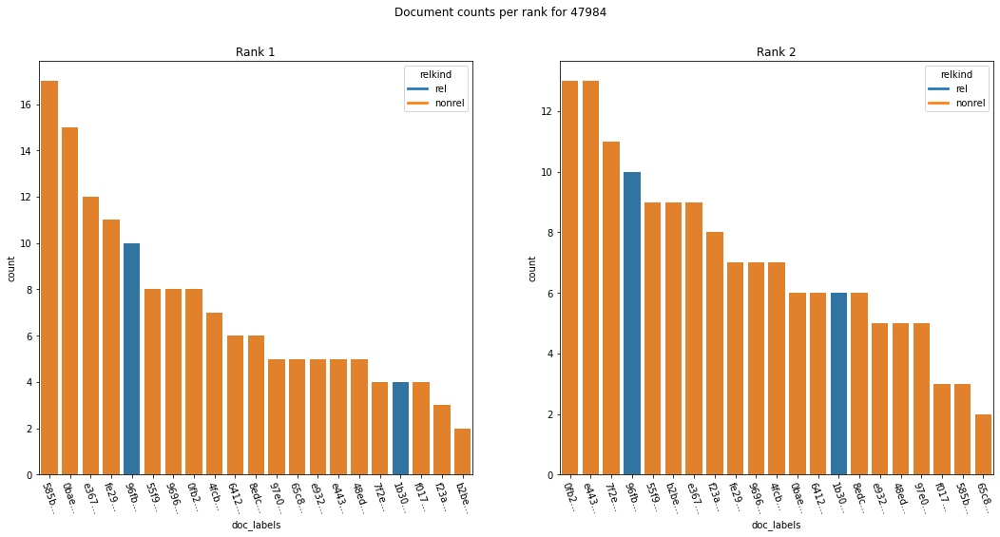

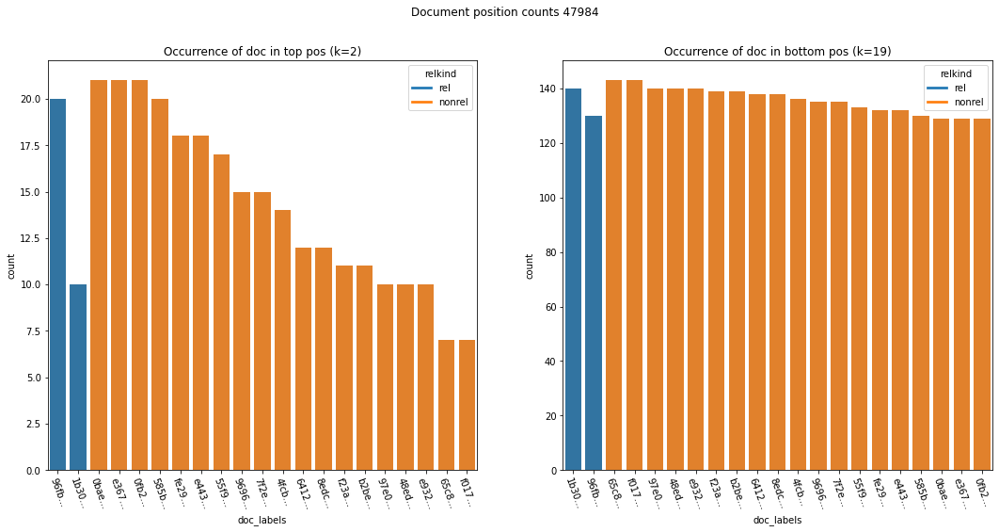

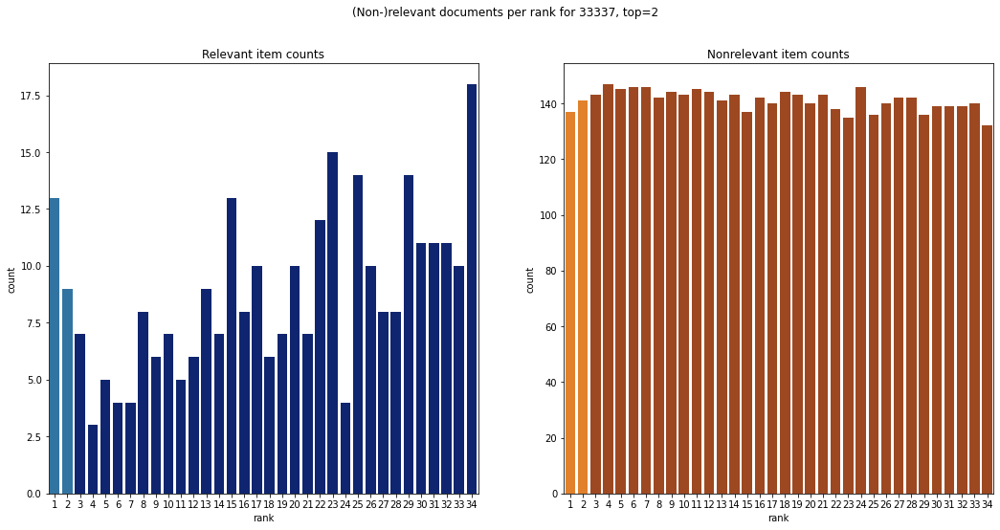

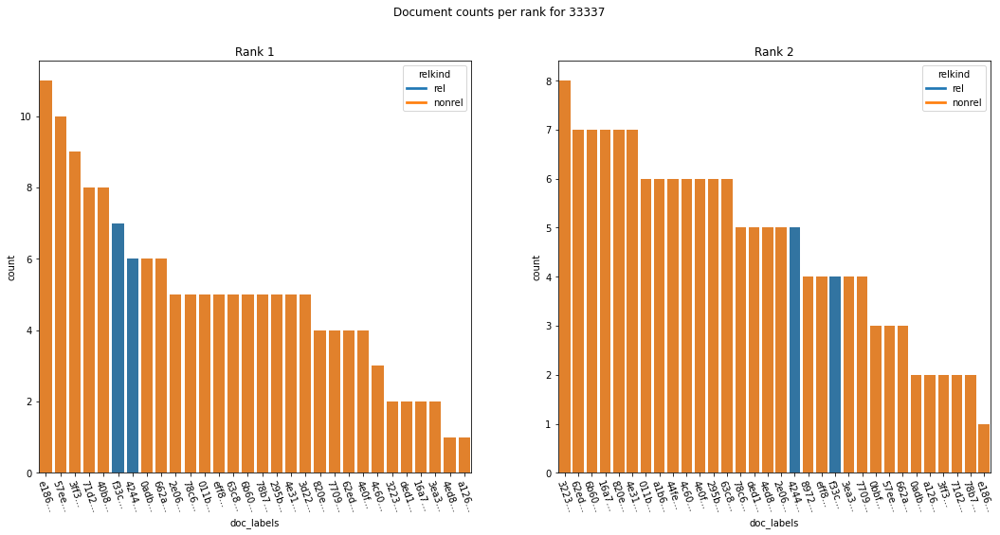

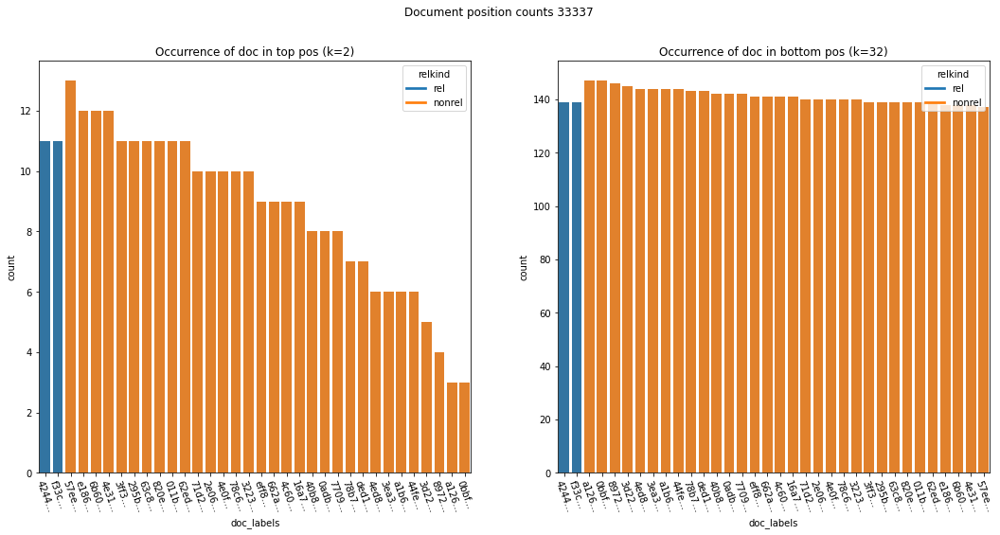

In [260]:
for q in edf.tail(10).qid.to_list():
    rel,nonrel = count_relgrades_qid(q,reldf)
    plot_rel_nonrel_per_rank_per_relkind_for_qid(q, rdf, reldf)
    plot_doc_occurrence_per_rank_for_qid(q,rdf,reldf,k=rel)
    plot_doc_pos_count_for_qid(q,rdf,reldf)

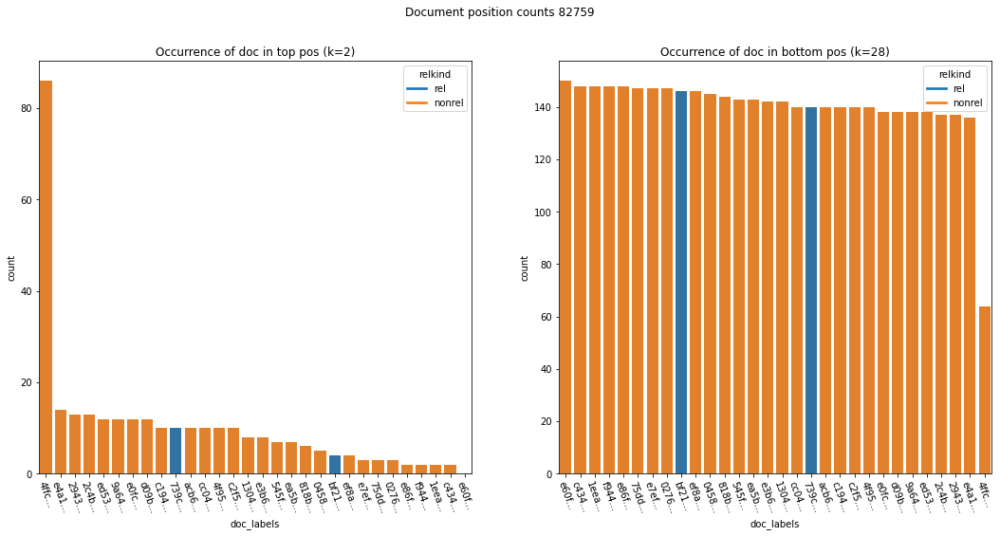

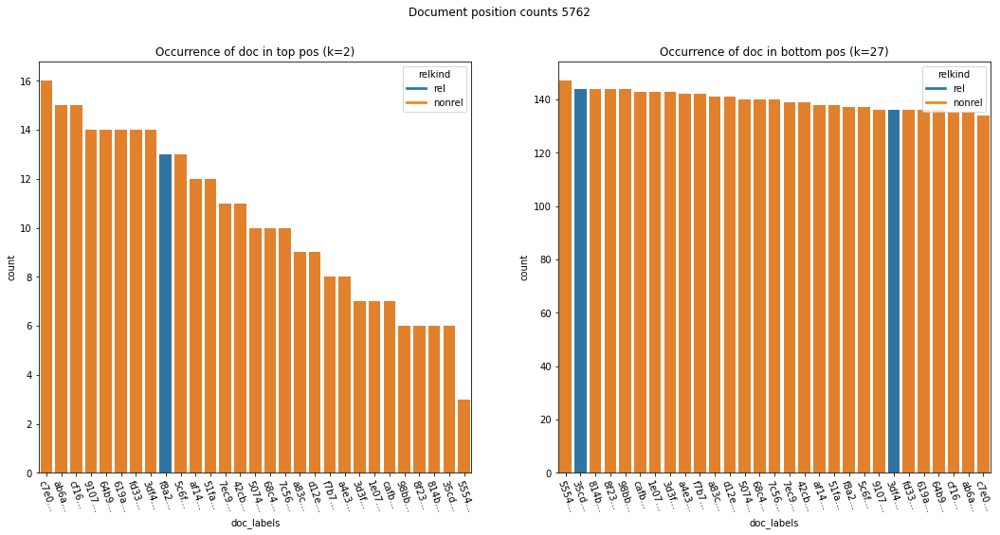

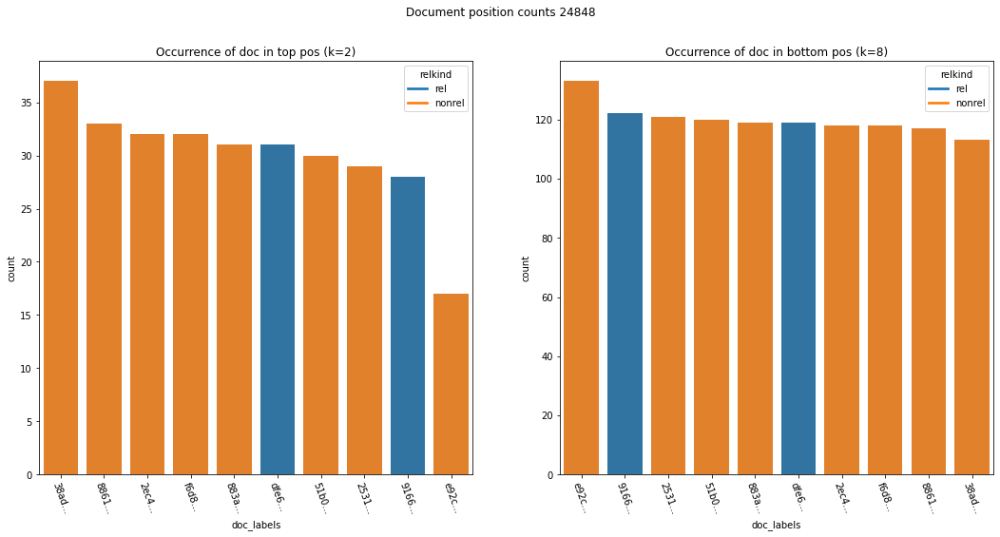

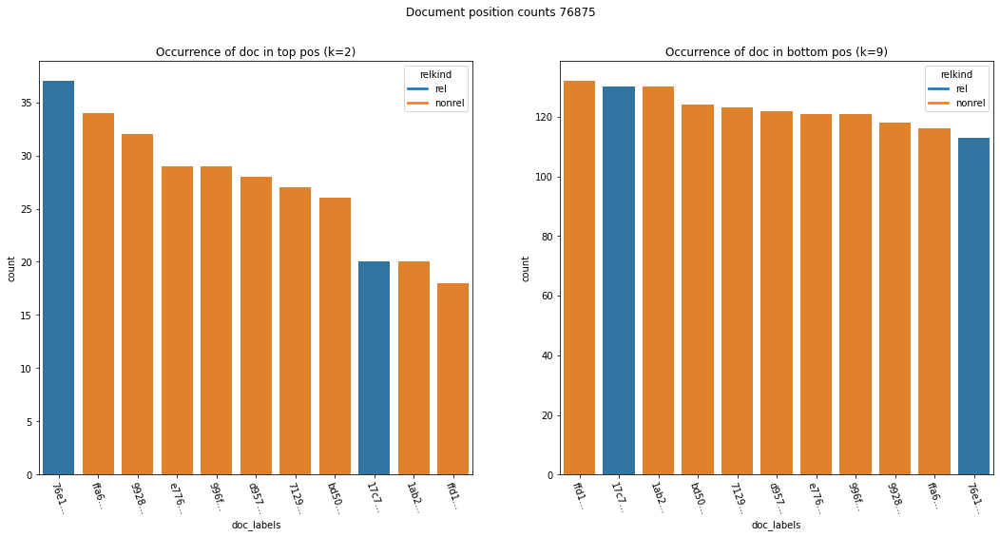

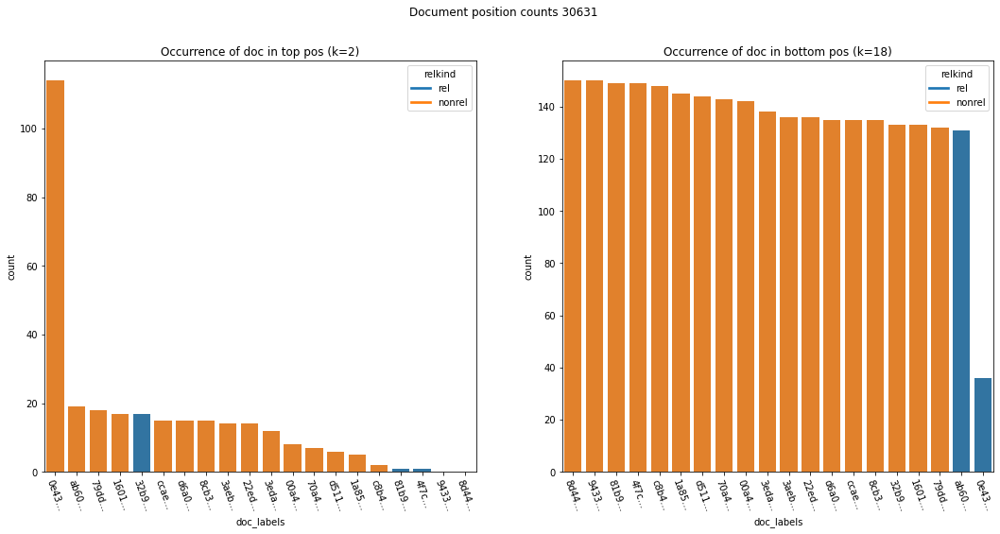

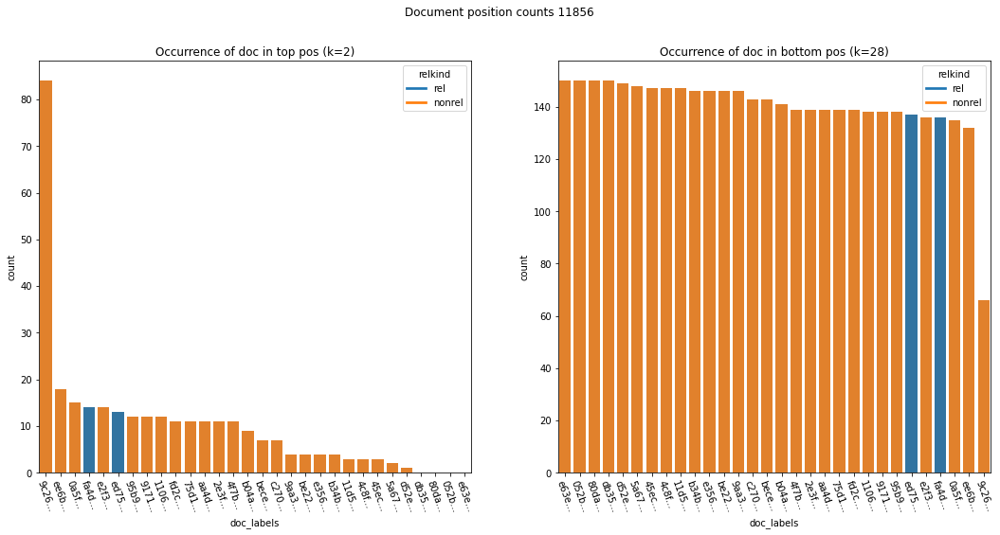

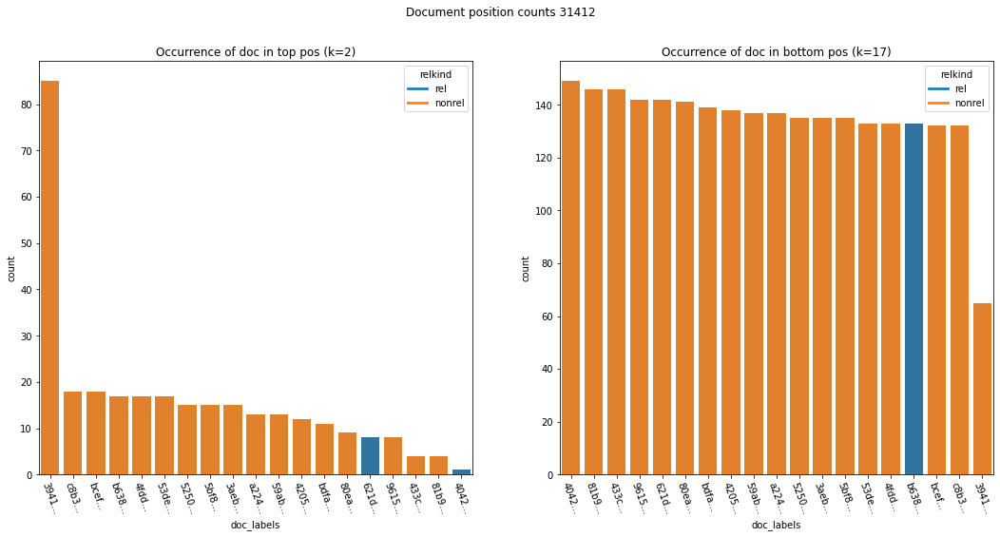

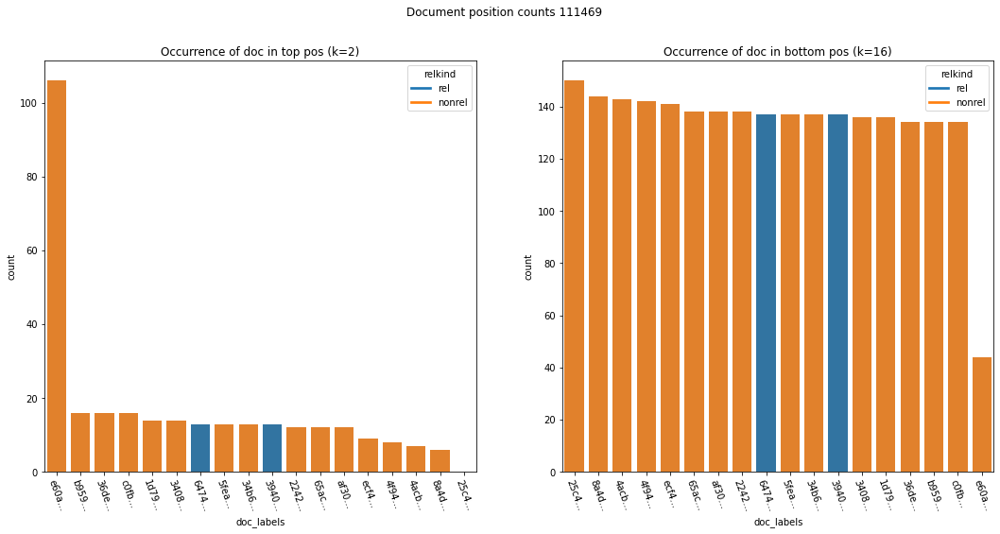

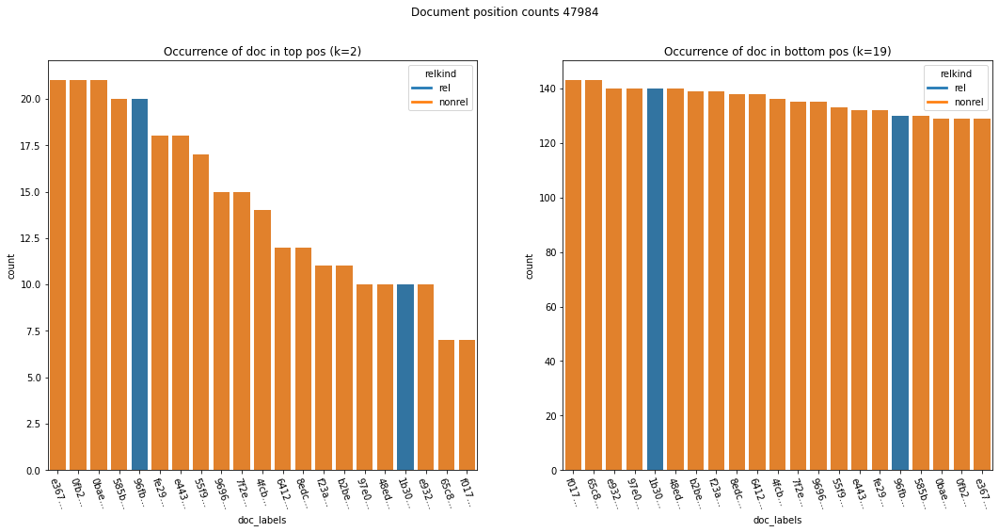

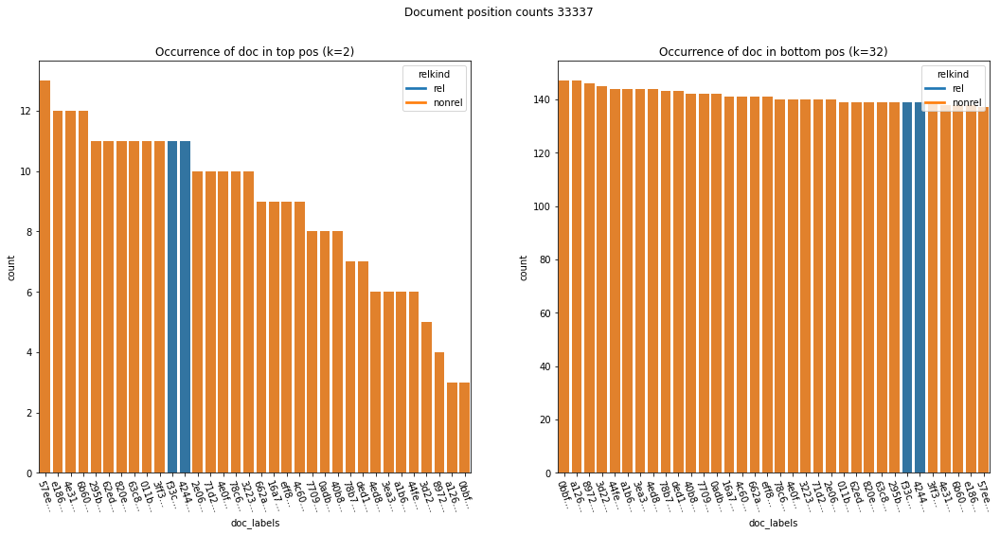

In [265]:
for q in edf.tail(10).qid.to_list():
    plot_doc_pos_count_for_qid(q,rdf,reldf,sortby=['count'])

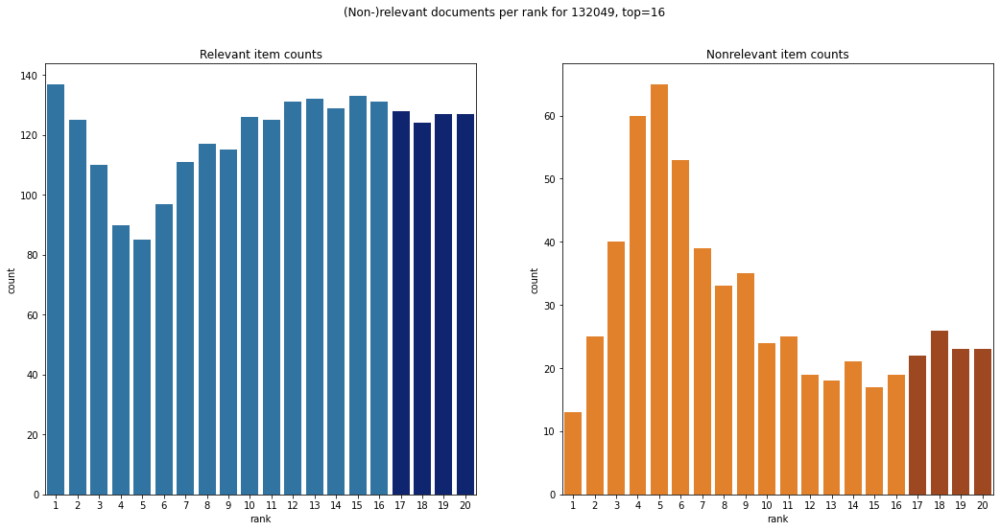

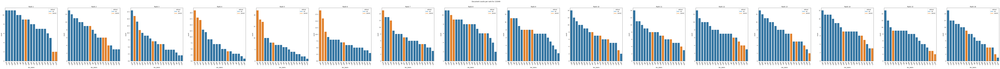

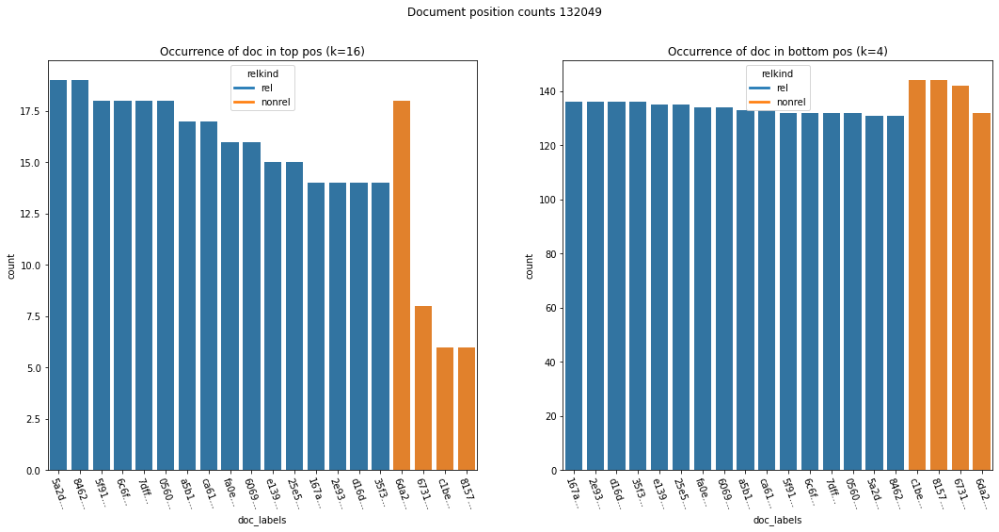

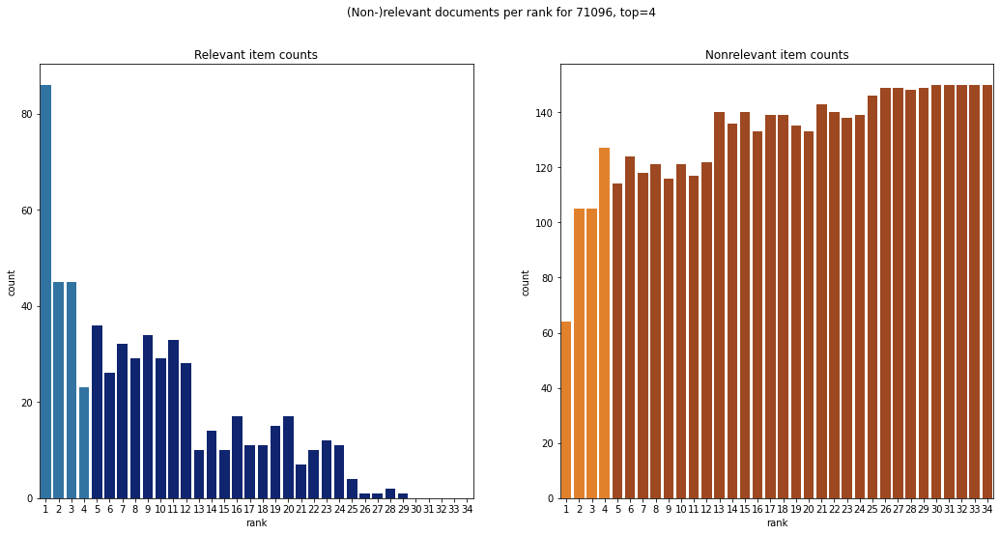

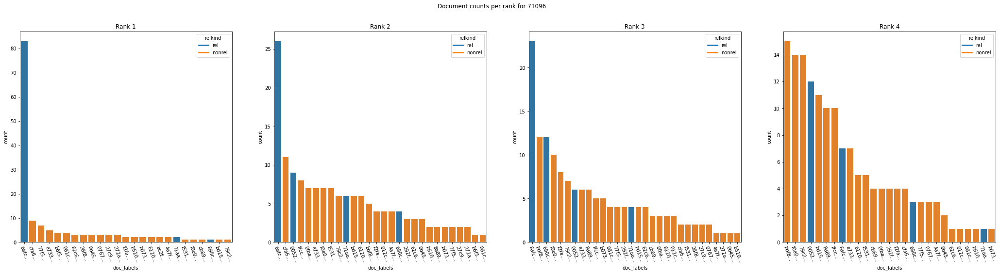

...

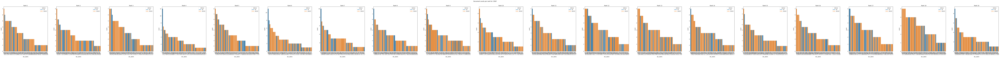

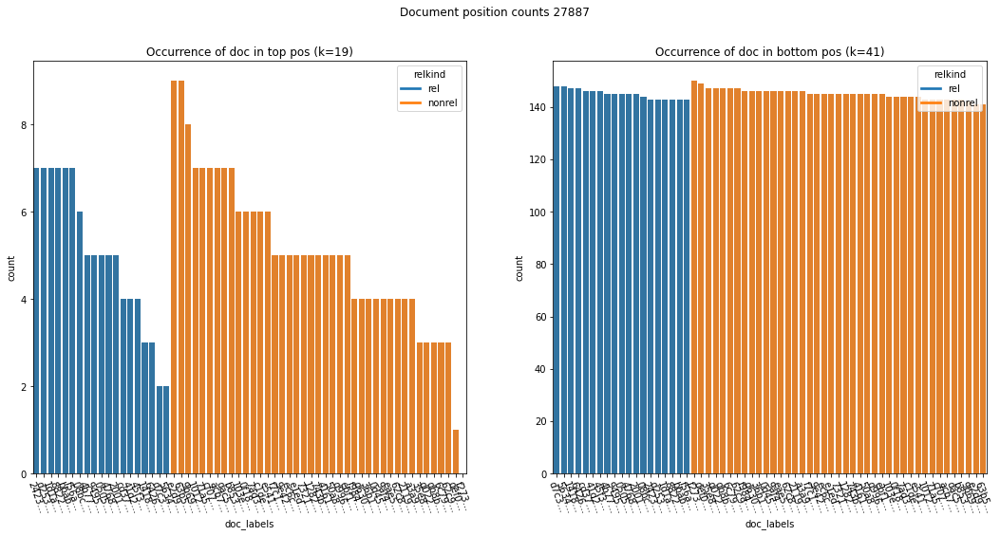

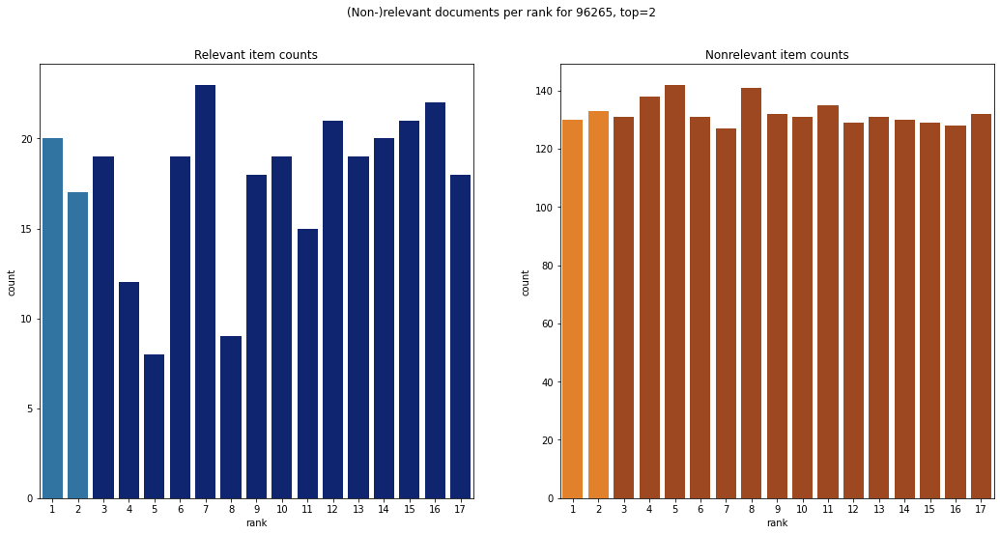

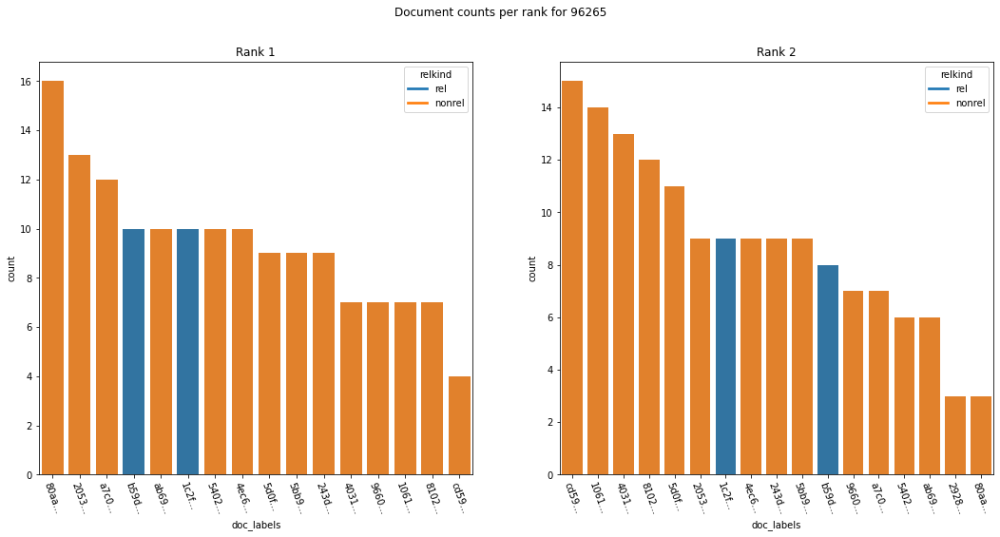

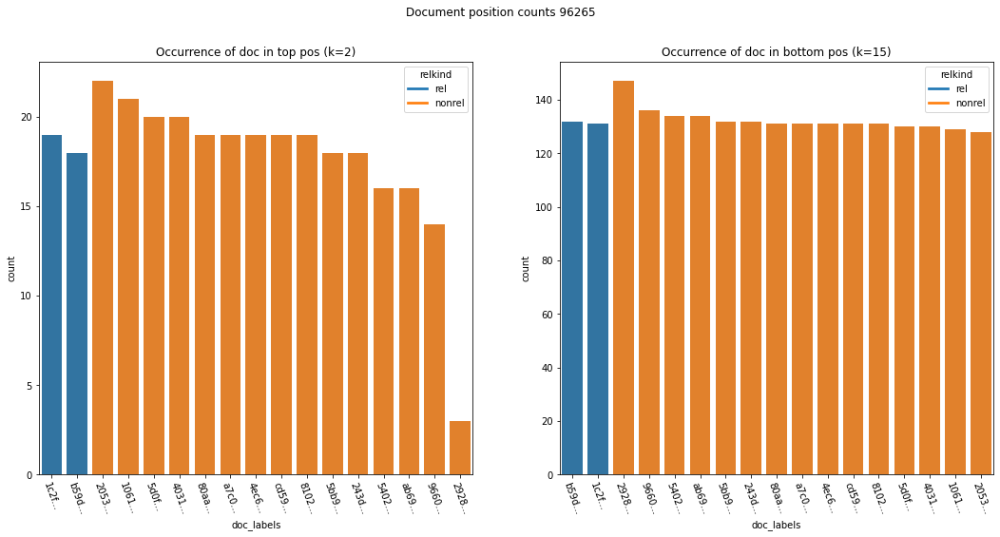

In [259]:
for q in edf.head(10).qid.to_list():
    rel,nonrel = count_relgrades_qid(q,reldf)
    plot_rel_nonrel_per_rank_per_relkind_for_qid(q, rdf, reldf)
    plot_doc_occurrence_per_rank_for_qid(q,rdf,reldf,k=rel)
    plot_doc_pos_count_for_qid(q,rdf,reldf)

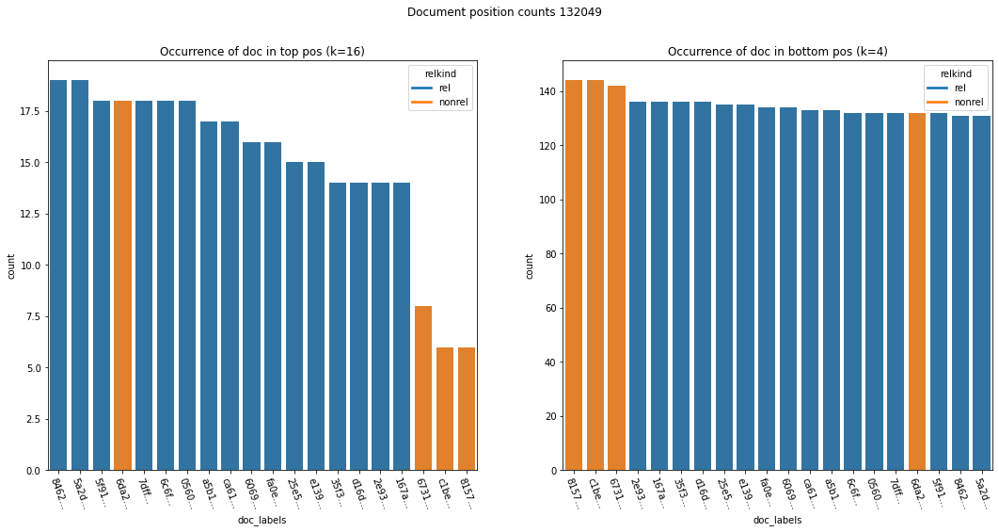

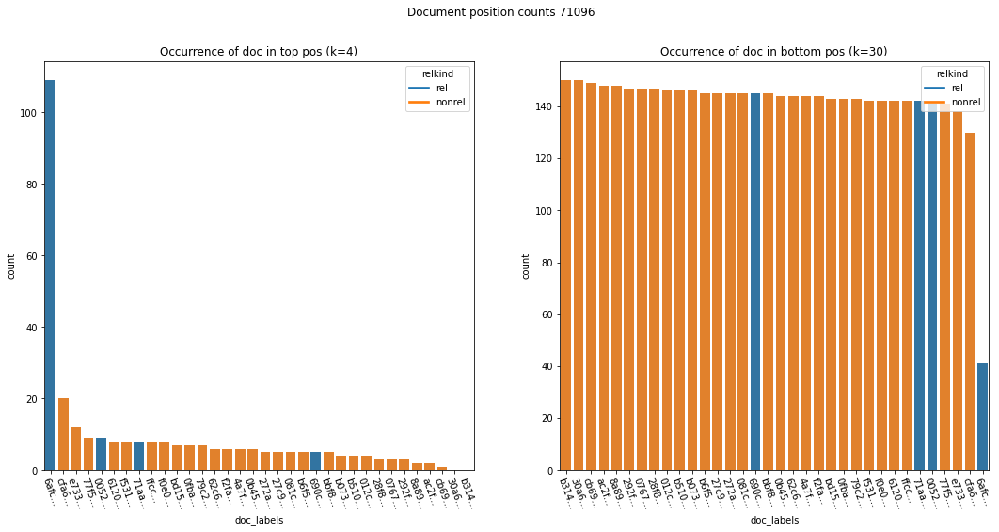

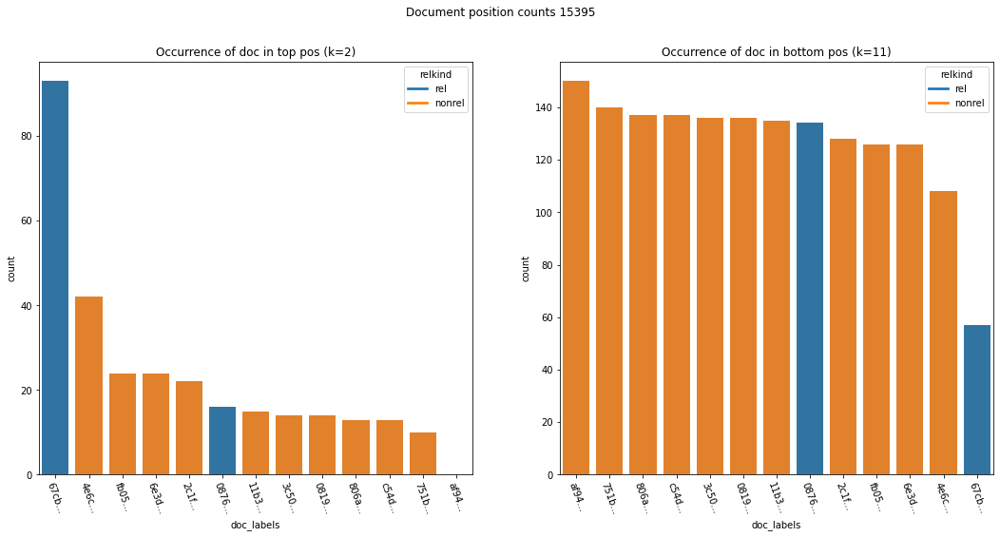

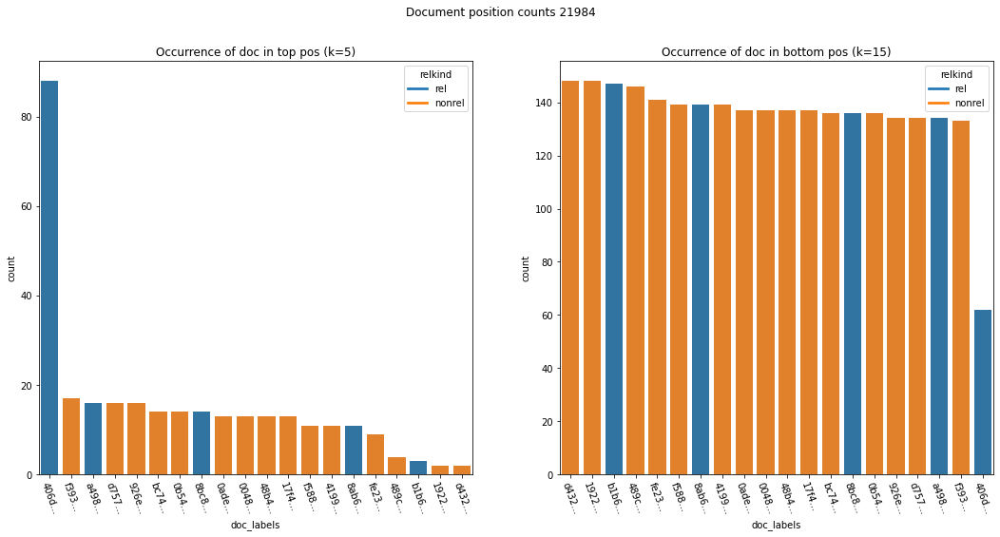

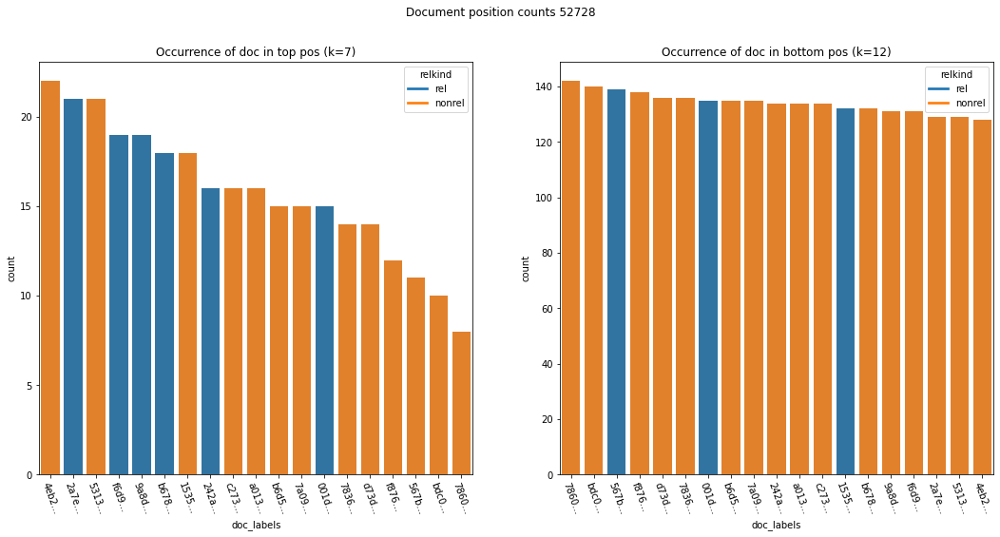

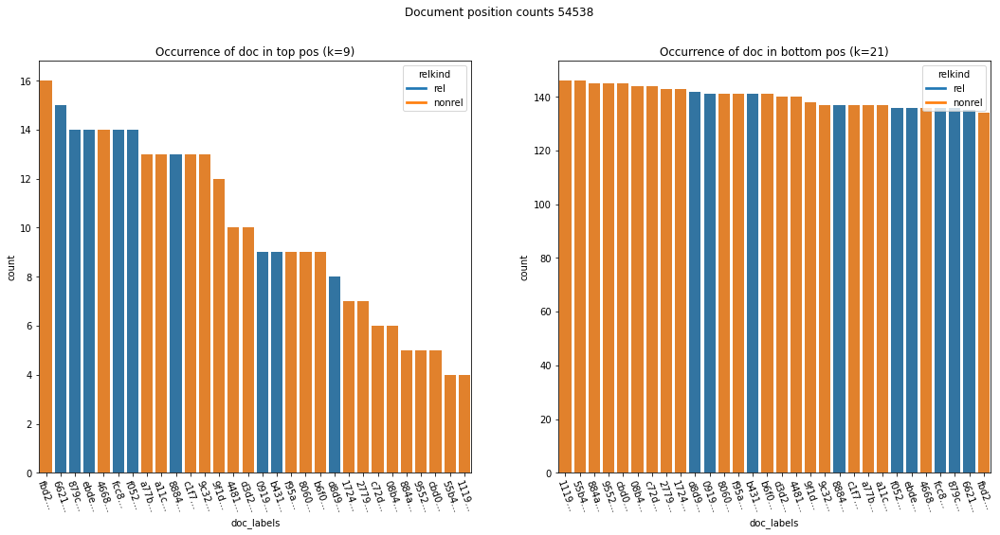

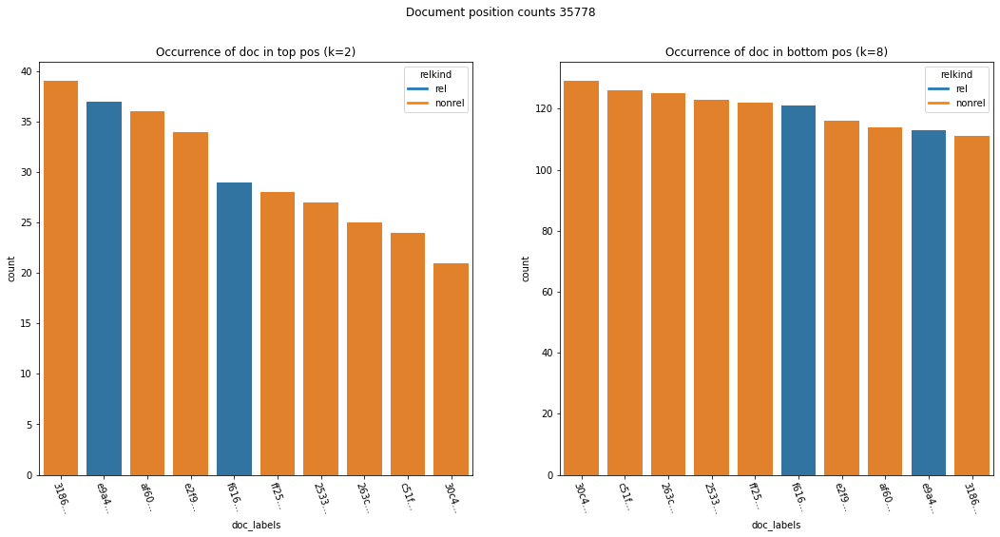

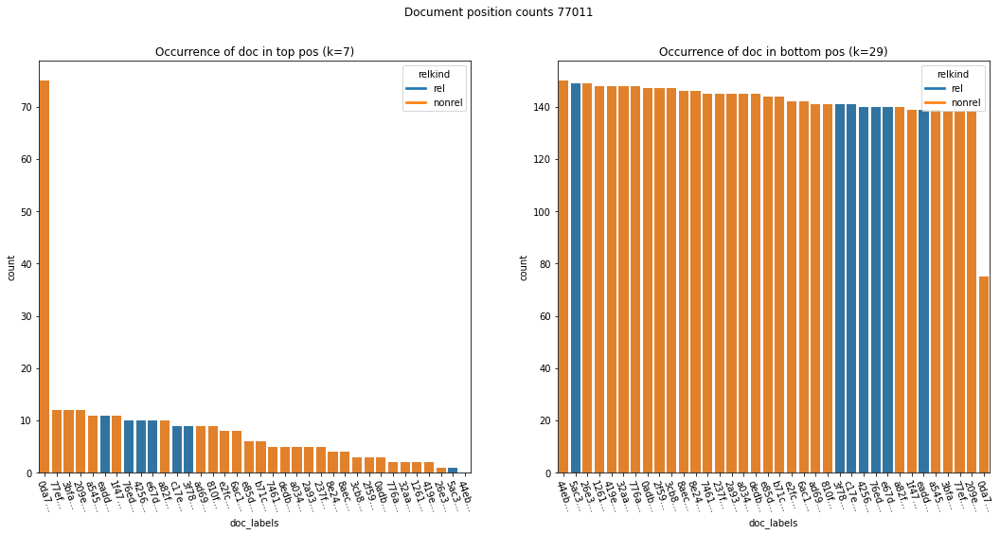

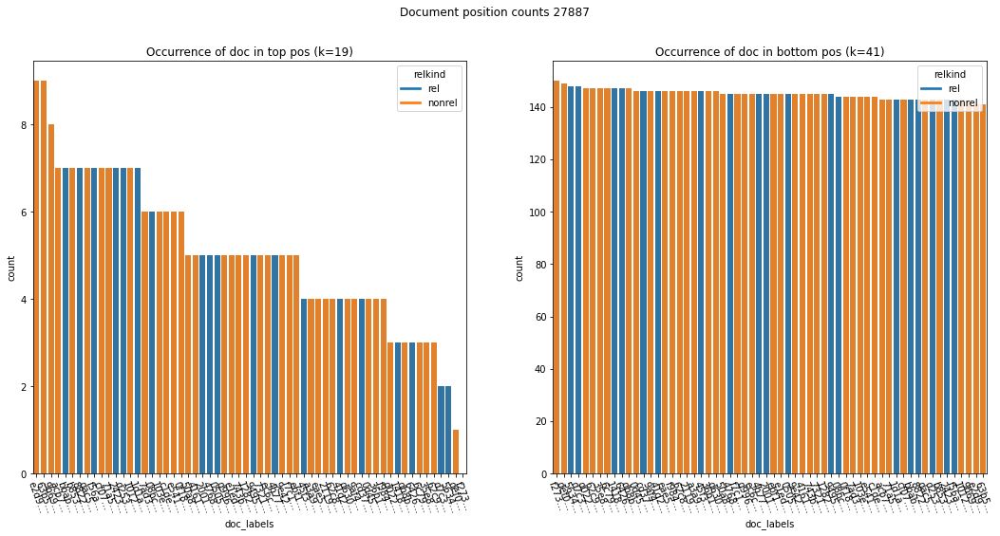

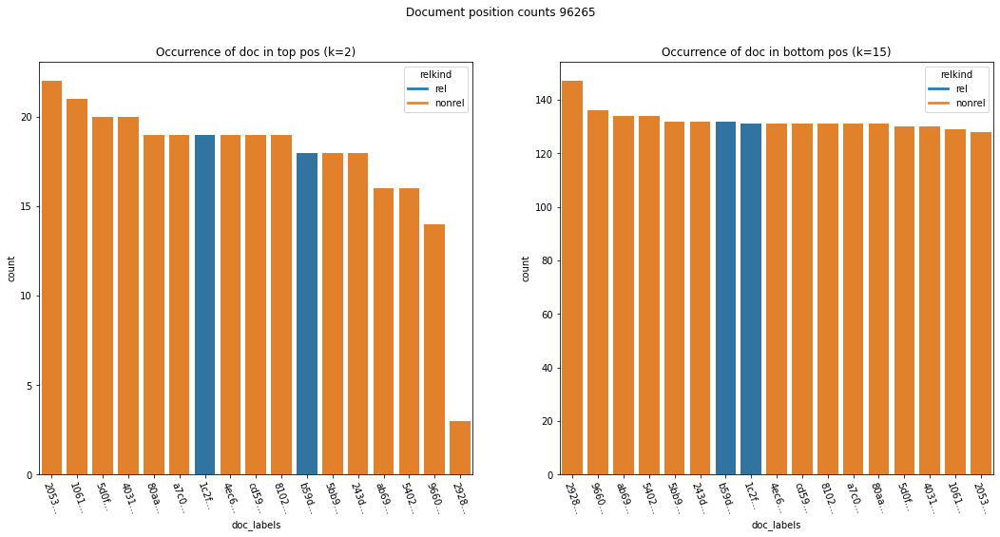

In [266]:
for q in edf.head(10).qid.to_list():
    plot_doc_pos_count_for_qid(q,rdf,reldf)

### Inspect spiking documents
The top relevant documents for queries 71096, 15395, and 21984 all spike above the rest of the queries in top positions. The documents are 6afc97668839a439e6858691ada76c9ddf798c2a, 67cb7ec0f36f9396b85b18cad90c0d7eec1658ce, 406d1ef750ba4520b8c57f95596cd42852c0e3fa.


### Multiple queries
Let's compare multiple queries and see if we can determine a pattern.

In [63]:
topqueries = edf.sort_values(by='difference',ascending=True).head(10)
bottomqueries = edf.sort_values(by='difference',ascending=False).head(10)

#### (Non-)relevant documents at each rank
For the top and bottom k=10 queries, we plot the number of (non-)relevant items at each rank.

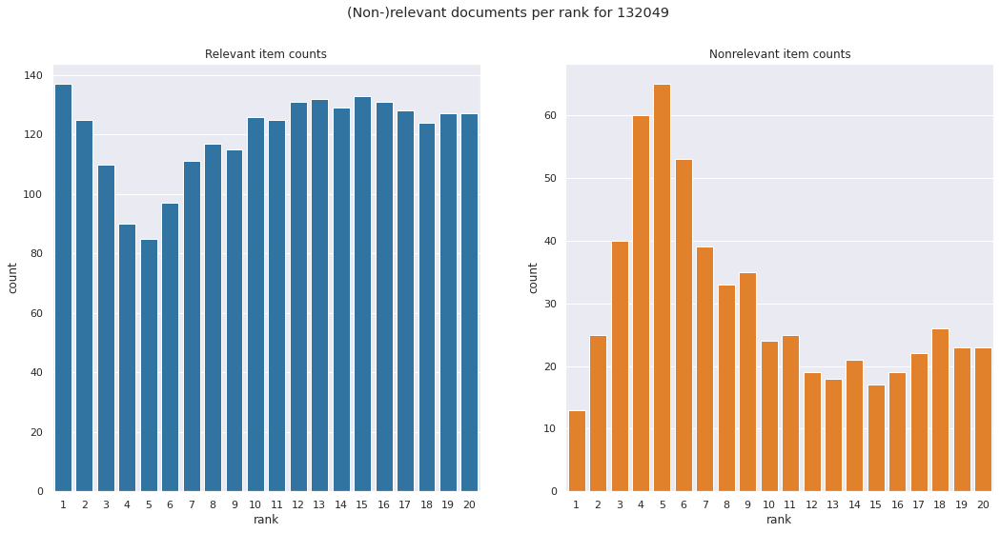

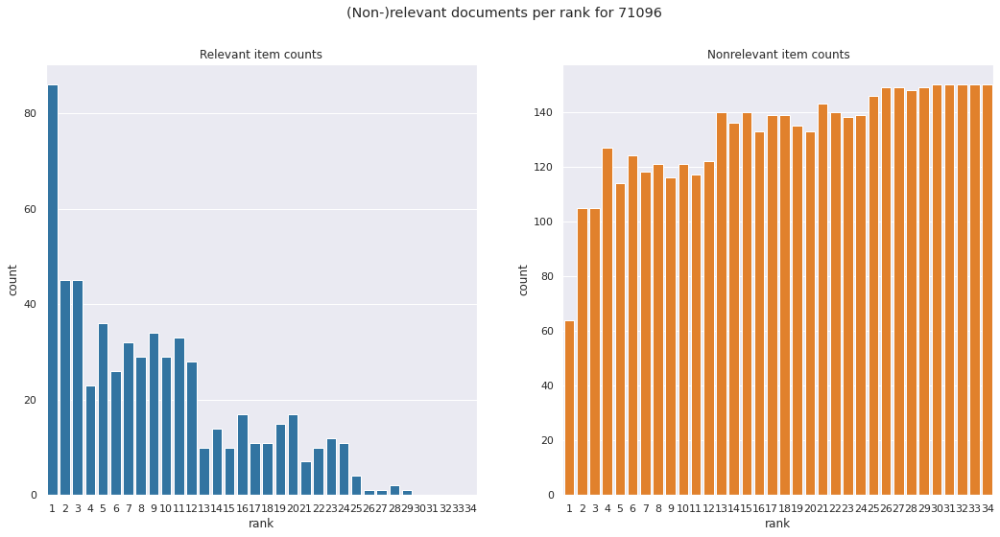

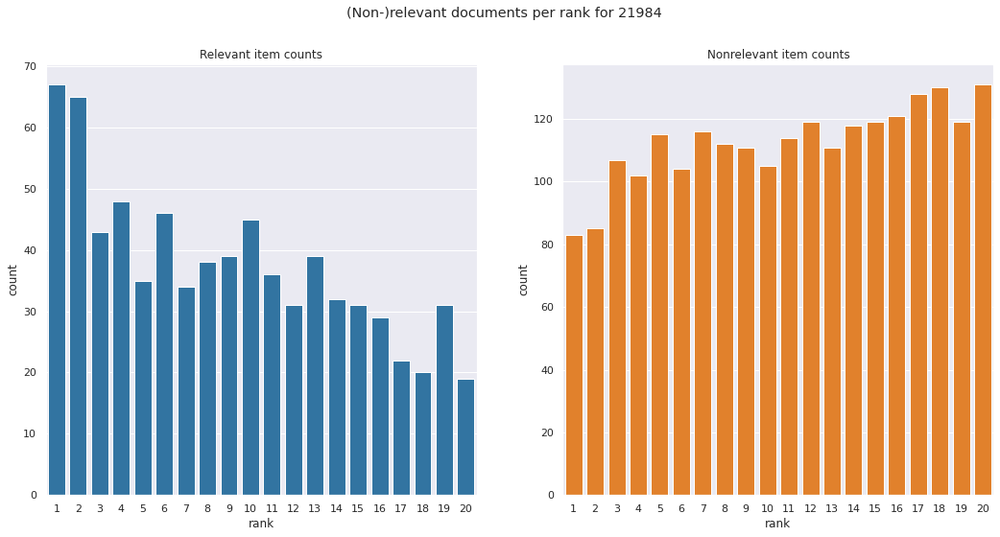

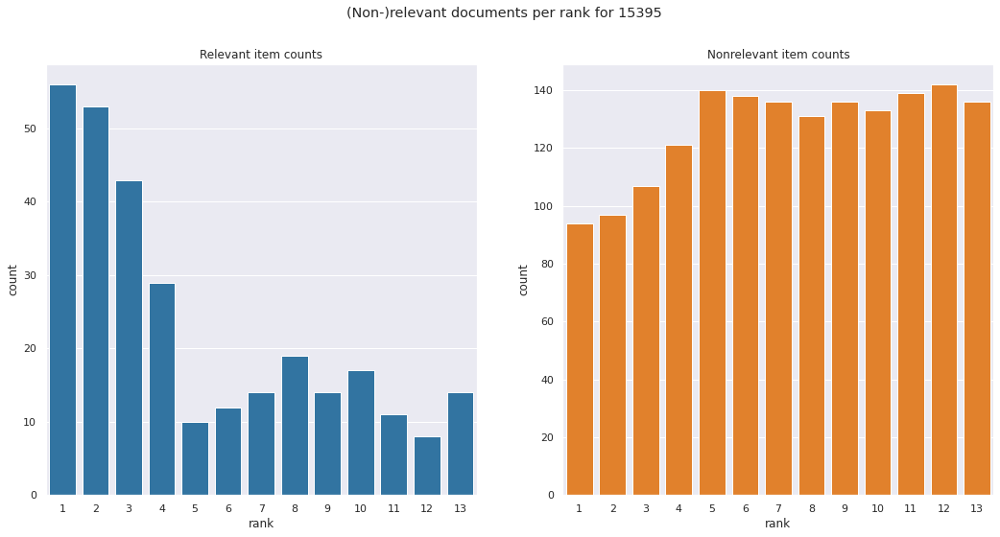

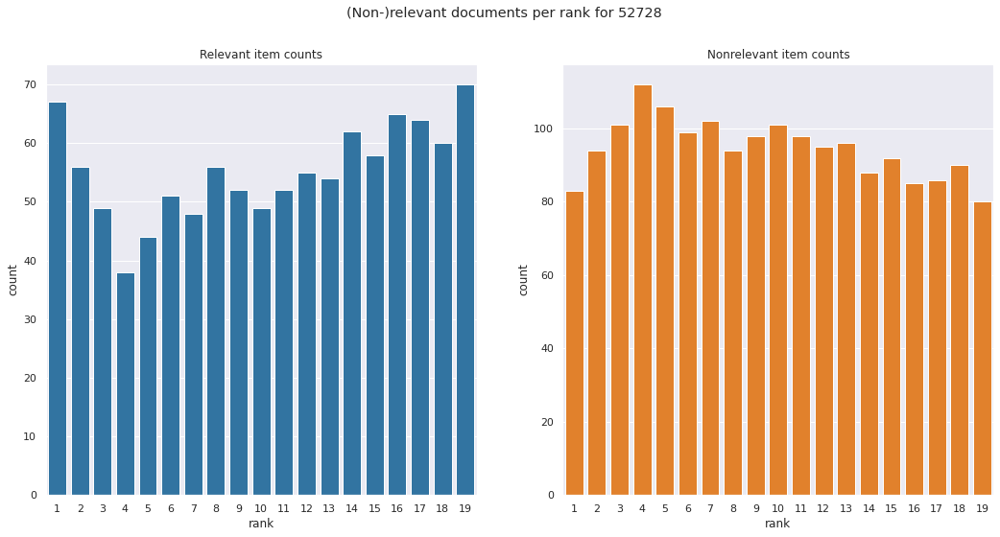

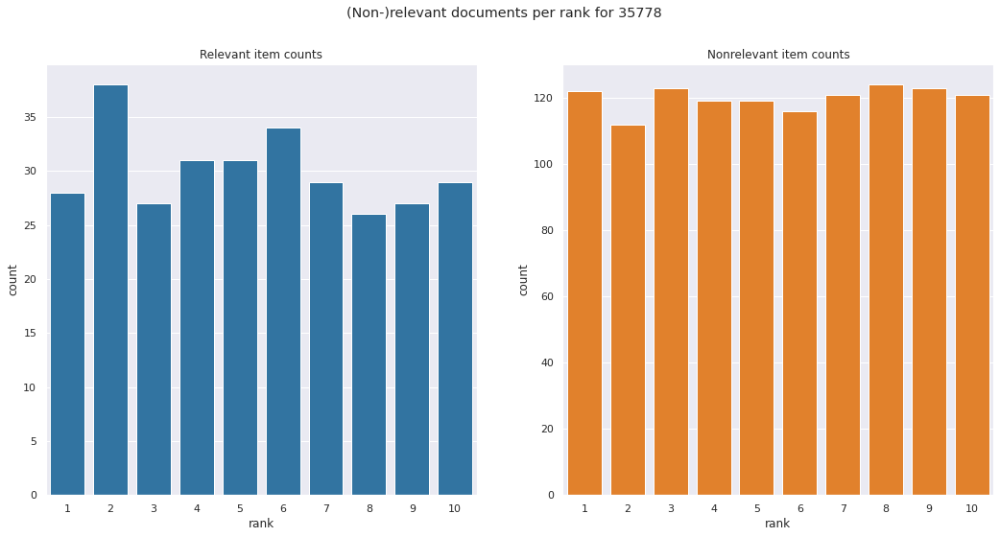

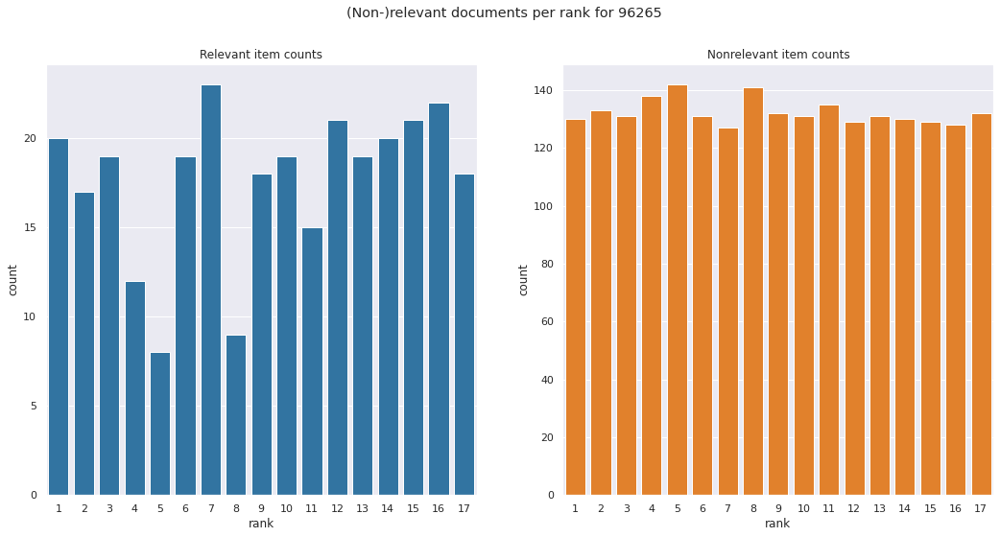

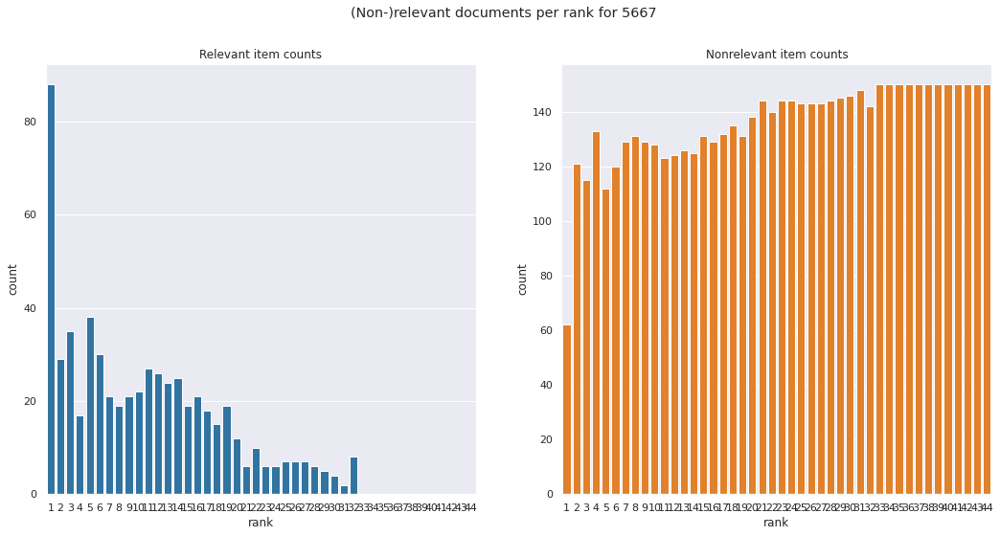

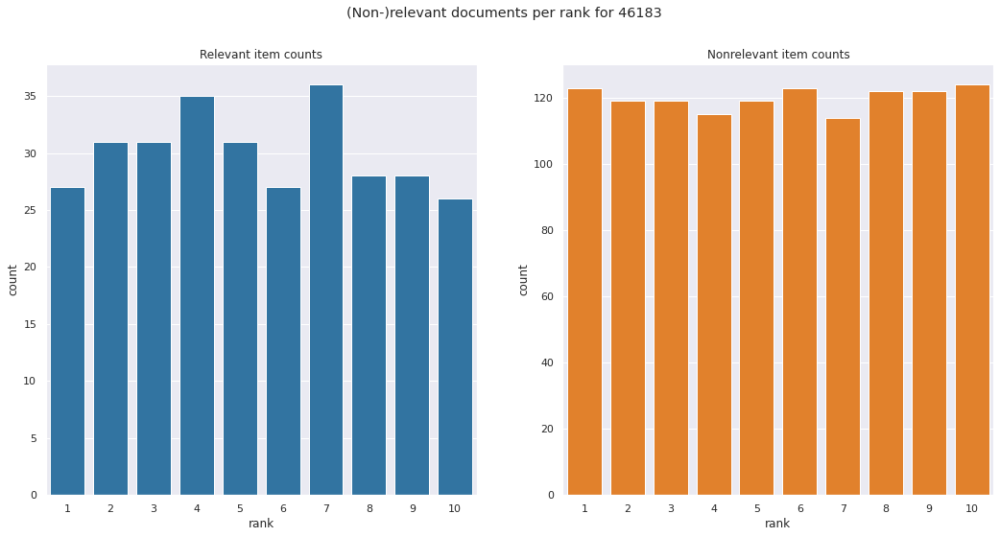

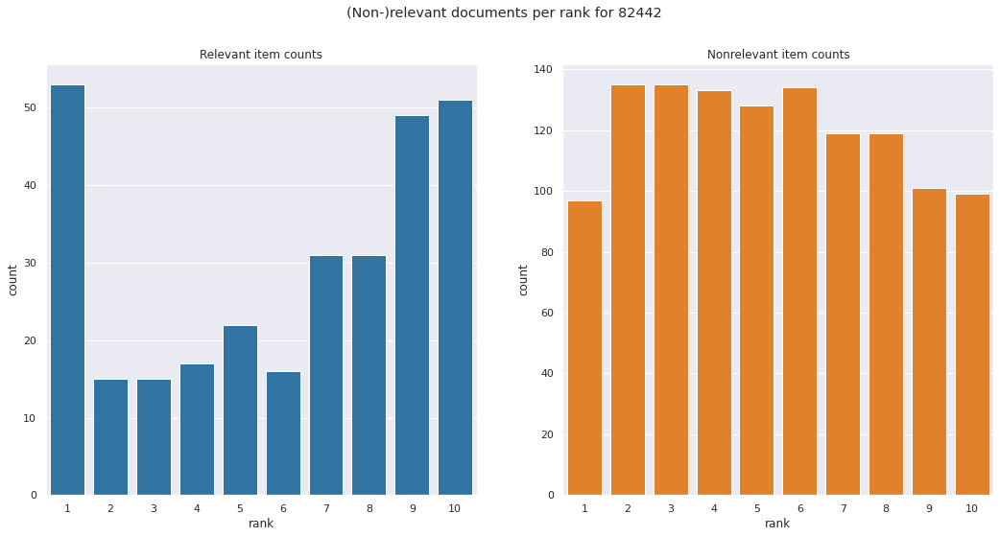

In [64]:
for q in topqueries.index.unique():
    plot_rel_nonrel_per_rank_per_relkind_for_qid(q, rdf, reldf)


##### Top queries
For the top queries, we see that the relevant documents are reasonably evenly distributed or skewed towards the higher rankings.

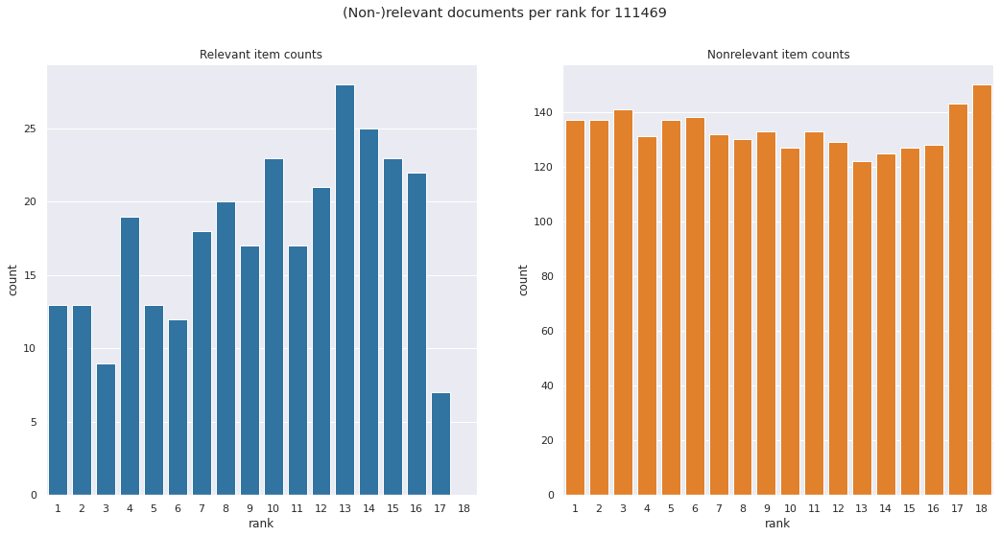

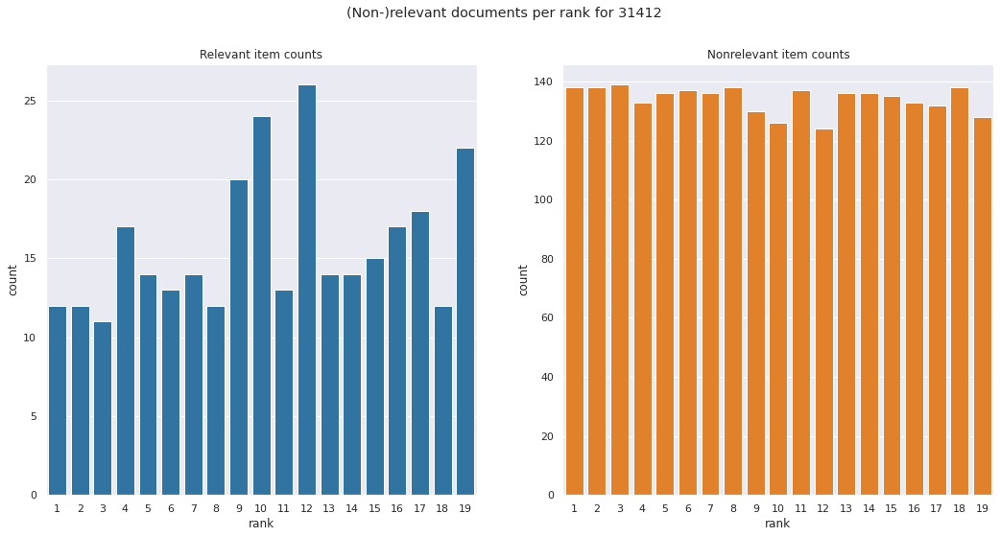

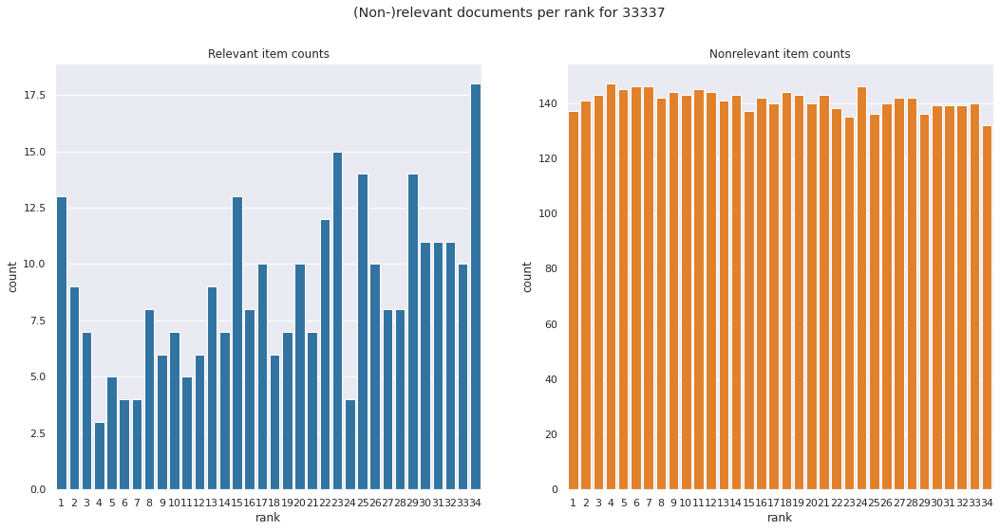

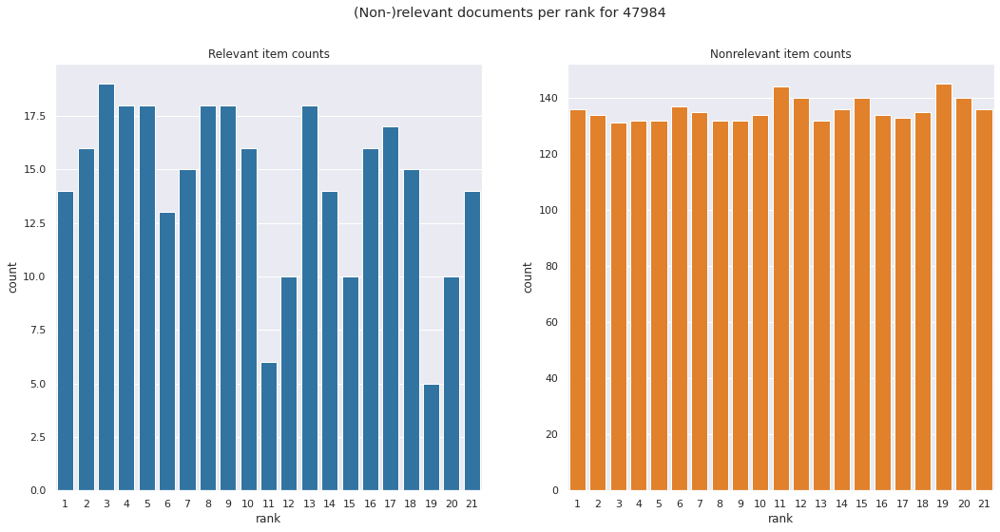

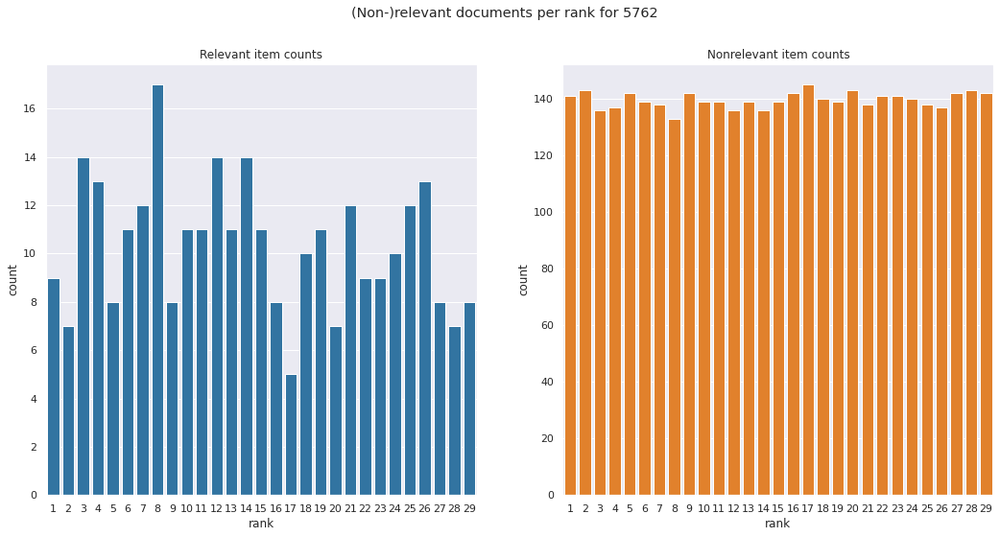

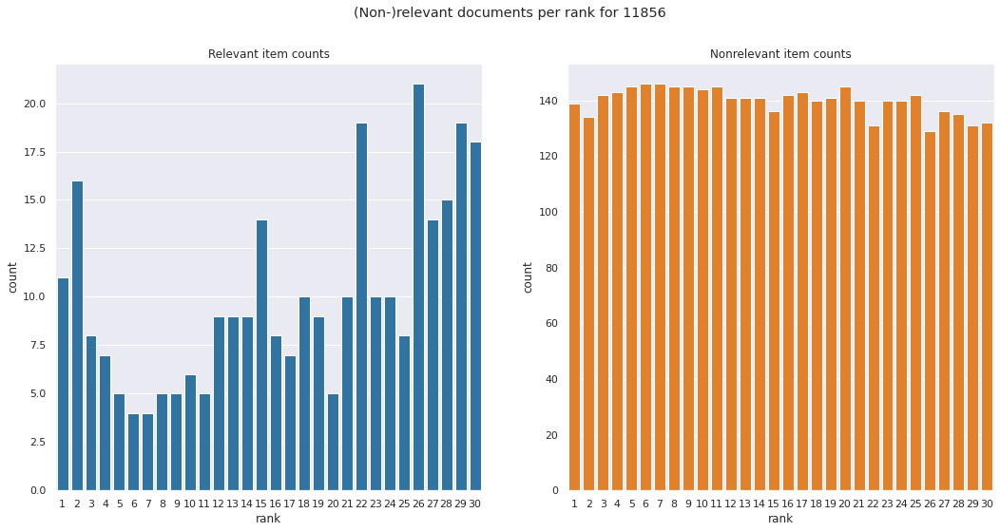

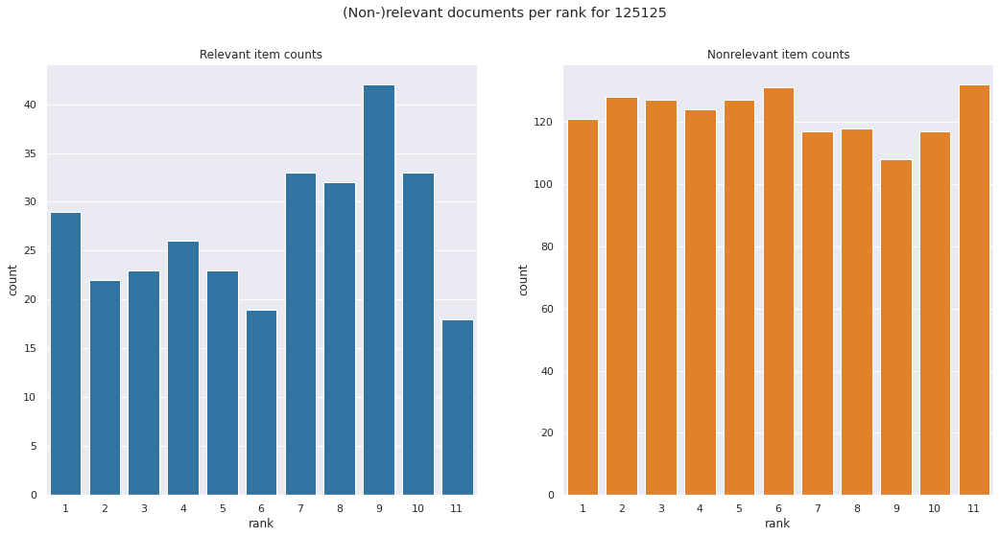

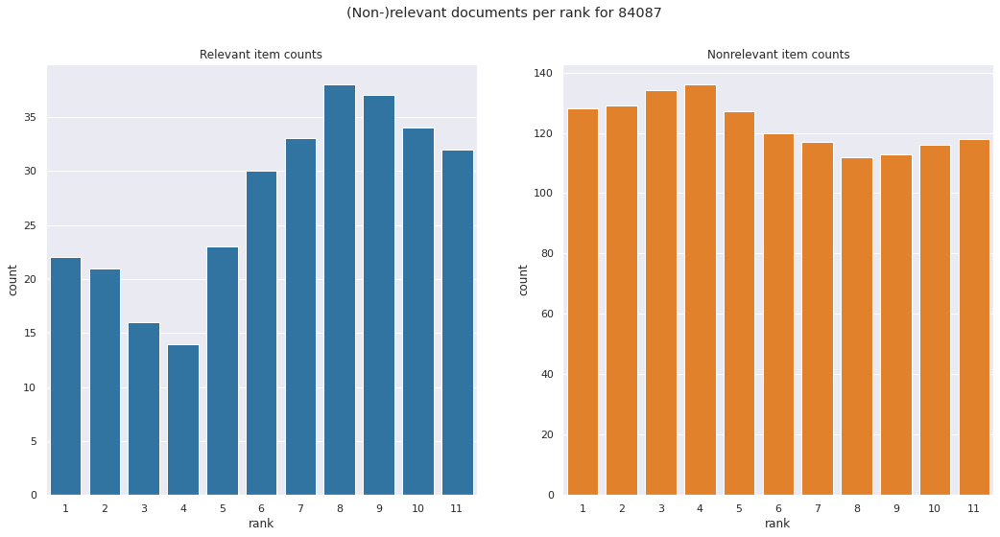

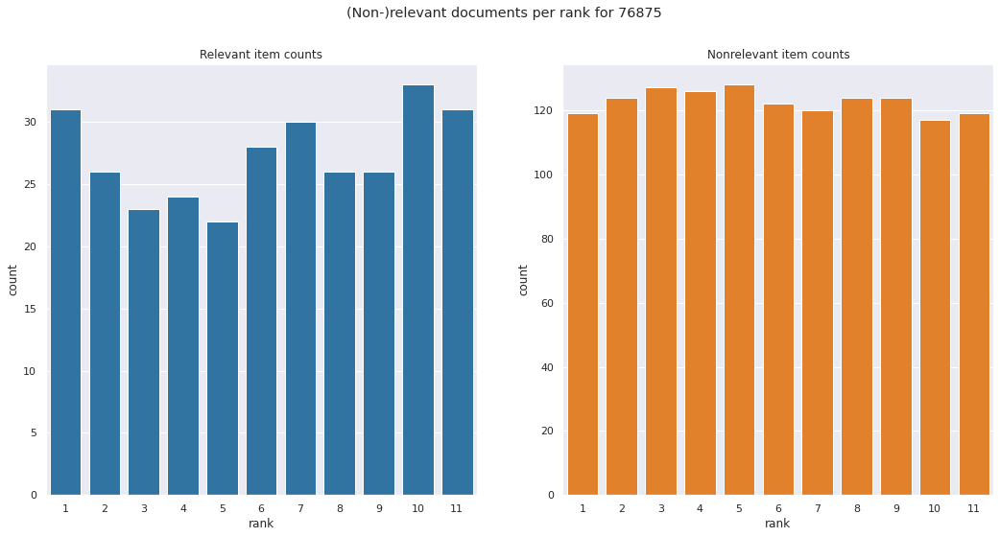

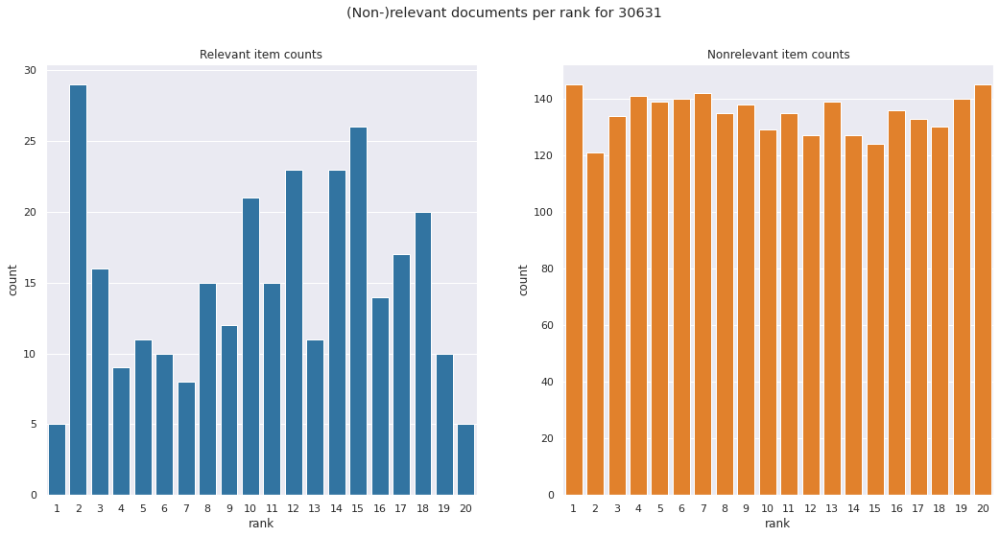

In [65]:
for q in bottomqueries.index.unique():
    plot_rel_nonrel_per_rank_per_relkind_for_qid(q, rdf, reldf)


##### Bottom queries
For the bottom queries we see that the relevant items are concentrated to either the middle or bottom ranks. **An exception is query 52501, where the relevant documents skew towards the top positions, and no relevant items are in the bottom positions at all.**

#### Doc occurrence per rank
We plot how often each document occurs at each rank. We plot all of the top positions and the bottom 5 positions.

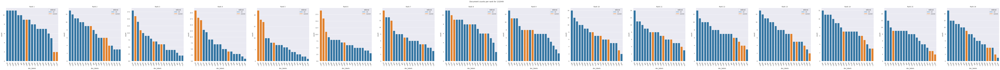

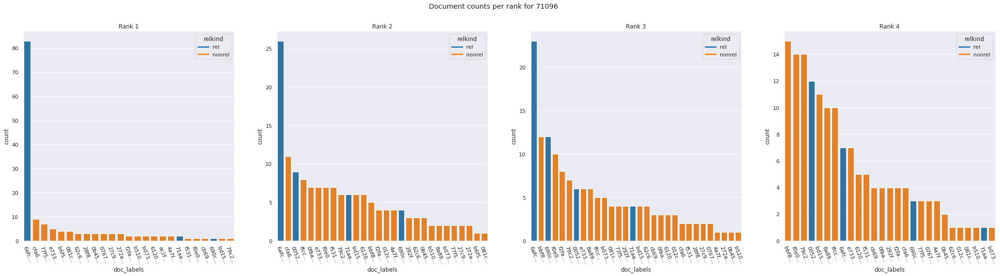

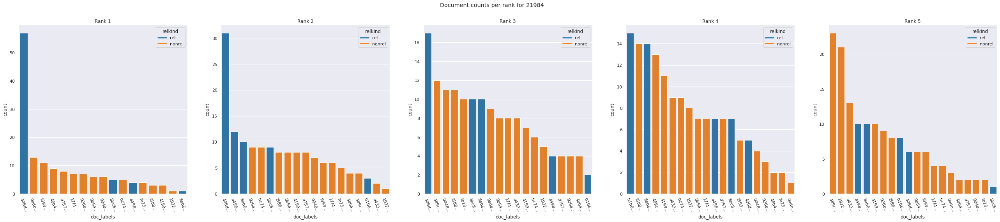

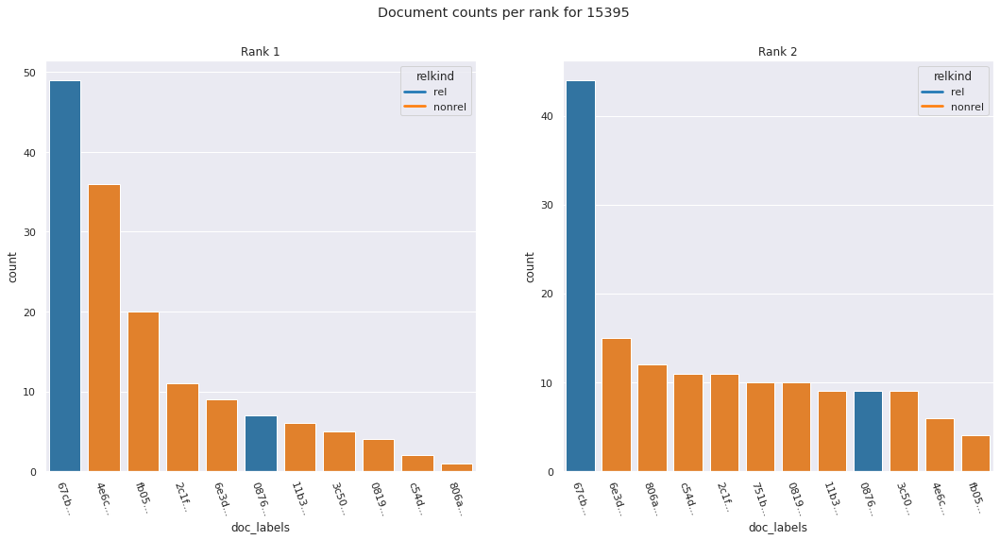

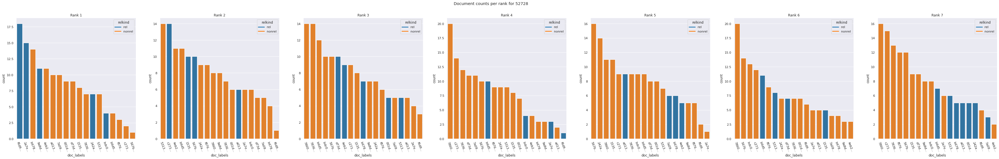

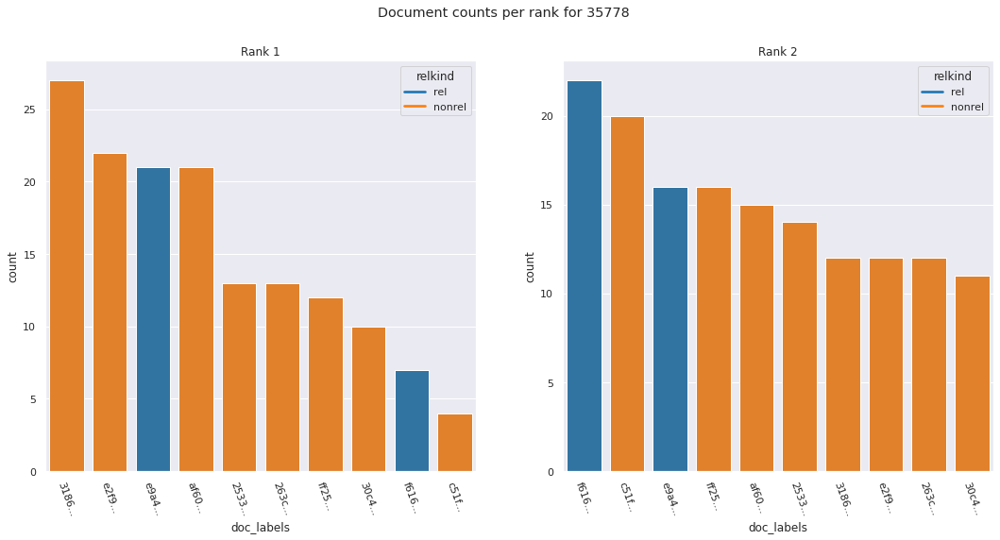

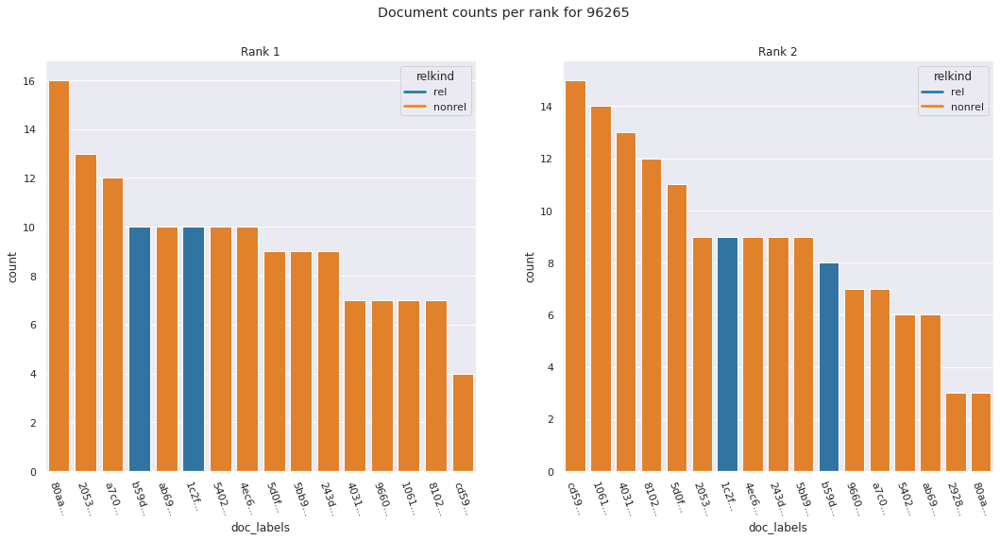

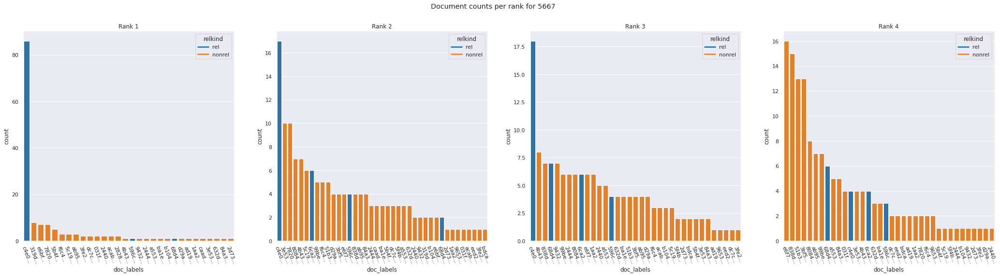

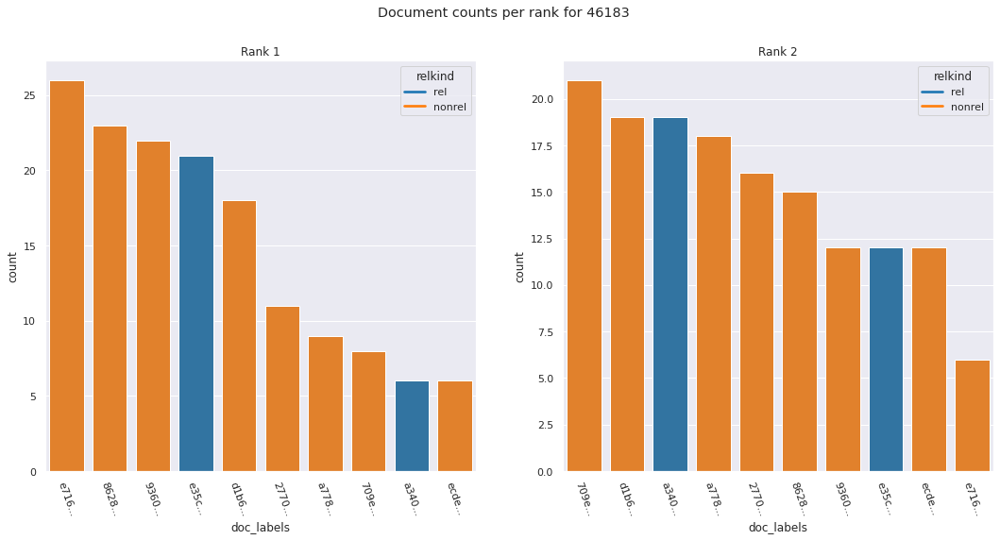

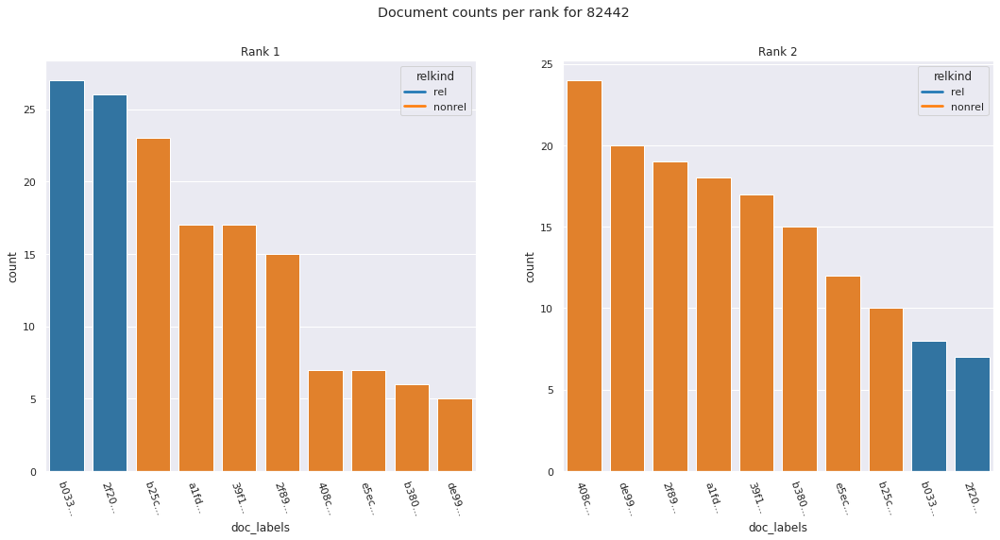

In [66]:
for q in topqueries.index.unique():
    rel,nonrel = count_relgrades_qid(q,reldf)
    plot_doc_occurrence_per_rank_for_qid(q,rdf,reldf,k=rel)


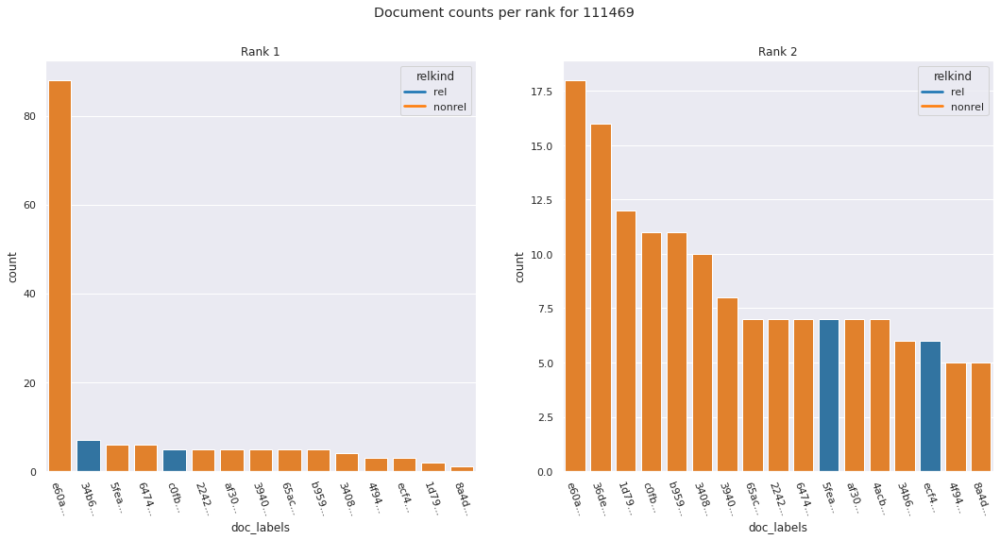

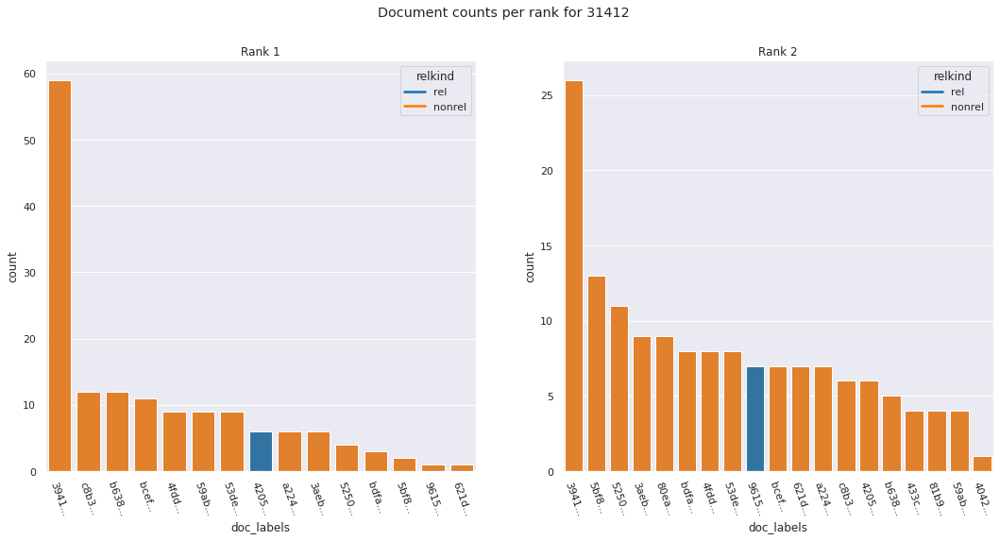

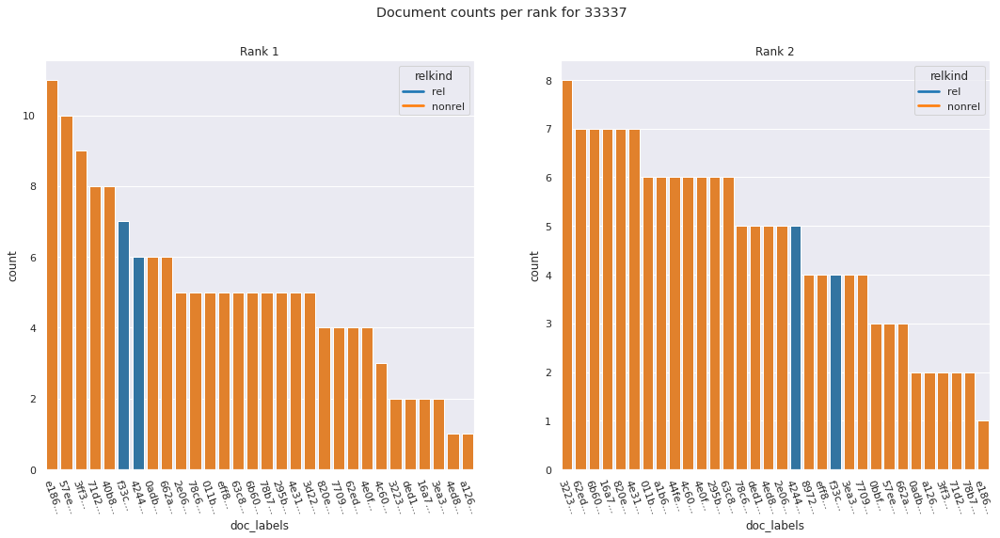

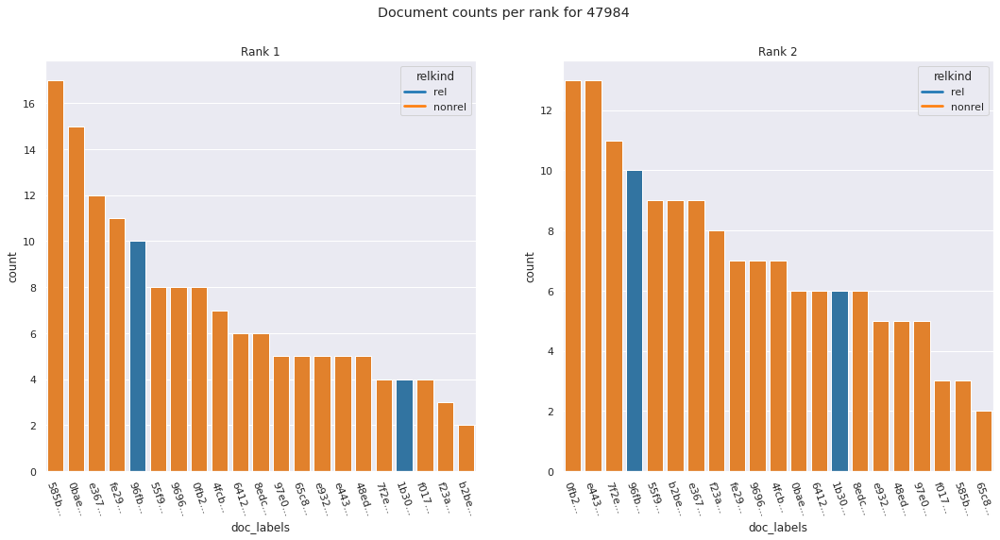

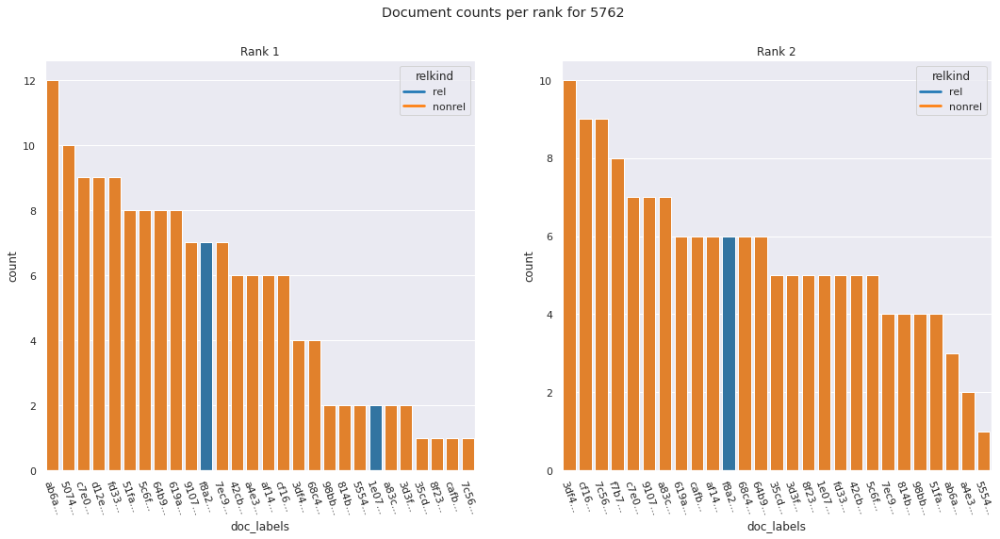

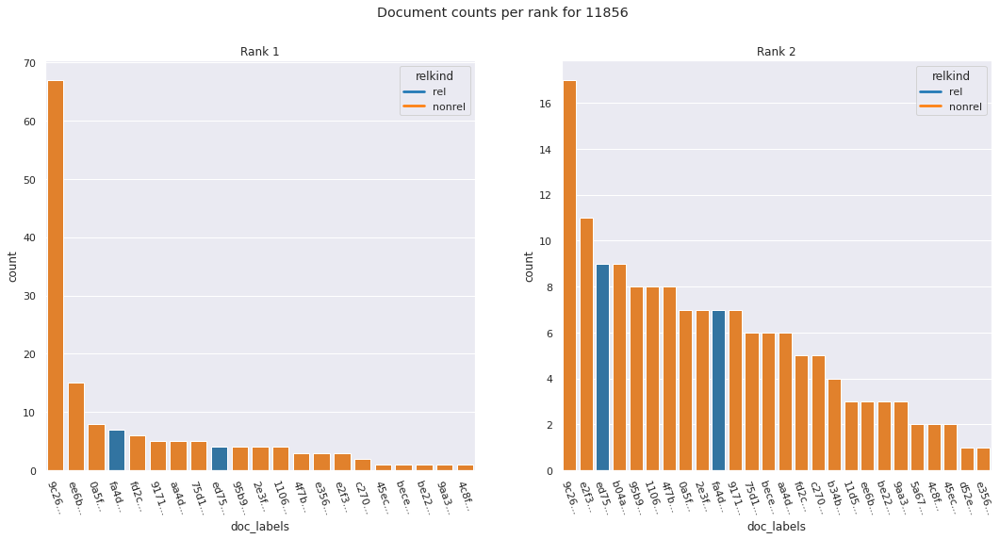

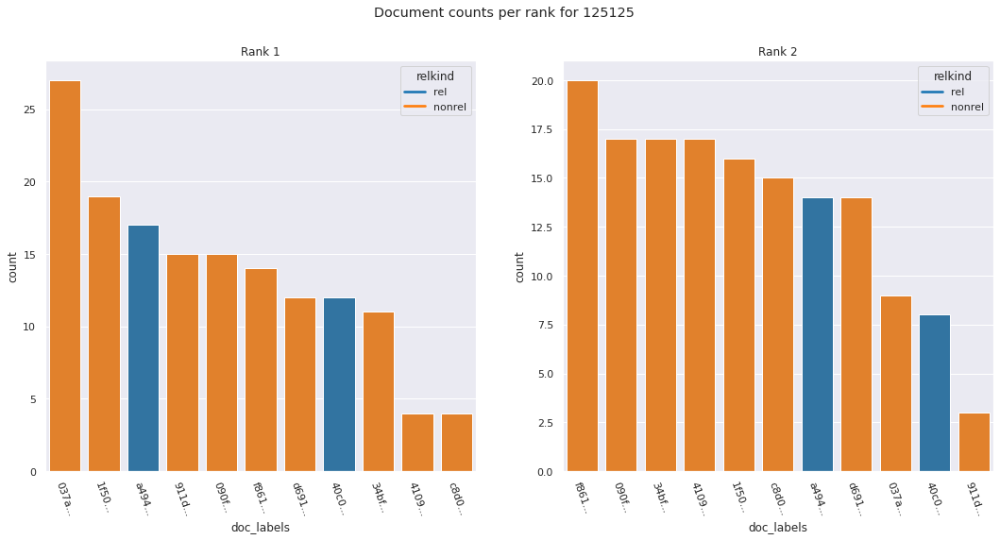

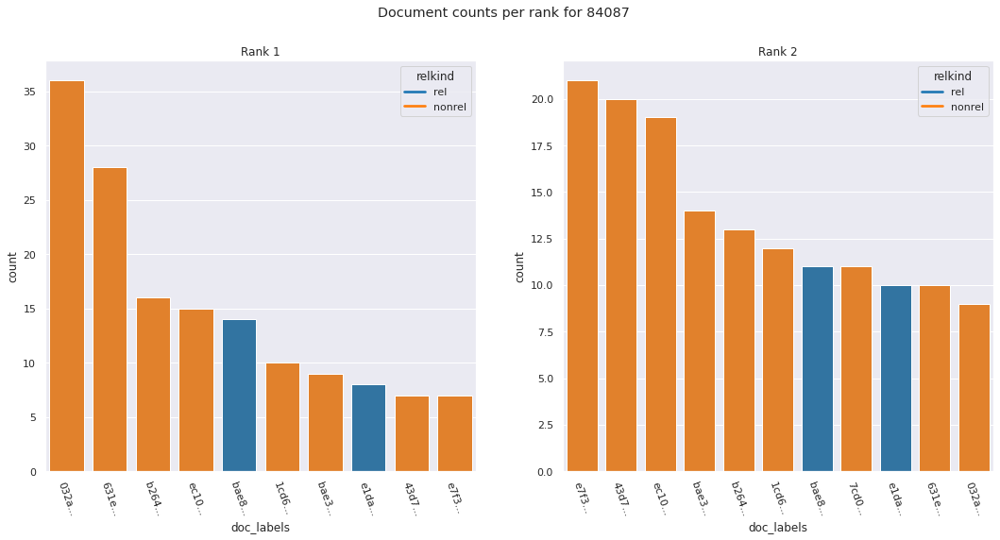

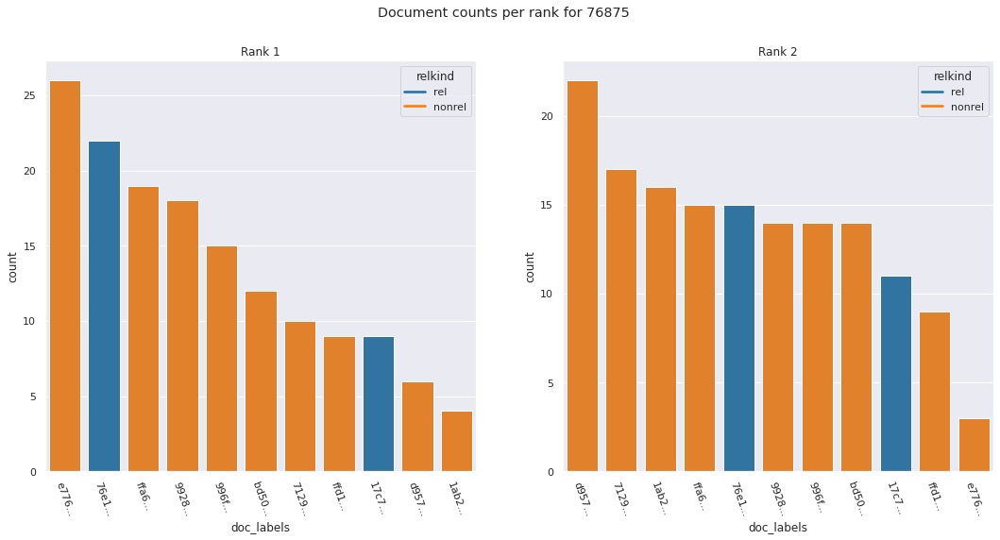

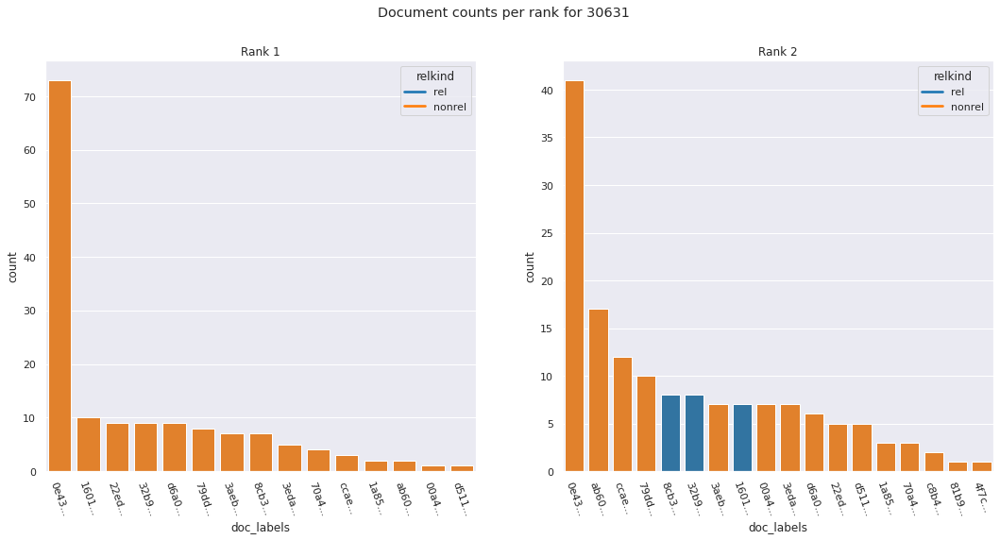

In [67]:
for q in bottomqueries.index.unique():
    rel,nonrel = count_relgrades_qid(q,reldf)
    plot_doc_occurrence_per_rank_for_qid(q,rdf,reldf,k=rel)
    

##### Top positions

Remarks:
- The top queries have a larger number of relevant items than the bottom queries on average
  - **Hypothesis**: if a query has a larger *fraction* of relevant items it performs better, because the chance that a a relevant item lands in a top position is larger.
  
- The top queries either have a reasonably gently sloping distribution, or a great spike of a relevant document (71096)

- For 2/3 of the top queries (71906, 21984, 52738, 5667), not all top documents appear in the top positions
    - **Hypothesis**: The items that do *not* appear in the top positions have low estimated relevance


- Many of the bottom queries have a large spike of an irrelevant document in a top position.
    - Aside from the spike the distribution generally diminishes gently.


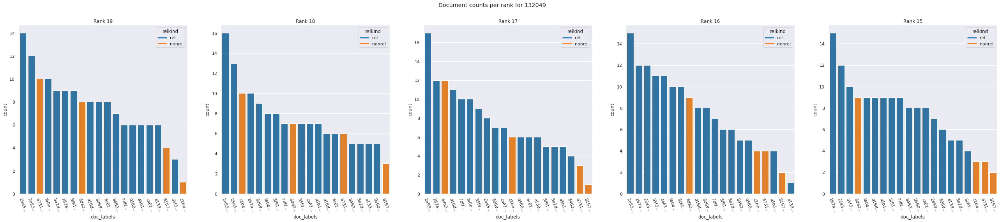

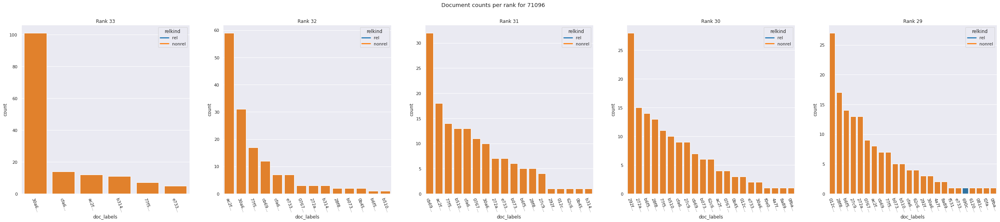

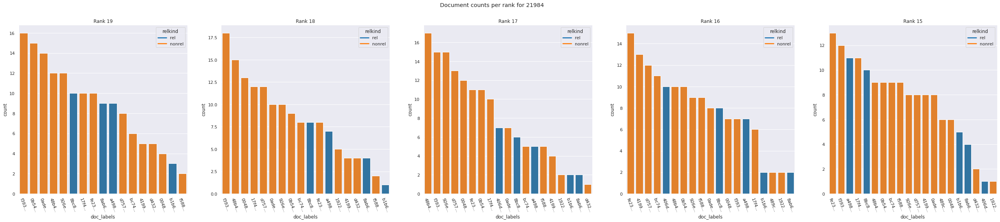

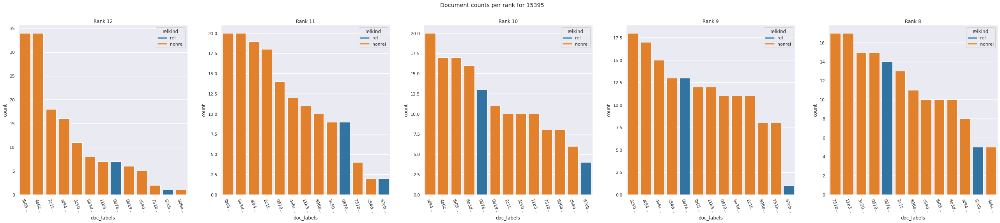

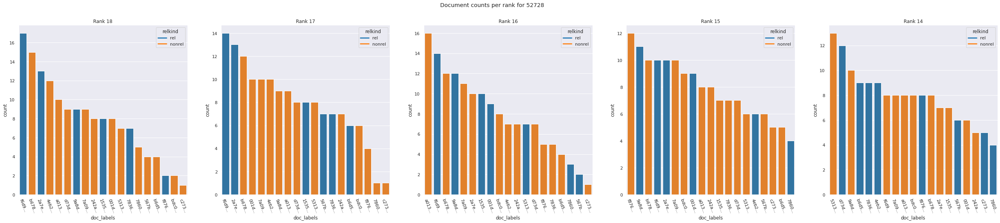

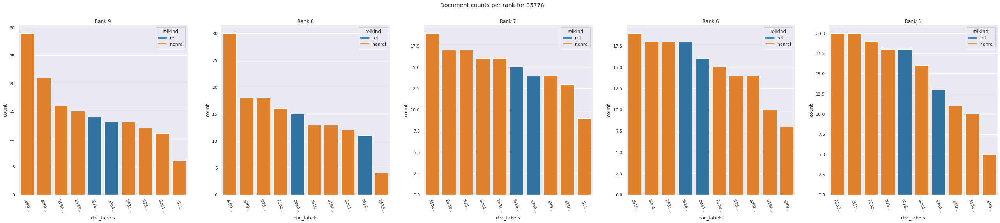

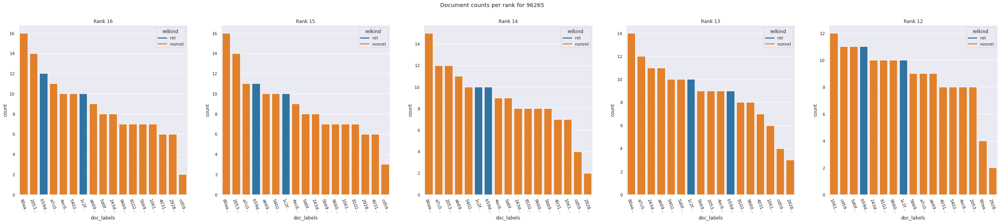

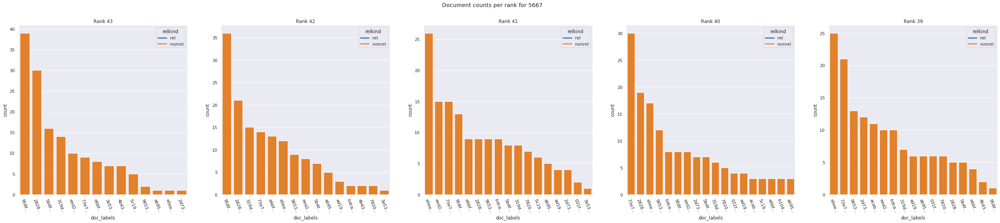

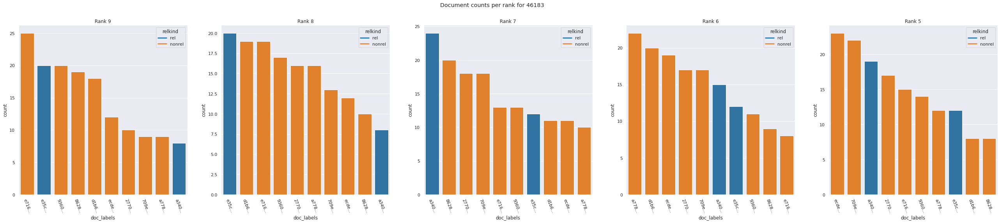

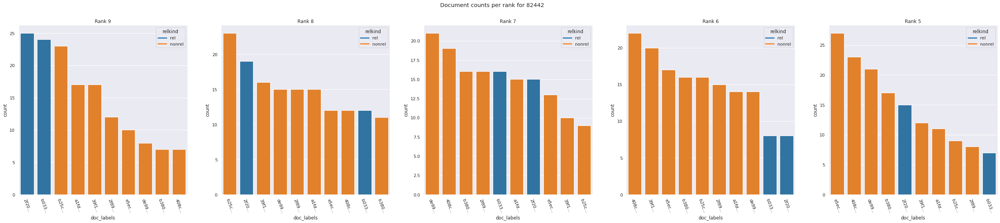

In [81]:
for q in topqueries.index.unique():
    rel,nonrel = count_relgrades_qid(q,reldf)
    plot_doc_occurrence_per_rank_for_qid(q,rdf,reldf,k=5,rev=True)

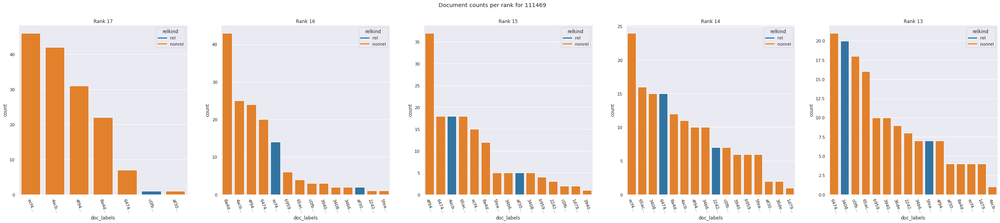

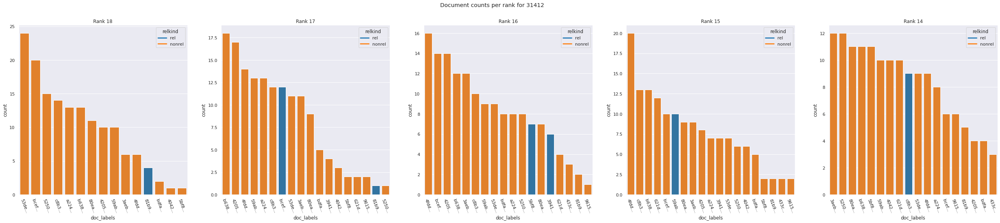

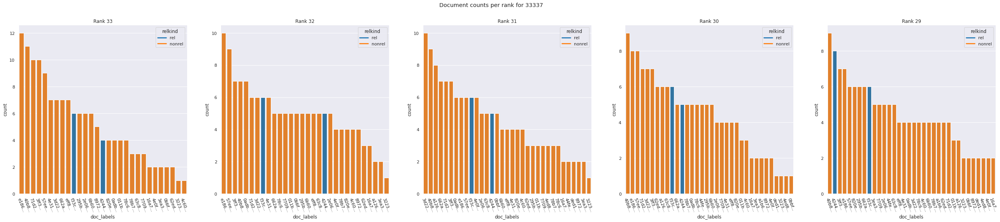

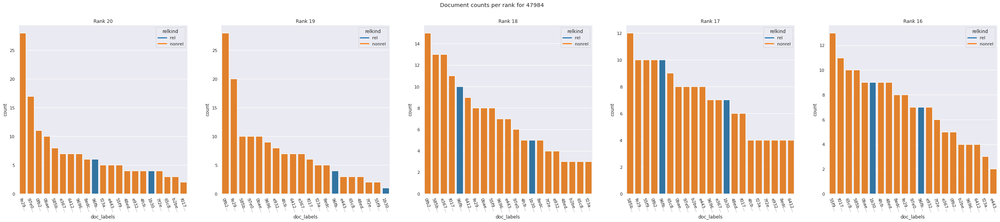

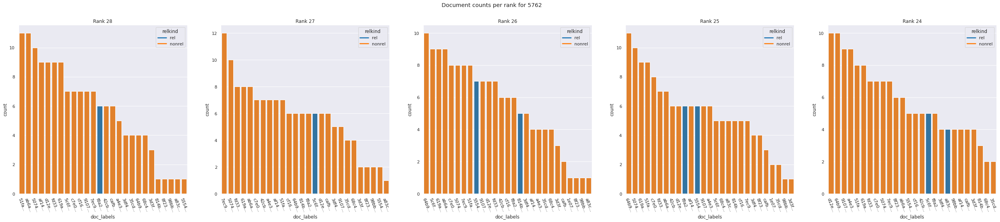

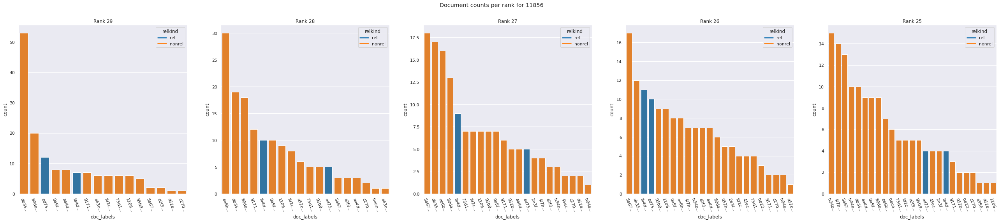

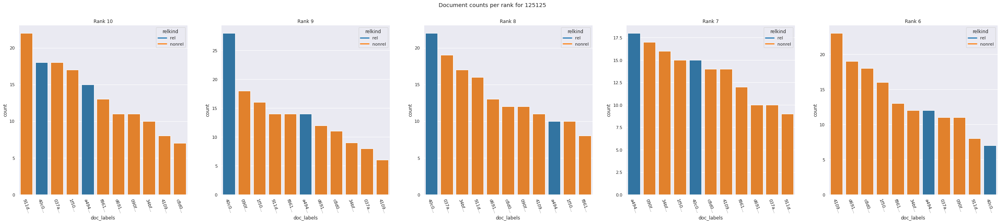

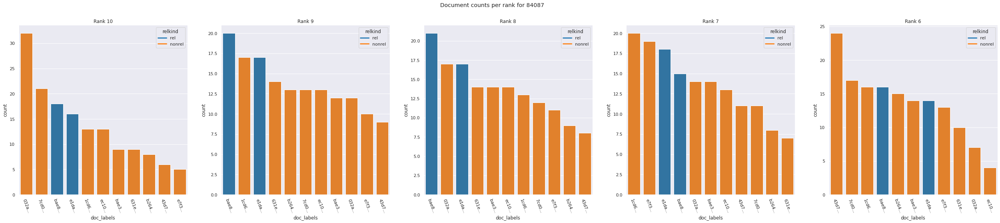

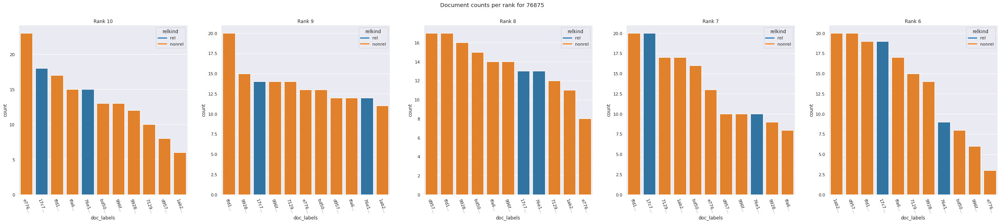

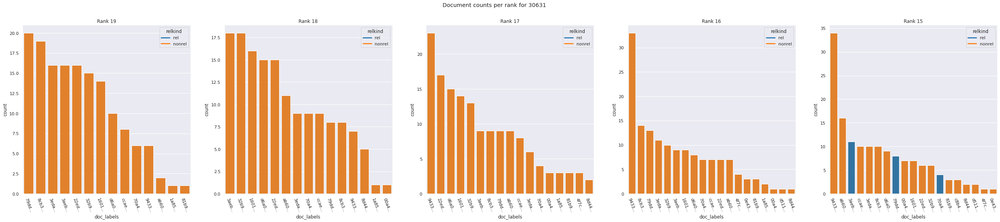

In [82]:
for q in bottomqueries.index.unique():
    rel,nonrel = count_relgrades_qid(q,reldf)
    plot_doc_occurrence_per_rank_for_qid(q,rdf,reldf,k=5,rev=True)

##### Bottom positions

The bottom positions look more regular. They diminish more gently, without big spikes. They also look pretty similar between the top and bottom queries.


### Document position (top/bottom) counts

We plot how often each document occurs in a top or bottom position. In an ideal scenario, there is a uniform distribution across relevant docs for top positions and non-relevant docs in bottom positions.

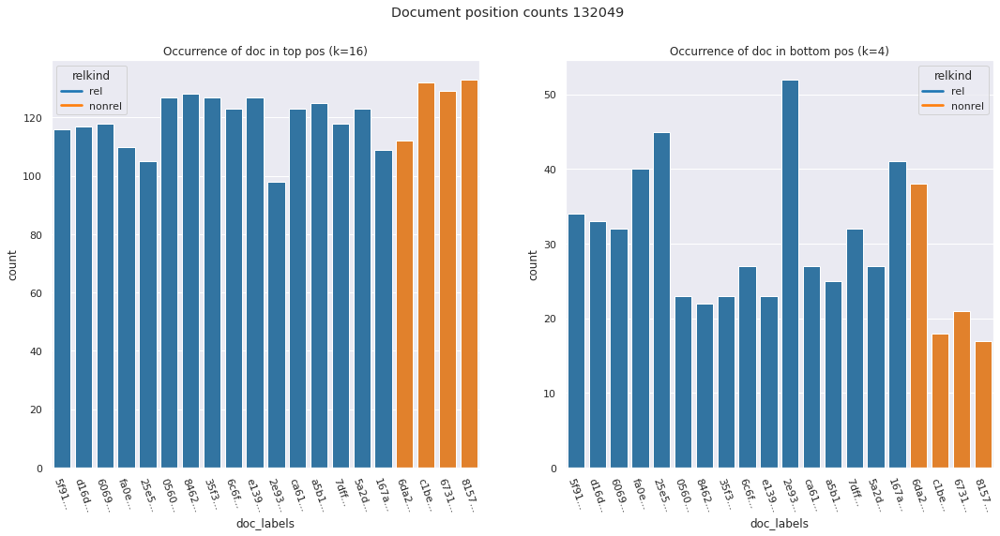

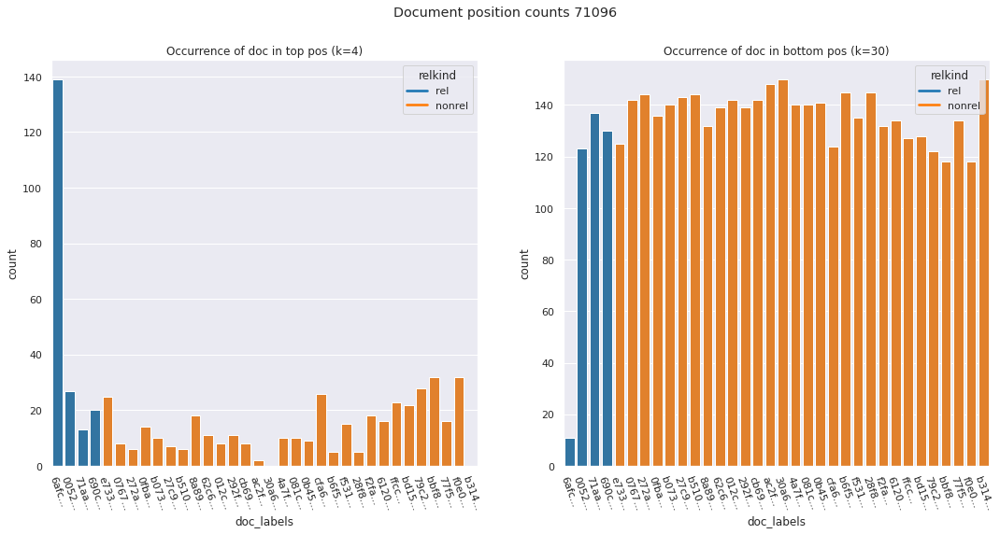

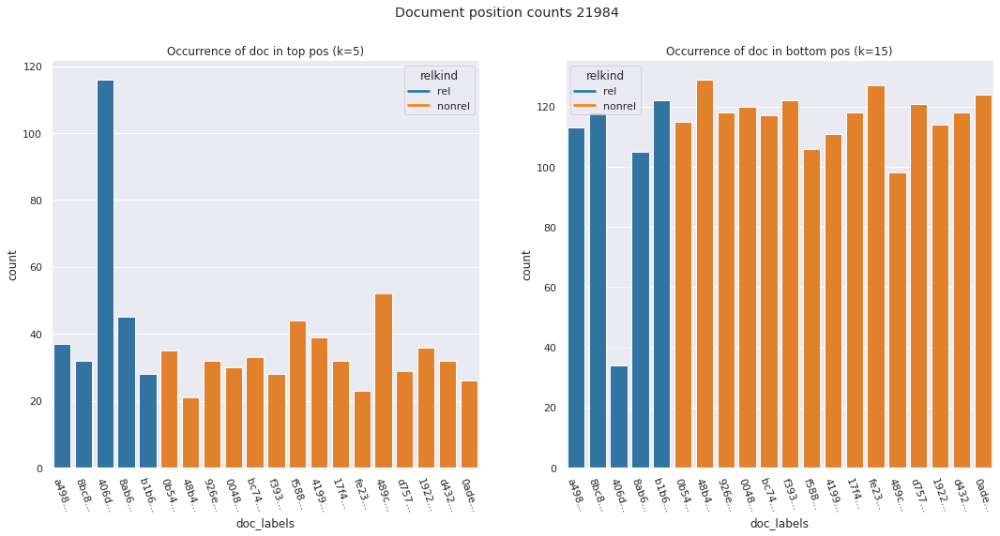

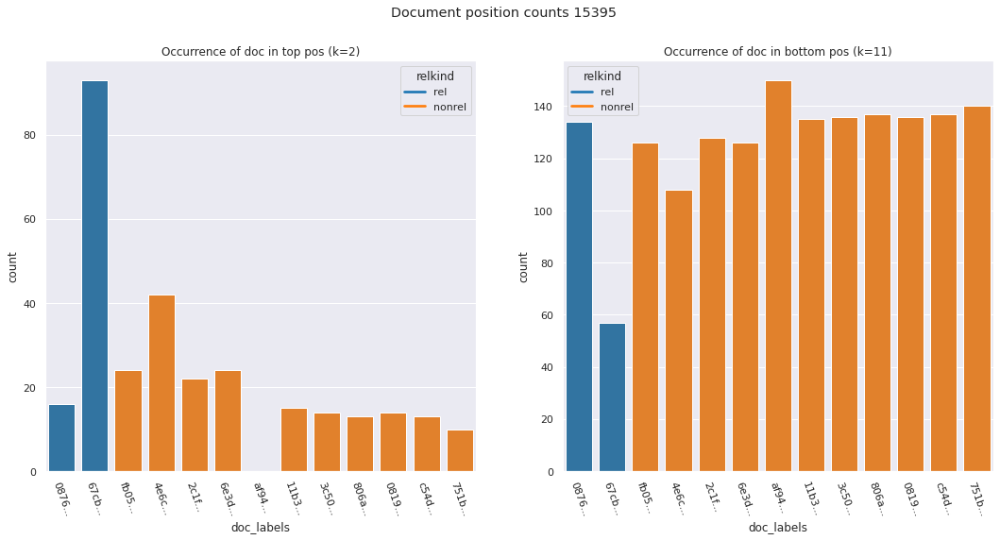

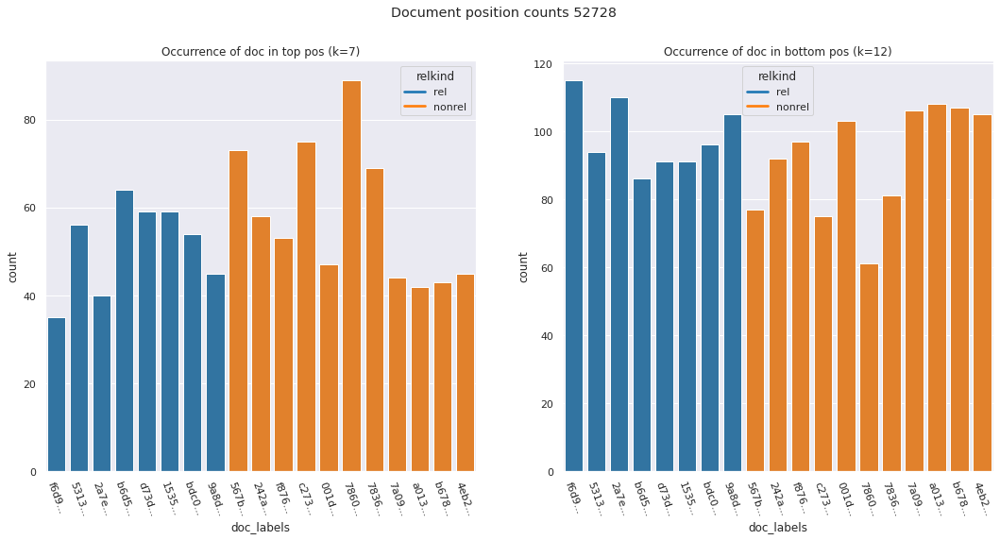

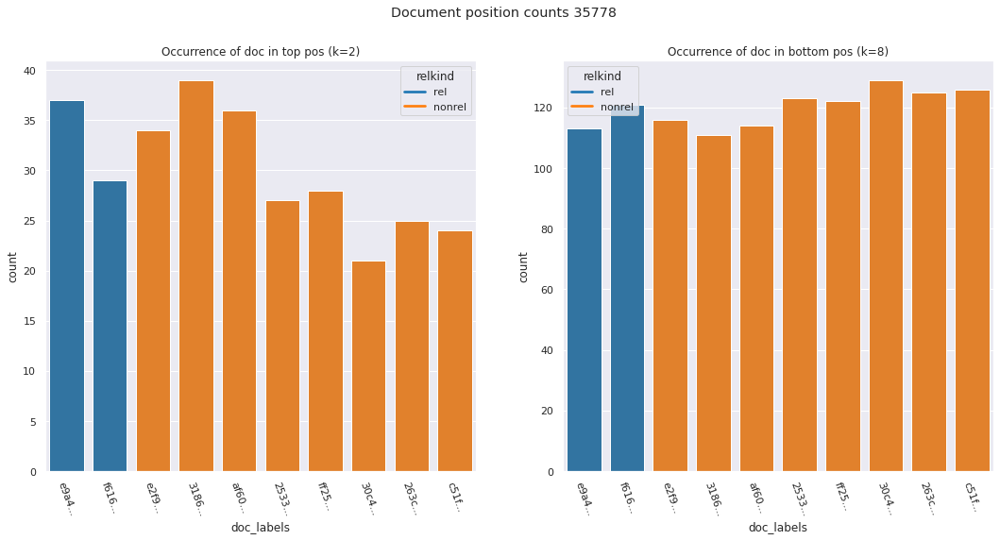

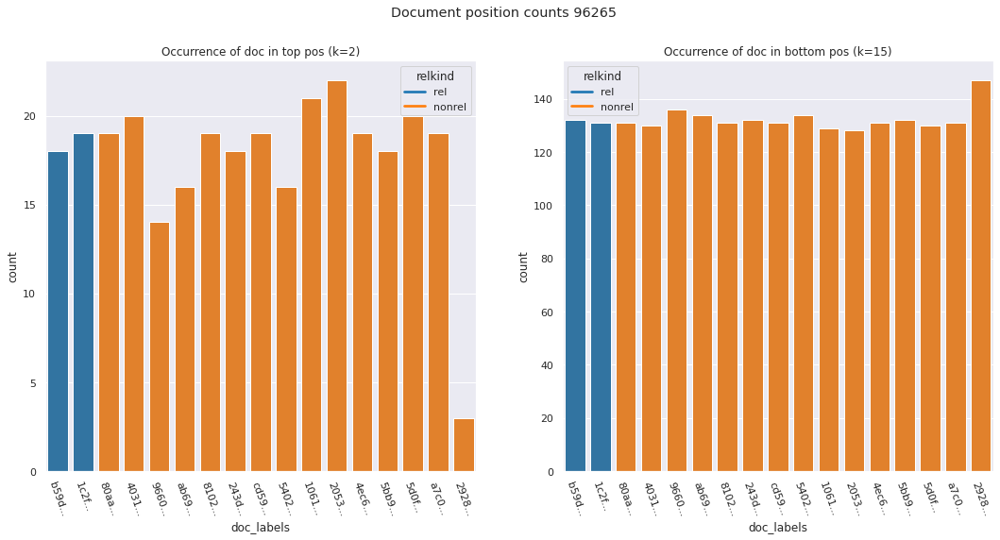

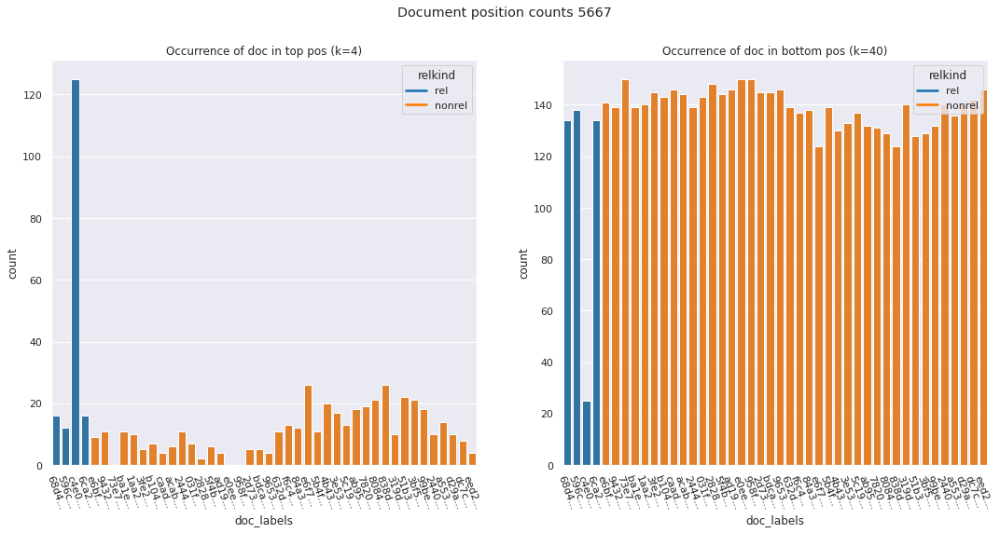

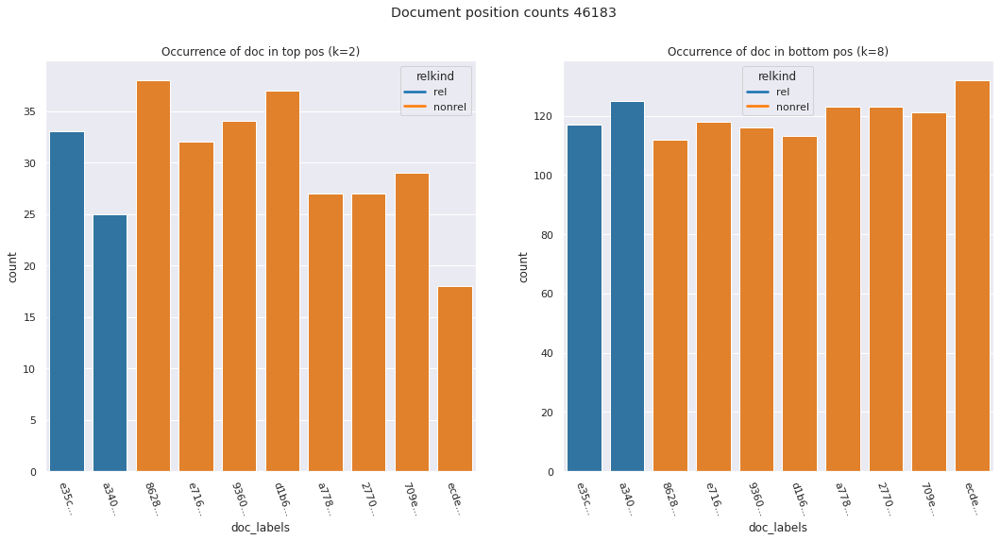

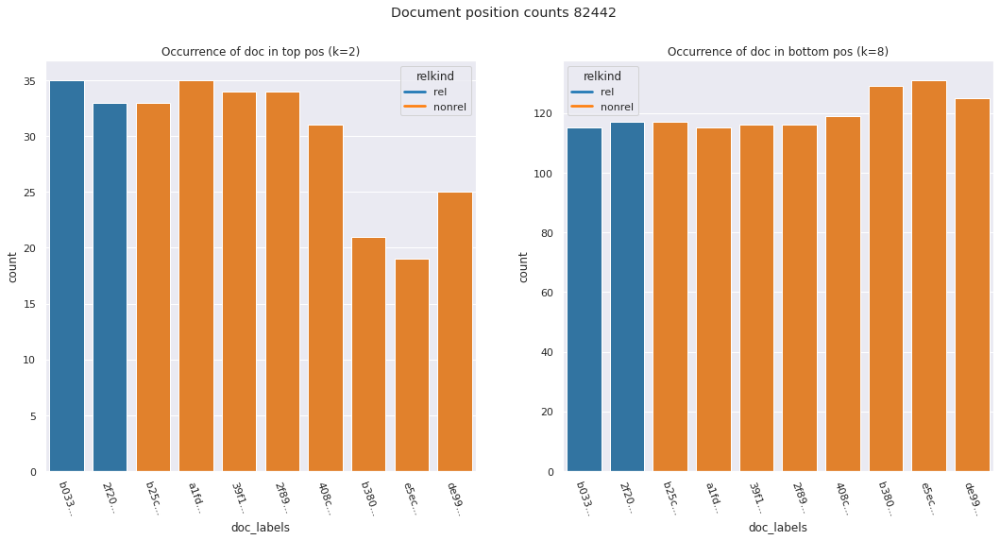

In [83]:
for q in topqueries.index.unique():
    plot_doc_pos_count_for_qid(q,rdf,reldf)

##### Top queries
Some things catch the eye:
- In general, there is a reasonably even distribution across the relevant documents in top positions and non-relevant documents in bottom positions.
- However, there are a couple of queries that have a spike for a relevant document in a top position.
  - 71096, 21984,15395, 5667
  
  
- There aren't necessarily fewer non-relevant documents in top positions, but they don't spike out.
- The distribution in bottom positions is reasonably even between relevant/ non-relevant documents, bar some dips that correspond to spikes in the top positions.
    
- There are multiple top queries for which there are irrelevant documents that appear in top positions more often than relevant documents. Why are they then still scoring high?
    - **Hypothesis**: These queries either have high relevance or low difference

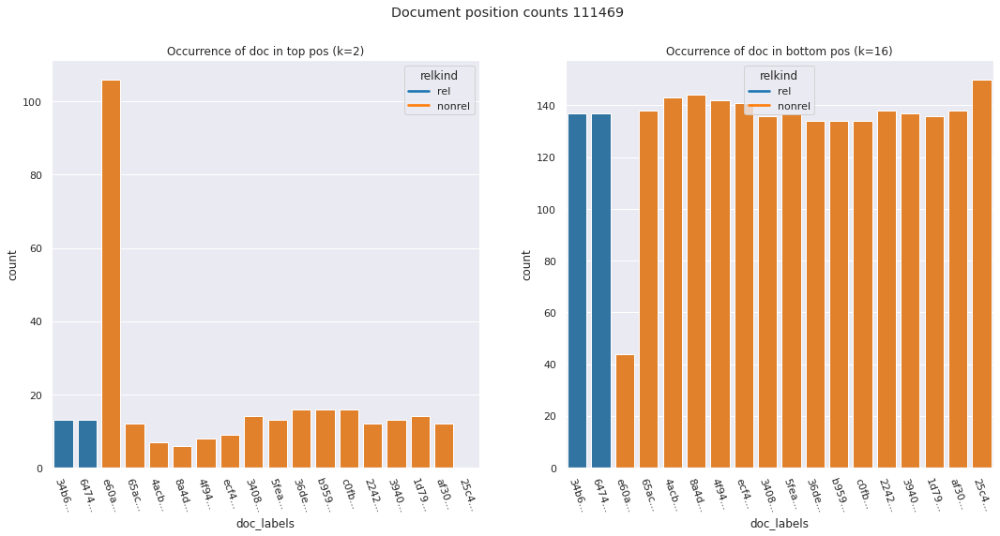

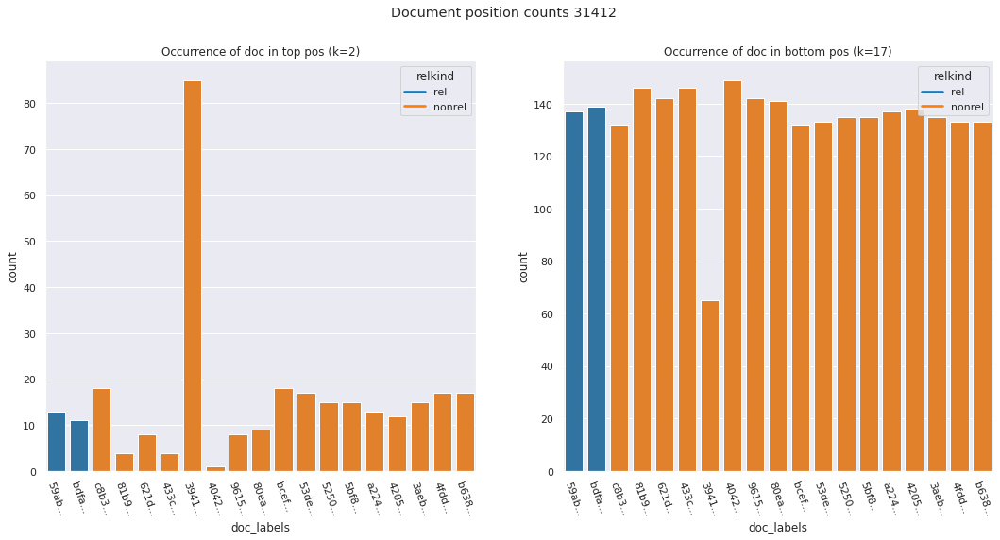

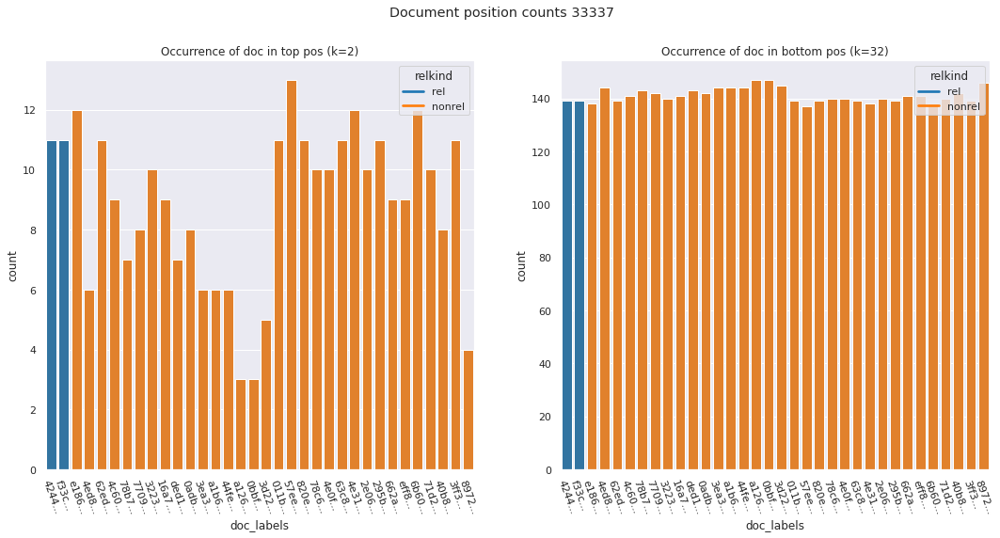

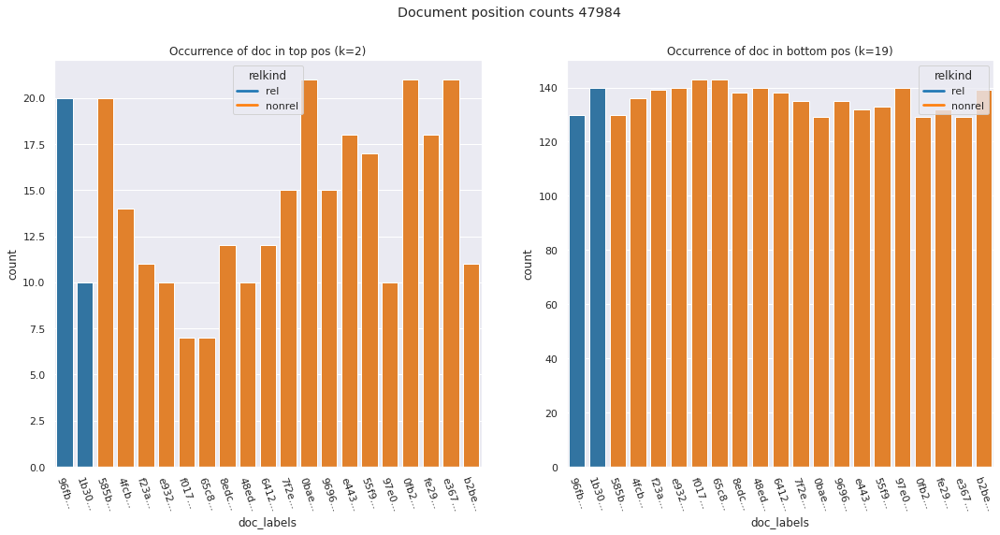

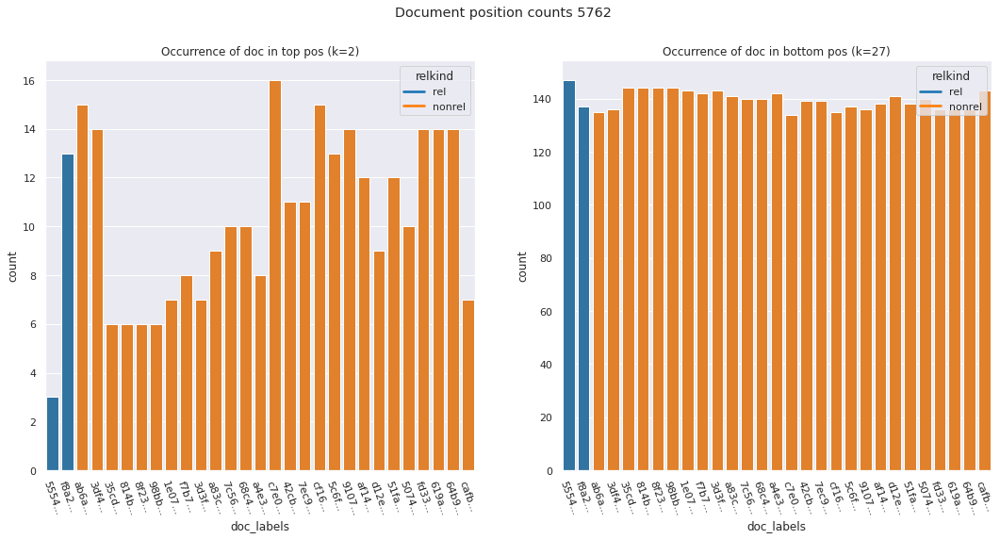

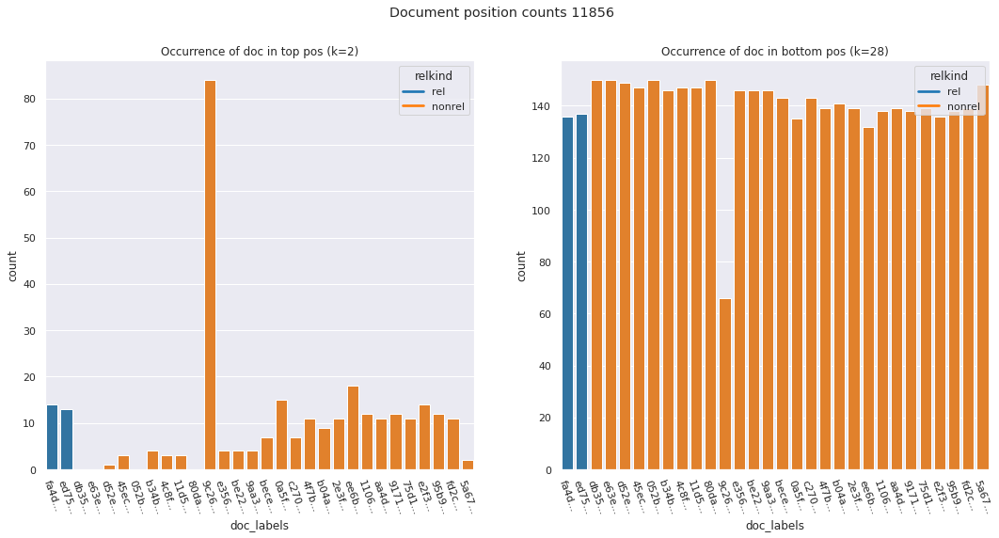

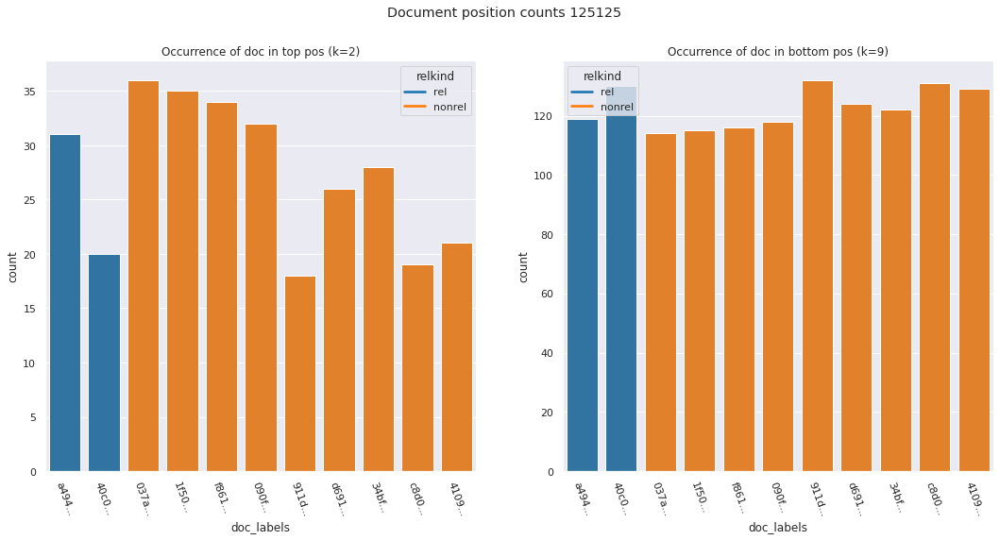

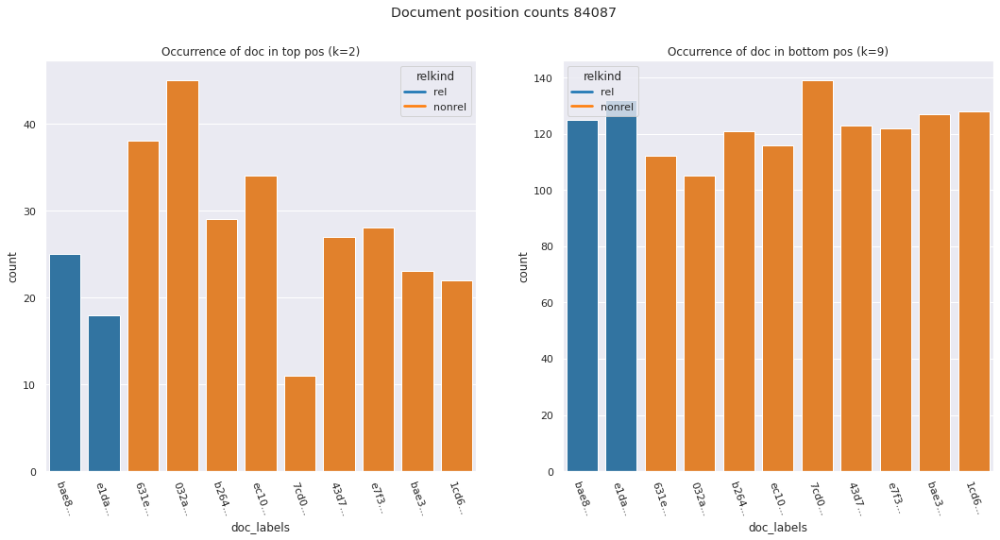

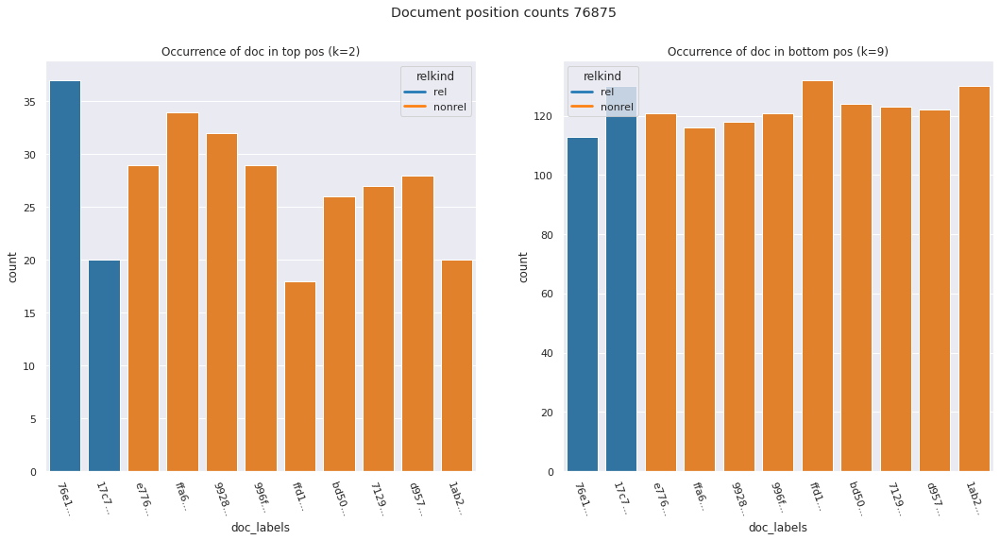

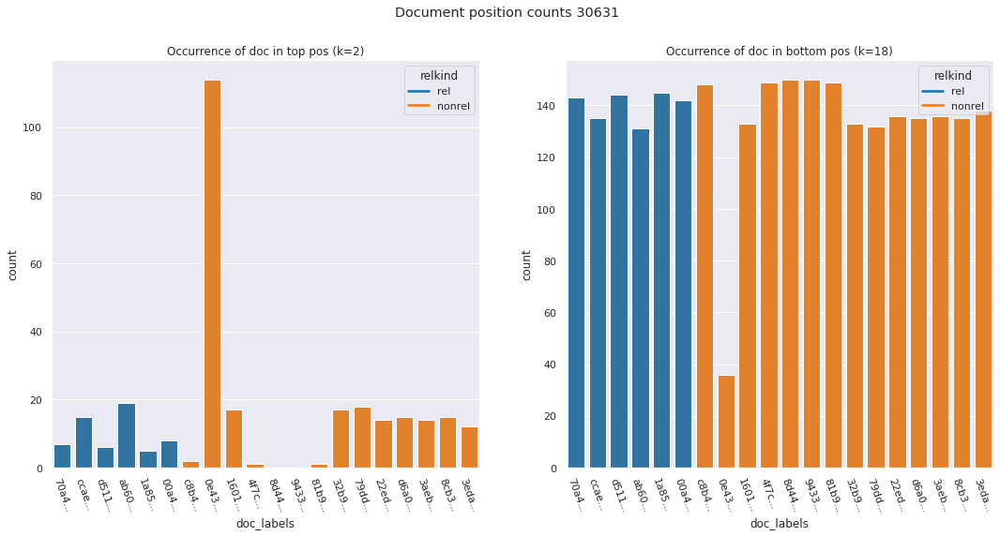

In [86]:
for q in bottomqueries.index.unique():
    plot_doc_pos_count_for_qid(q,rdf,reldf)

##### Bottom queries
- Almost each of these queries has at least one non-relevant document that occurs more often than the relevant documents
    - In most cases this is a "spike" document
    - There is one exception - why is this still ranking low?
          

## Hypotheses

Based on the plots we form a number of hypotheses:

1. Queries perform well when they have a high fraction of relevant items.
2. Queries perform well when they have a large number of items.
3. Queries perform poorly when they have many documents without author.
 - Conversely: queries perform well when they have many many documents without author, because then the ranking is more or less relevance-based.

4. All of the documents that spike in the rankings have no author.
5. Documents that are missing from their "proper" position (mainly relevant documents for top positions) have a low estimated relevance.



6. Documents for which the estimated relevance is too high/too low have been incorrectly judged by the NIST assessors.



7. For top queries, the documents without author are mainly relevant. For bottom queries, they are mainly irrelevant.

check:
- for each query for each rank, how often does a no-author document appear there and is it relevant or not?
    

### Hypothesis 1: Queries perform well when they have a high fraction of relevant items

In [87]:
def get_k_results(eval_df,k=10,asc=True):
    sub = eval_df.sort_values(by='difference',ascending=asc).head(k).reset_index()
    return sub

In [88]:
def rel_nonrel_stats_df(eval_df, k=10, asc=True):
    sub = get_k_results(eval_df,k,asc)
    sub[['r','nr']] = sub.apply(lambda row: count_relgrades_qid(row.qid,reldf), axis='columns', result_type='expand')
    sub[['rfrac','nrfrac']] = sub.apply(lambda row: {'rfrac': row.r / (row.r + row.nr), 'nrfrac': row.nr / (row.r + row.nr) }, axis='columns', result_type='expand')
    return sub

In [89]:
print("DGEE > mean:\t", len(edf[edf.difference > edf.difference.mean()]))
print()
print("DGEE <= mean:\t", len(edf[edf.difference <= edf.difference.mean()]))

DGEE > mean:	 65

DGEE <= mean:	 135


Taking the average across all queries that have a difference lower (higher) than the mean, the items with a lower mean have a higher fraction of relevant items than the items that have a higher mean.

In [92]:
top = rel_nonrel_stats_df(edf, k=len(edf[edf.difference <= edf.difference.mean()]))
bot = rel_nonrel_stats_df(edf, k=len(edf[edf.difference > edf.difference.mean()]), asc=False)

print("topqueries relmean:\t", top.rfrac.mean(),'\t',"botqueries relmean:\t\t", bot.rfrac.mean())
print("topqueries non-relmean:\t", top.nrfrac.mean(),'\t',"botqueries non-relmean:\t",bot.nrfrac.mean())


topqueries relmean:	 0.17629827614863894 	 botqueries relmean:		 0.15633218159781476
topqueries non-relmean:	 0.823701723851361 	 botqueries non-relmean:	 0.8436678184021852


The effect is even more clear if we look at the top and bottom 20 queries.

In [93]:
top = rel_nonrel_stats_df(edf,k=20)
bot = rel_nonrel_stats_df(edf,k=20,asc=False)
print("topk=20 relmean:\t",top.rfrac.mean(),'\tbotk=20 relmean:\t',bot.rfrac.mean())
print("topk=20 nrelmean:\t",top.nrfrac.mean(),'\tbotk=20 nrelmean:\t',bot.nrfrac.mean())


topk=20 relmean:	 0.2260622931022135 	botk=20 relmean:	 0.12806676915368892
topk=20 nrelmean:	 0.7739377068977864 	botk=20 nrelmean:	 0.871933230846311


In [94]:
for i in range(1,21):
    top = rel_nonrel_stats_df(edf,k=i)
    bot = rel_nonrel_stats_df(edf,k=i,asc=False)
    print(f"k={i}")
    print(f"top r:\t",round(top.rfrac.mean(),2),f'\tbot r:\t',round(bot.rfrac.mean(),2))
    print(f"top nr:\t",round(top.nrfrac.mean(),2),f'\tbot nr:\t',round(bot.nrfrac.mean(),2))
    print()

k=1
top r:	 0.2 	bot r:	 0.89
top nr:	 0.8 	bot nr:	 0.11

k=2
top r:	 0.46 	bot r:	 0.11
top nr:	 0.54 	bot nr:	 0.89

k=3
top r:	 0.39 	bot r:	 0.09
top nr:	 0.61 	bot nr:	 0.91

k=4
top r:	 0.33 	bot r:	 0.09
top nr:	 0.67 	bot nr:	 0.91

k=5
top r:	 0.34 	bot r:	 0.09
top nr:	 0.66 	bot nr:	 0.91

k=6
top r:	 0.31 	bot r:	 0.08
top nr:	 0.69 	bot nr:	 0.92

k=7
top r:	 0.29 	bot r:	 0.1
top nr:	 0.71 	bot nr:	 0.9

k=8
top r:	 0.26 	bot r:	 0.11
top nr:	 0.74 	bot nr:	 0.89

k=9
top r:	 0.26 	bot r:	 0.12
top nr:	 0.74 	bot nr:	 0.88

k=10
top r:	 0.25 	bot r:	 0.12
top nr:	 0.75 	bot nr:	 0.88

k=11
top r:	 0.24 	bot r:	 0.11
top nr:	 0.76 	bot nr:	 0.89

k=12
top r:	 0.22 	bot r:	 0.11
top nr:	 0.78 	bot nr:	 0.89

k=13
top r:	 0.21 	bot r:	 0.13
top nr:	 0.79 	bot nr:	 0.87

k=14
top r:	 0.22 	bot r:	 0.12
top nr:	 0.78 	bot nr:	 0.88

k=15
top r:	 0.24 	bot r:	 0.12
top nr:	 0.76 	bot nr:	 0.88

k=16
top r:	 0.23 	bot r:	 0.13
top nr:	 0.77 	bot nr:	 0.87

k=17
top r:	 0.23 	bo

In [78]:
data = rel_nonrel_stats_df(edf,k=200).reset_index()
data.head(5)

key,index,qid,difference,disparity,relevance,r,nr,rfrac,nrfrac
0,0,132049,0.002713,1.421254,1.403715,16,4,0.800000,0.200000
1,1,71096,0.029287,1.975807,1.862498,4,30,0.117647,0.882353
2,2,21984,0.032334,1.367385,1.271935,5,15,0.250000,0.750000
3,3,15395,0.040510,2.053024,1.890567,2,11,0.153846,0.846154
4,4,52728,0.057478,1.047360,0.839632,7,12,0.368421,0.631579


<AxesSubplot:xlabel='index', ylabel='rfrac'>

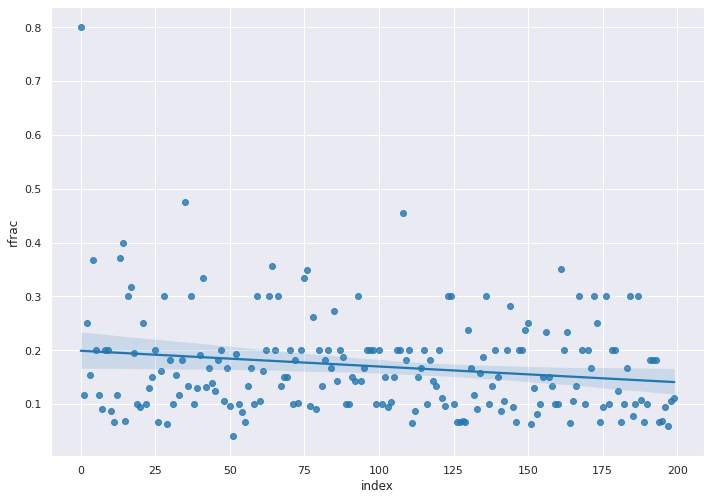

In [79]:
# sns.scatterplot(data=data, x="index", y="rfrac")
sns.regplot(data=data,x="index", y="rfrac")

We see a light descending line; the hypothesis is confirmed. The top queries have a higher fraction of relevant versus non-relevant items.

#### Subypothesis: The top queries have a higher average predicted relevance

- sum of estimated relevances for each relkind divided by number of items for that relkind

In [97]:
rel_and_estrel = pd.merge(pd.merge(edf.reset_index(),reldf[['qid','doc_rel','doc_id']], on='qid'),est_rel_meta, on=['qid','doc_id'])
rel_and_estrel['rel_estrel_diff'] = rel_and_estrel.apply(lambda row: abs(row.doc_rel - row.est_relevance),axis=1)
rel_and_estrel.head()

,qid,difference,disparity,relevance_x,doc_rel,doc_id,relevance_y,est_relevance,rel_estrel_diff
0,69,0.146308,2.820826,2.254359,0,aacba5b65b7e7854744101233ce01f6085b9d592,0,0.166631,0.166631
1,69,0.146308,2.820826,2.254359,1,088f1f39e09476624088779808916769f0415522,1,0.115253,0.884747
2,69,0.146308,2.820826,2.254359,0,ad0d1b3ba06146606cba4784608575e76283f2d7,0,0.194834,0.194834
3,69,0.146308,2.820826,2.254359,0,a0b4090a765679566773df3fb265db2e10aa4d8b,0,0.257027,0.257027
4,69,0.146308,2.820826,2.254359,0,38a0fa90a395661f51f749cf42ce5f5de2c41d98,0,0.073940,0.073940


In [98]:
mean_estrel_per_relkind = rel_and_estrel.groupby(['qid','doc_rel']).mean().reset_index()
mean_estrel_per_relkind.head()

,qid,doc_rel,difference,disparity,relevance_x,relevance_y,est_relevance,rel_estrel_diff
0,69,0,0.146308,2.820826,2.254359,0,0.154769,0.154769
1,69,1,0.146308,2.820826,2.254359,1,0.131208,0.868792
2,258,0,0.549351,1.043557,0.679082,0,0.150459,0.150459
3,258,1,0.549351,1.043557,0.679082,1,0.206604,0.793396
4,439,0,0.517605,1.603399,0.887581,0,0.153111,0.153111


In [99]:
desired_index = edf.reset_index().sort_values(by='difference').reset_index(drop=True).reset_index()
desired_index.head()

key,index,qid,difference,disparity,relevance
0,0,132049,0.002713,1.421254,1.403715
1,1,71096,0.029287,1.975807,1.862498
2,2,21984,0.032334,1.367385,1.271935
3,3,15395,0.040510,2.053024,1.890567
4,4,52728,0.057478,1.047360,0.839632


In [100]:
mean_estrel_with_index = pd.merge(mean_estrel_per_relkind,desired_index[['index','qid']],on='qid')
mean_estrel_with_index.head()

,qid,doc_rel,difference,disparity,relevance_x,relevance_y,est_relevance,rel_estrel_diff,index
0,69,0,0.146308,2.820826,2.254359,0,0.154769,0.154769,53
1,69,1,0.146308,2.820826,2.254359,1,0.131208,0.868792,53
2,258,0,0.549351,1.043557,0.679082,0,0.150459,0.150459,146
3,258,1,0.549351,1.043557,0.679082,1,0.206604,0.793396,146
4,439,0,0.517605,1.603399,0.887581,0,0.153111,0.153111,141


<AxesSubplot:xlabel='index', ylabel='est_relevance'>

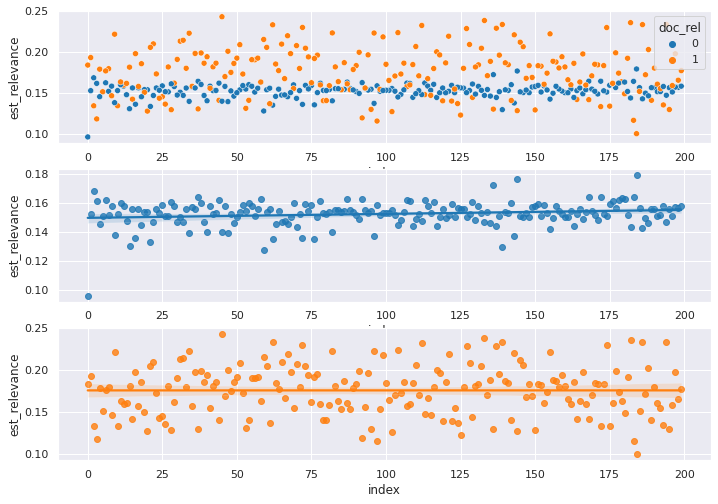

In [108]:
pi = iter(sns.color_palette())
f = next(pi)
s = next(pi)
fig, ax = plt.subplots(3,1)
sns.scatterplot(data=mean_estrel_with_index,x='index',y='est_relevance',hue='doc_rel',ax= ax[0])
sns.regplot(data=mean_estrel_with_index[mean_estrel_with_index.doc_rel == 0],x='index',y='est_relevance',ax=ax[1],color=f)
sns.regplot(data=mean_estrel_with_index[mean_estrel_with_index.doc_rel == 1],x='index',y='est_relevance',ax=ax[2],color=s)

The top queries do *not* have a higher average predicted relevance than the bottom queries, so the discrepancy is likely *not* because of the estimated relevances.

#### Subhypothesis: The top queries have a higher fraction of items for which the actual and the predicted relevance are close to each other

Blur factor, fig 1 in [3], blur closer to true relevance is less unfairness compared to Plackett-Luce. May be because is better able to predict based on relevance also?

If the predicted relevances are closer to the actual relevances the ranker is better able to take relevance into account, leading to better results?

Plot: mean difference between predicted and actual relevances
Subplots: split by GT rel and nonrel items

In [109]:
rel_and_estrel = pd.merge(pd.merge(edf.reset_index(),reldf[['qid','doc_rel','doc_id']], on='qid'),est_rel_meta, on=['qid','doc_id'])
rel_and_estrel['rel_estrel_diff'] = rel_and_estrel.apply(lambda row: abs(row.doc_rel - row.est_relevance),axis=1)
rel_and_estrel.head()

,qid,difference,disparity,relevance_x,doc_rel,doc_id,relevance_y,est_relevance,rel_estrel_diff
0,69,0.146308,2.820826,2.254359,0,aacba5b65b7e7854744101233ce01f6085b9d592,0,0.166631,0.166631
1,69,0.146308,2.820826,2.254359,1,088f1f39e09476624088779808916769f0415522,1,0.115253,0.884747
2,69,0.146308,2.820826,2.254359,0,ad0d1b3ba06146606cba4784608575e76283f2d7,0,0.194834,0.194834
3,69,0.146308,2.820826,2.254359,0,a0b4090a765679566773df3fb265db2e10aa4d8b,0,0.257027,0.257027
4,69,0.146308,2.820826,2.254359,0,38a0fa90a395661f51f749cf42ce5f5de2c41d98,0,0.073940,0.073940


In [110]:
mean_estrel_diff = rel_and_estrel.groupby('qid', as_index=False).mean()[['qid','difference','doc_rel','rel_estrel_diff']]
estrel_diff_sorted = mean_estrel_diff.sort_values(by='difference').reset_index(drop=True).reset_index()
estrel_diff_sorted.head()

,index,qid,difference,doc_rel,rel_estrel_diff
0,0,132049,0.002713,0.800000,0.671958
1,1,71096,0.029287,0.117647,0.229722
2,2,21984,0.032334,0.250000,0.342826
3,3,15395,0.040510,0.153846,0.272482
4,4,52728,0.057478,0.368421,0.394289


In [111]:
desired_index = edf.reset_index().sort_values(by='difference').reset_index(drop=True).reset_index()
splitdata = rel_and_estrel.sort_values(by='difference').reset_index(drop=True)
splitdata = pd.merge(splitdata,desired_index[['qid','index']],on='qid')
splitdata.head()

,qid,difference,disparity,relevance_x,doc_rel,doc_id,relevance_y,est_relevance,rel_estrel_diff,index
0,132049,0.002713,1.421254,1.403715,0,8157ceeb5c2cb3abdcd4347a7fae3377d25959d9,0,0.064553,0.064553,0
1,132049,0.002713,1.421254,1.403715,1,60699a68c32e0e1f2f5318423c5eed6e8e000bff,1,0.179613,0.820387,0
2,132049,0.002713,1.421254,1.403715,1,d16d4ab632d18d70c0ffd9d4d7493444281275e5,1,0.179613,0.820387,0
3,132049,0.002713,1.421254,1.403715,1,e13918f61745d29a2e84101ebfc46e9487d38fca,1,0.179613,0.820387,0
4,132049,0.002713,1.421254,1.403715,0,6da29e3f7e9ab2cbedccb71201ae62ed52f949a4,0,0.187206,0.187206,0


Text(0.5, 0.98, 'Mean difference between actual and predicted relevances for each query (sorted by ascending DGEE)')

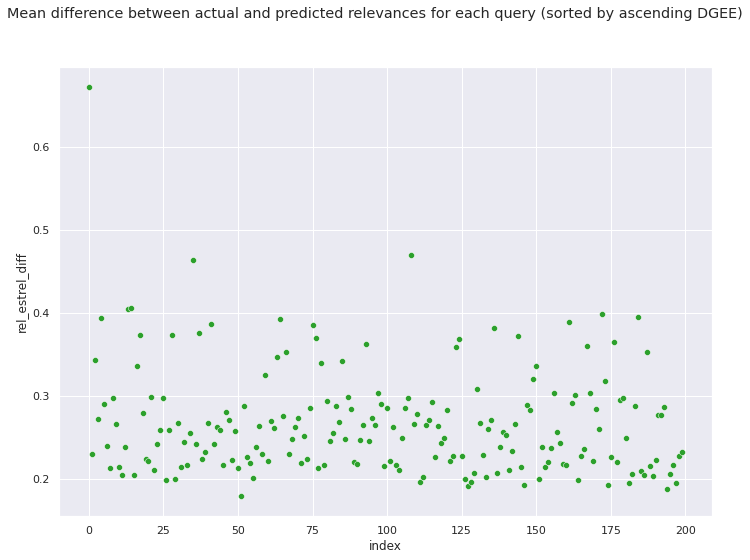

In [112]:
fig, ax = plt.subplots(1,1)
pi = iter(sns.color_palette())
next(pi)
next(pi)
sns.scatterplot(data=estrel_diff_sorted,x='index',y='rel_estrel_diff',ax=ax,color=next(pi))
fig.suptitle("Mean difference between actual and predicted relevances for each query (sorted by ascending DGEE)")

Text(0.5, 0.98, 'Difference between estimated and actual relevance for non-relevant documents for each query, ordered by ascending DGEE')

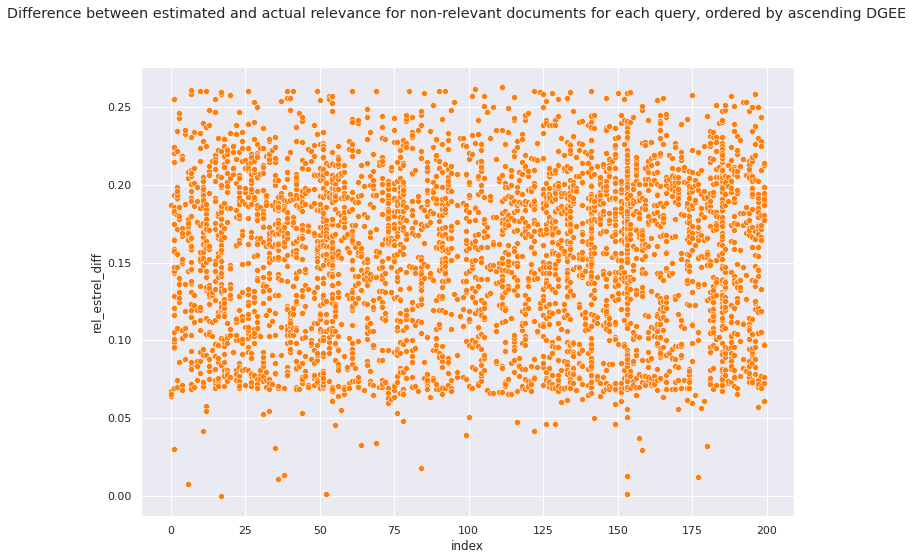

In [113]:
fig, ax = plt.subplots(1,1)
pi = iter(sns.color_palette())
next(pi)
sns.scatterplot(data=splitdata[splitdata.doc_rel == 0],x='index',y='rel_estrel_diff', color=next(pi))
fig.suptitle('Difference between estimated and actual relevance for non-relevant documents for each query, ordered by ascending DGEE')

Text(0.5, 0.98, 'Difference between estimated and actual relevance for relevant documents for each query, ordered by ascending DGEE')

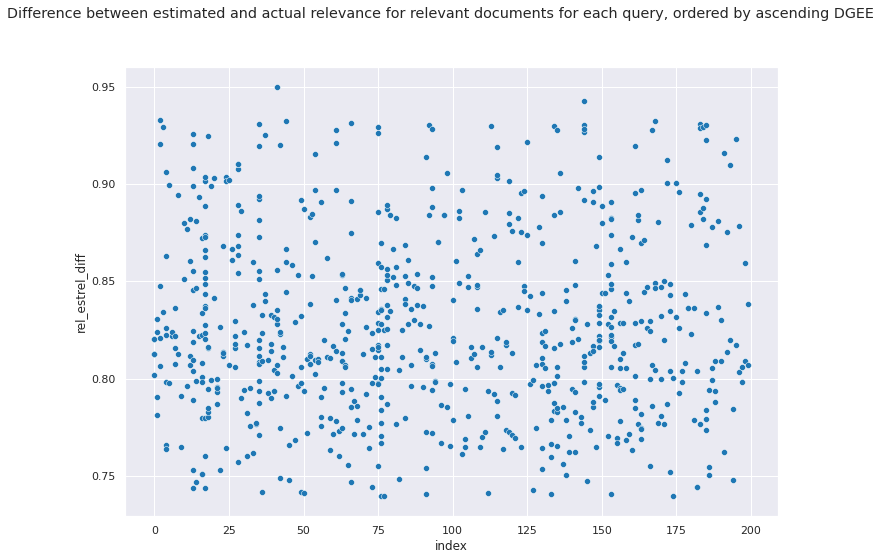

In [114]:
fig, ax = plt.subplots(1,1)
sns.scatterplot(data=splitdata[splitdata.doc_rel == 1],x='index',y='rel_estrel_diff')
fig.suptitle('Difference between estimated and actual relevance for relevant documents for each query, ordered by ascending DGEE')

We see a couple of things:
1. The mean difference between estimated relevance and actual relevance is larger for the best queries. Contrary to our hypothesis.
2. For the non-relevant items, the difference in estimated and actual relevance is reasonably the same across all queries.
3. For the relevant items, we see a couple of outliers for which the difference is much larger than for the rest of the documents. 

#### To find out
- [ ] Which documents correspond to the outliers?
- [ ] What is their impact on the quality of the rankings?

### Hypothesis 2: Queries perform well when they have a large number of items
The thought being: many items give a chance for averaging out mistakes.

### Hypothesis 4: All of the documents that spike in the rankings have no author.

Show the documents without author in a different color.

In [115]:
def find_docs_without_author(relevance):
    es = Elasticsearch([{'timeout':300}])
    
    all_ids = list(relevance.doc_id.unique())
    res = es.search(index='semanticscholar2020og', body={'size':len(all_ids),'query':{'ids':{'values':all_ids}}})
    returned_ids = [hit['_id'] for hit in res['hits']['hits']]
    not_in_index = list(set(all_ids) - set(returned_ids))
    no_author_in_idx = [hit['_id'] for hit in res['hits']['hits'] if not hit['_source']['author_ids']]
    
    no_author = list(set(not_in_index + no_author_in_idx))
    return no_author

In [116]:
def has_author_df(no_author_ids, relevance):
    relevance['has_author'] = relevance.apply(lambda row: row.doc_id not in no_author_ids,axis='columns')
    return relevance[['doc_id','has_author']].drop_duplicates()

In [117]:
noauth_ids = find_docs_without_author(reldf)

In [118]:
author_info = has_author_df(find_docs_without_author(reldf),reldf)
author_info.head()

,doc_id,has_author
0,3e19046c665867bbe557685da60738a40738010a,True
0,7ef08f1fa127af817cdfd9d3bd00bdf60e32143b,True
0,ec13c3e7119191802e6f5783d297fe7a5a05293e,True
0,8fc928bb430d3f72ac876ca156042ad1860acacd,True
0,b2fdee22aa02477292b858fbafcb418932732bce,True


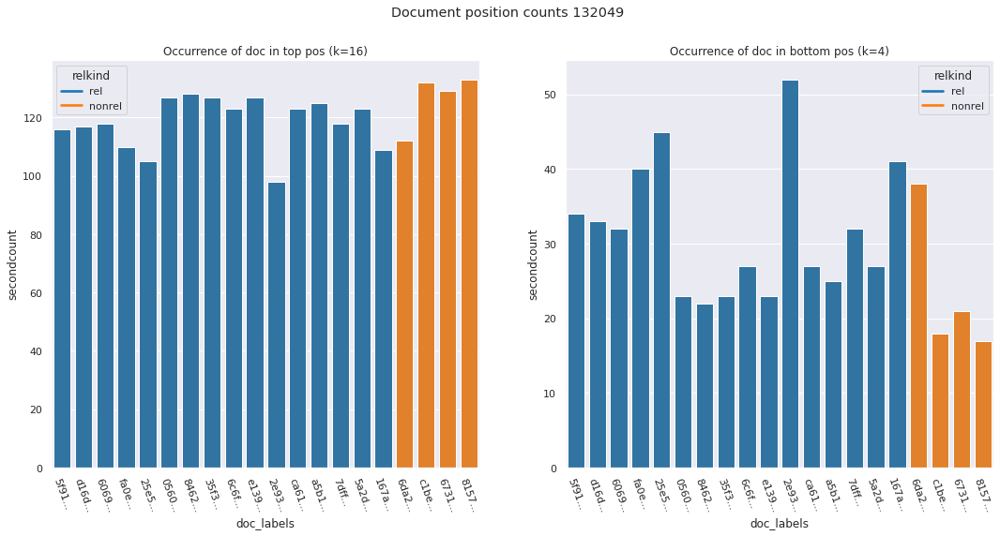

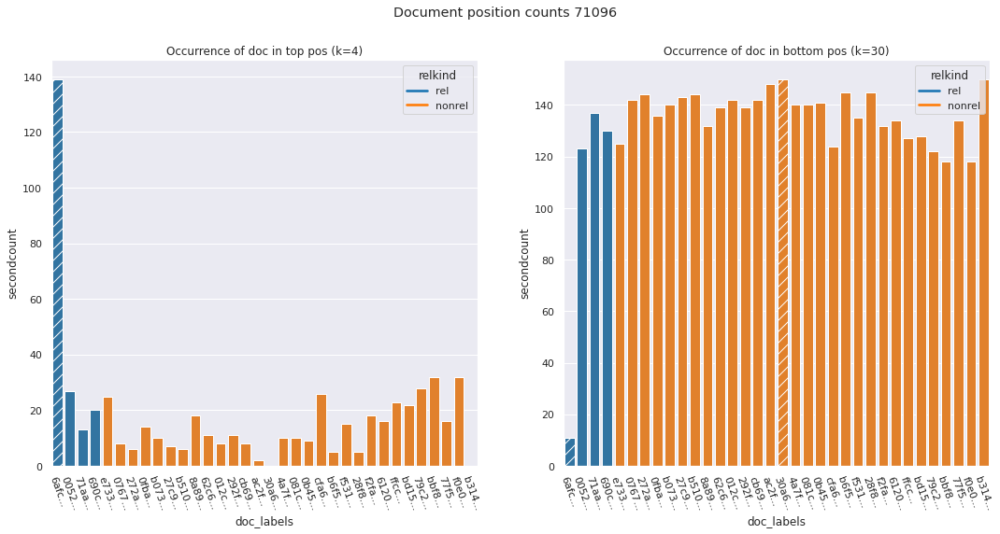

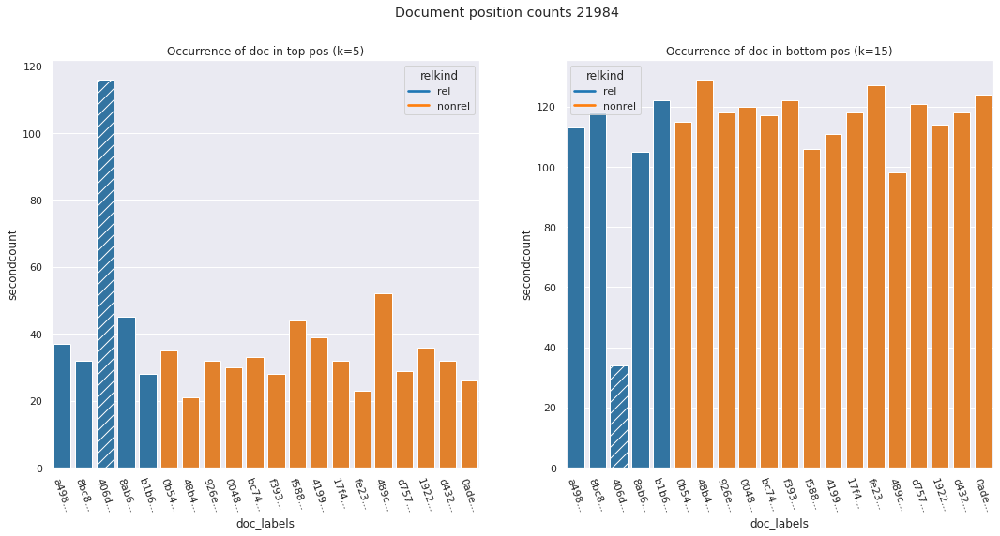

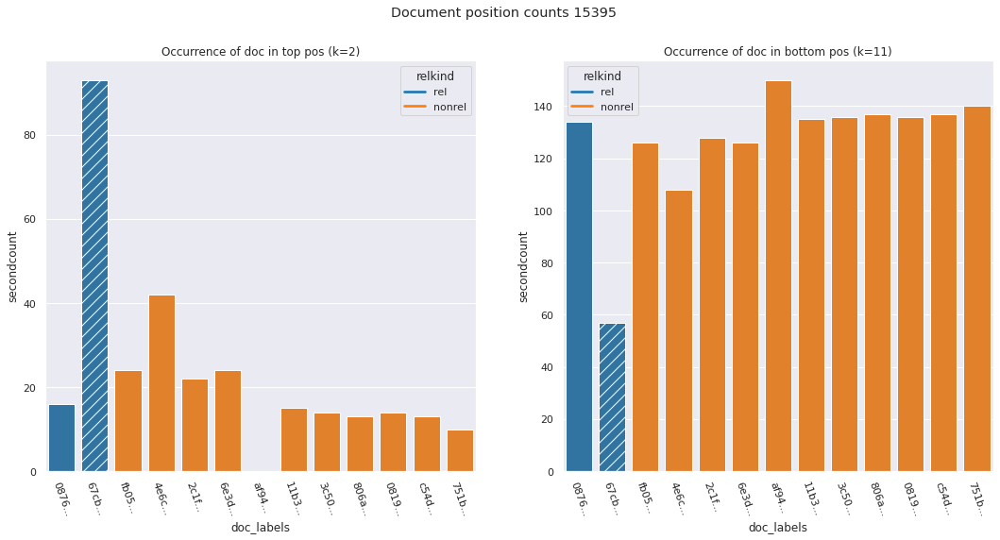

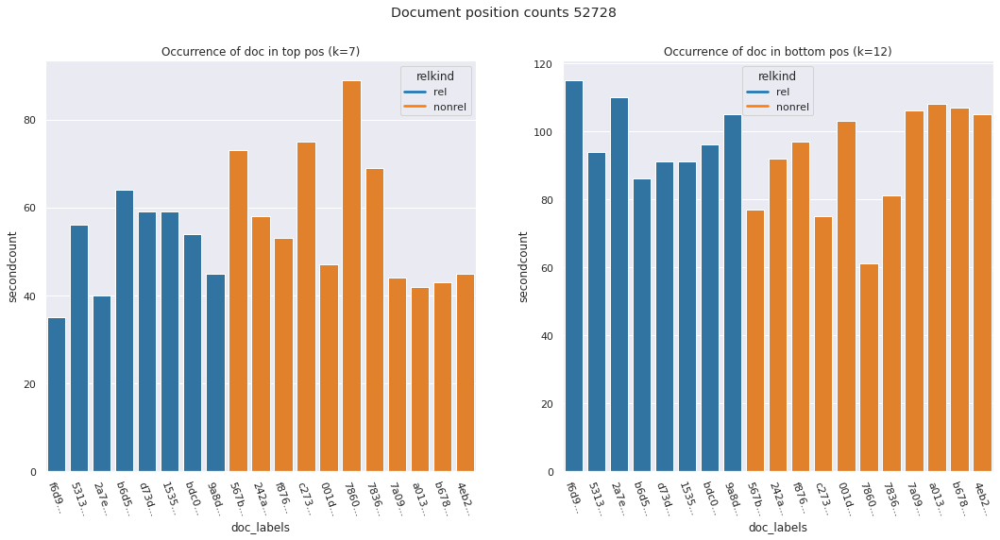

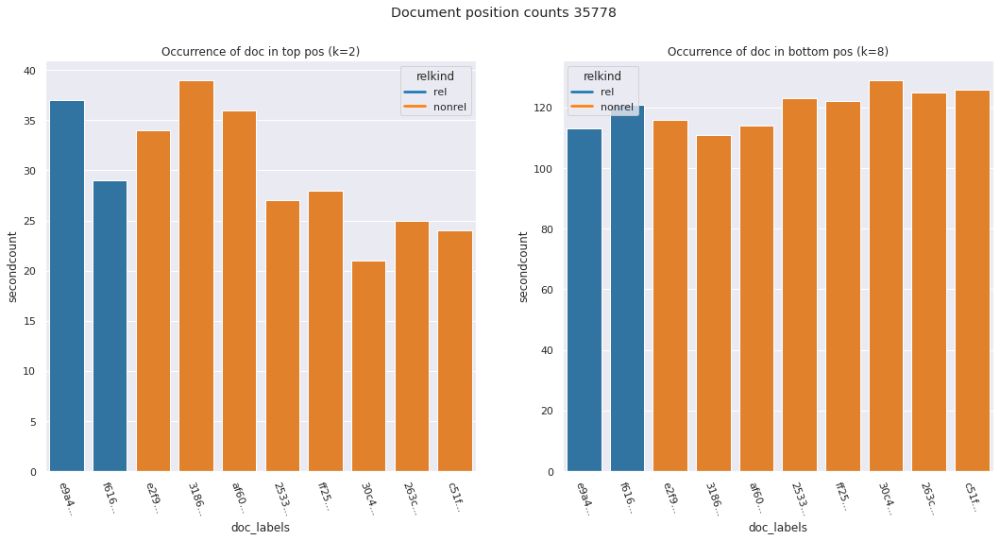

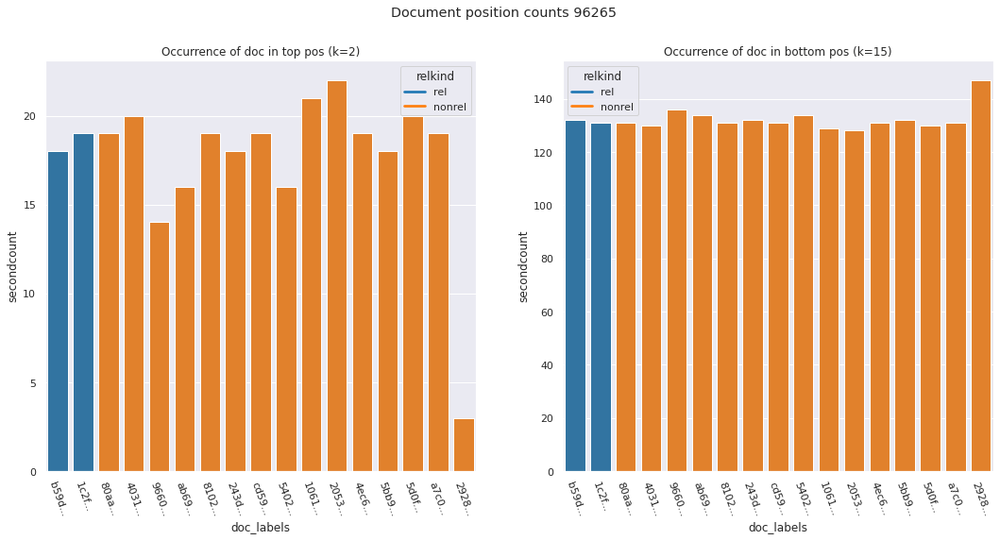

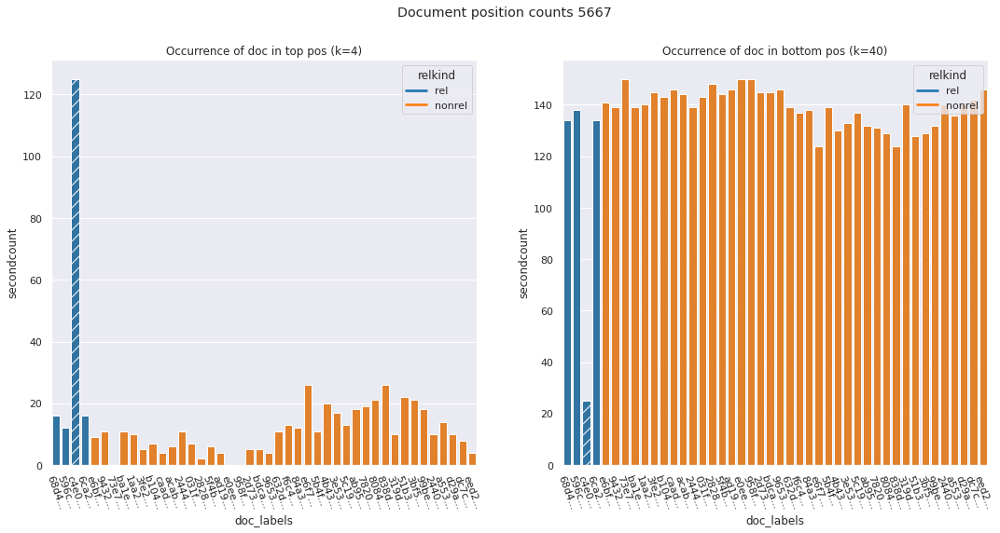

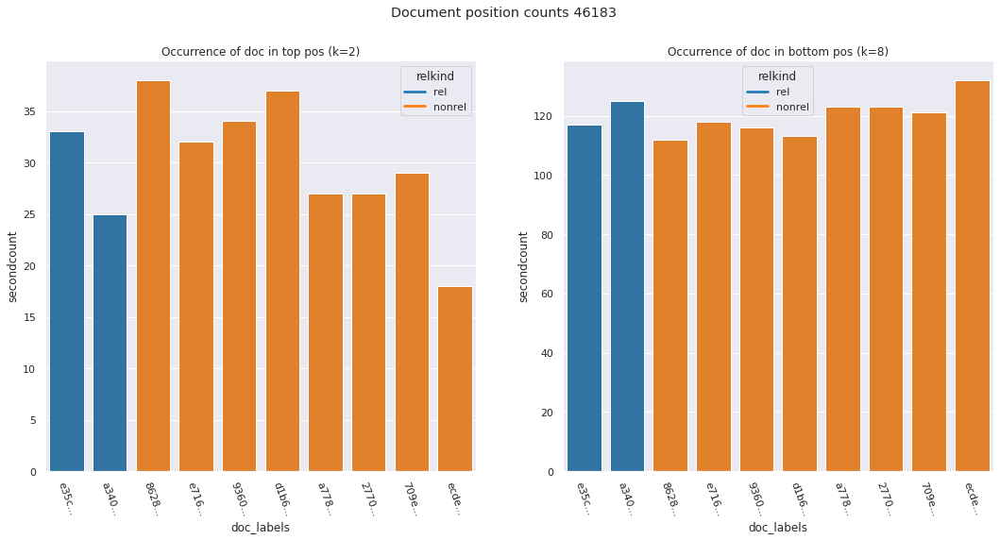

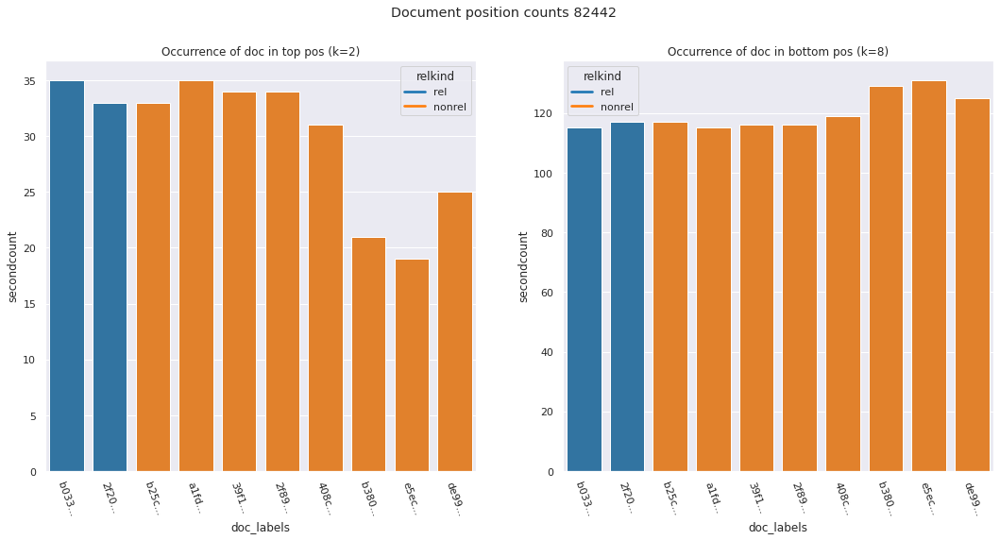

In [119]:
for q in topqueries.index.unique():
    plot_doc_pos_count_for_qid(q,rdf,reldf,noauth_ids)

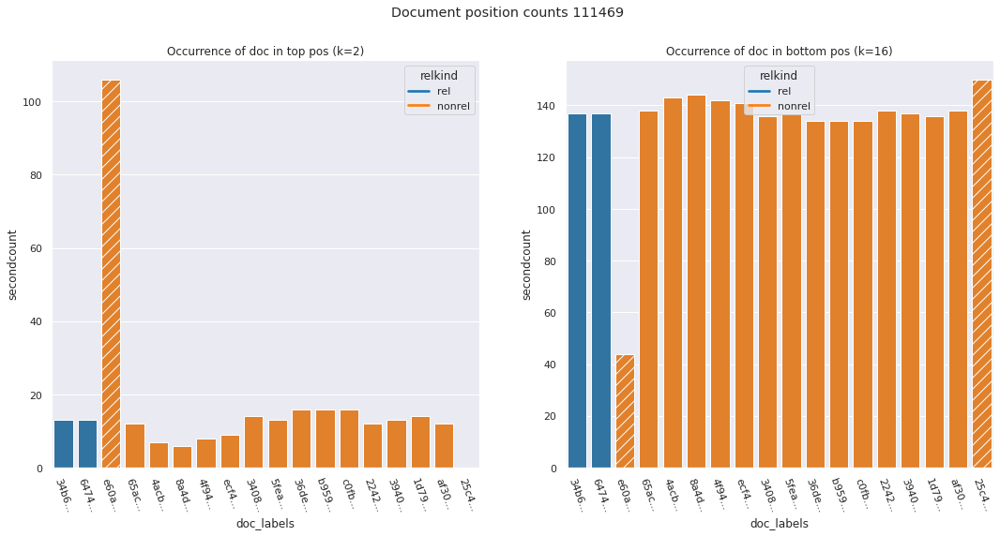

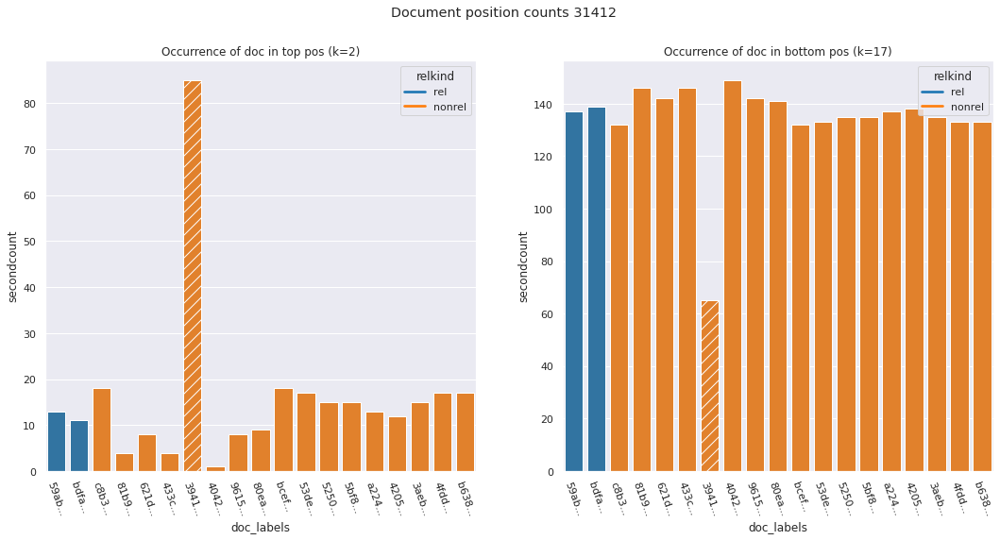

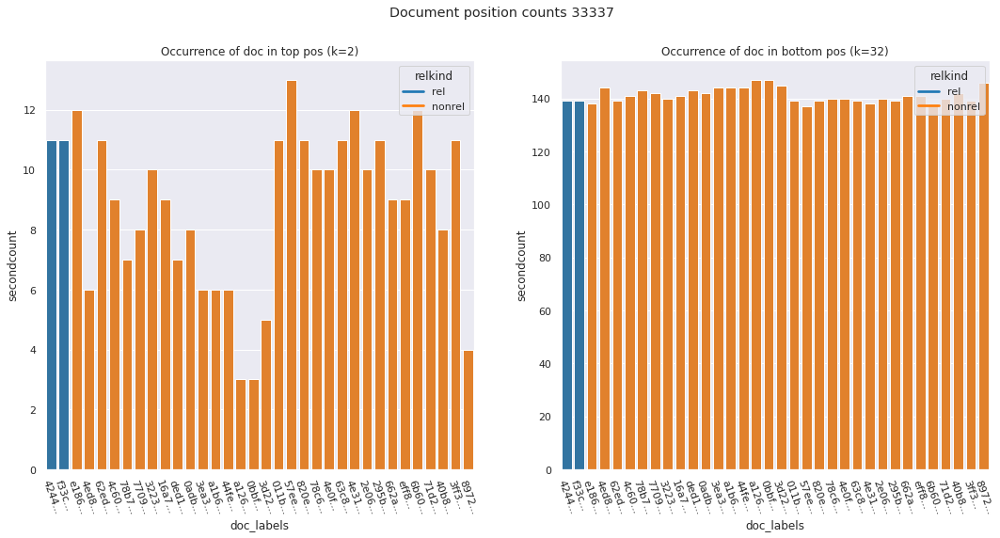

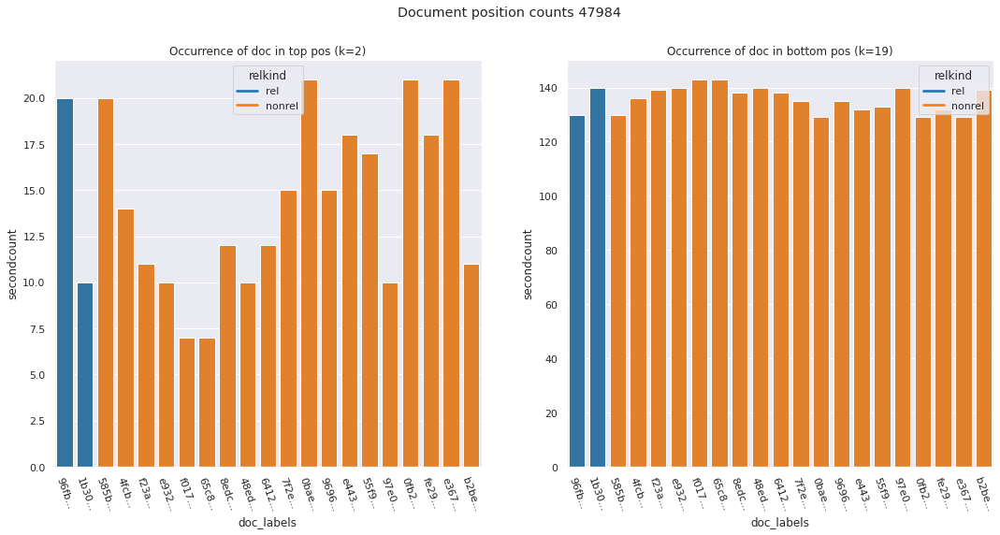

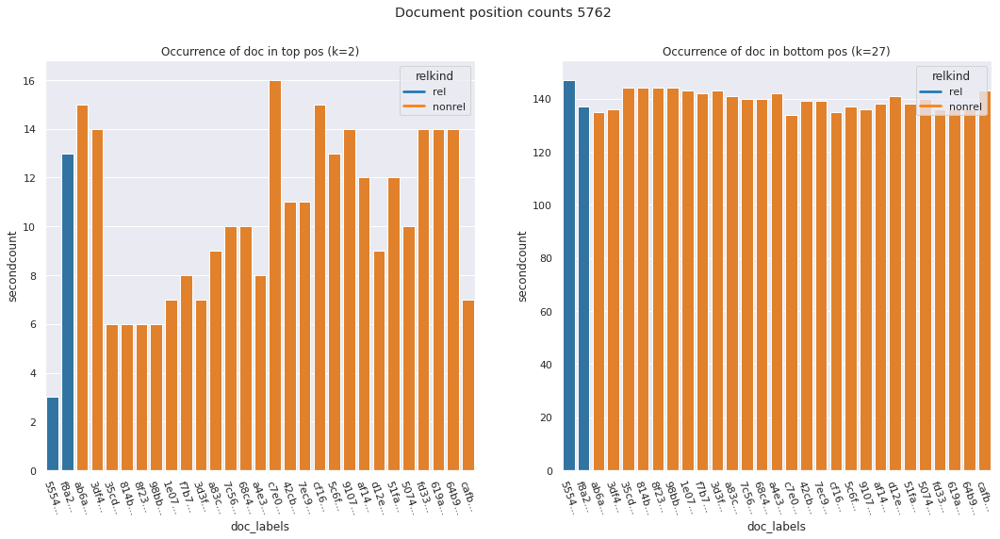

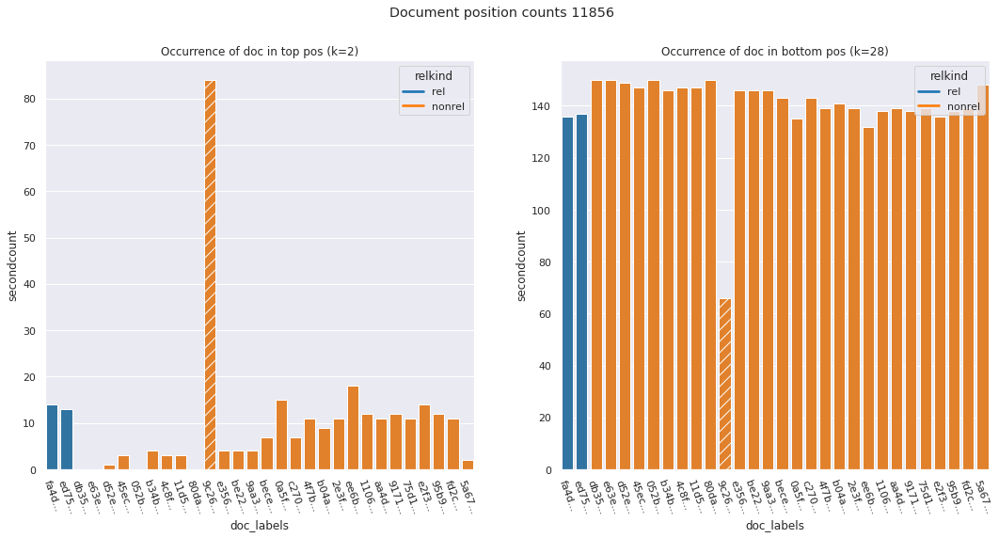

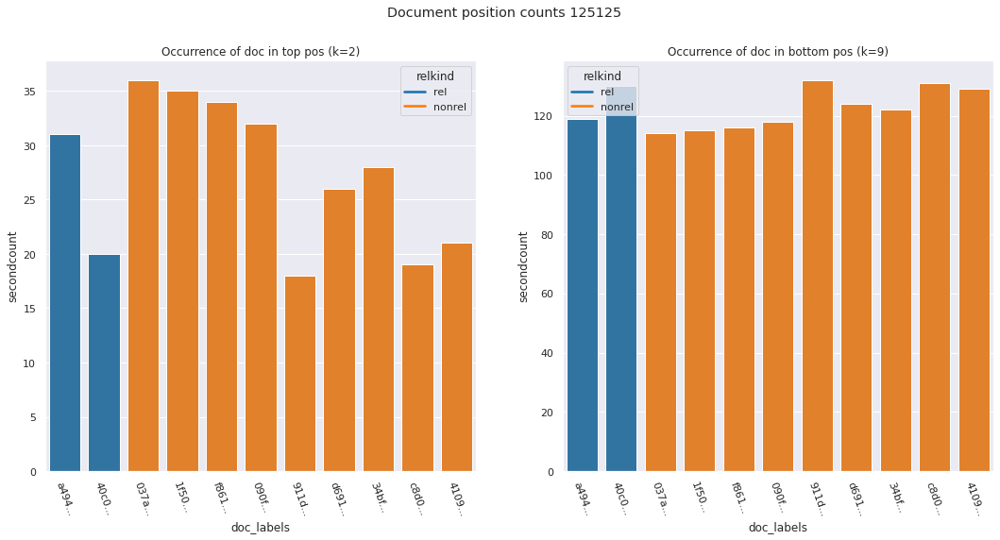

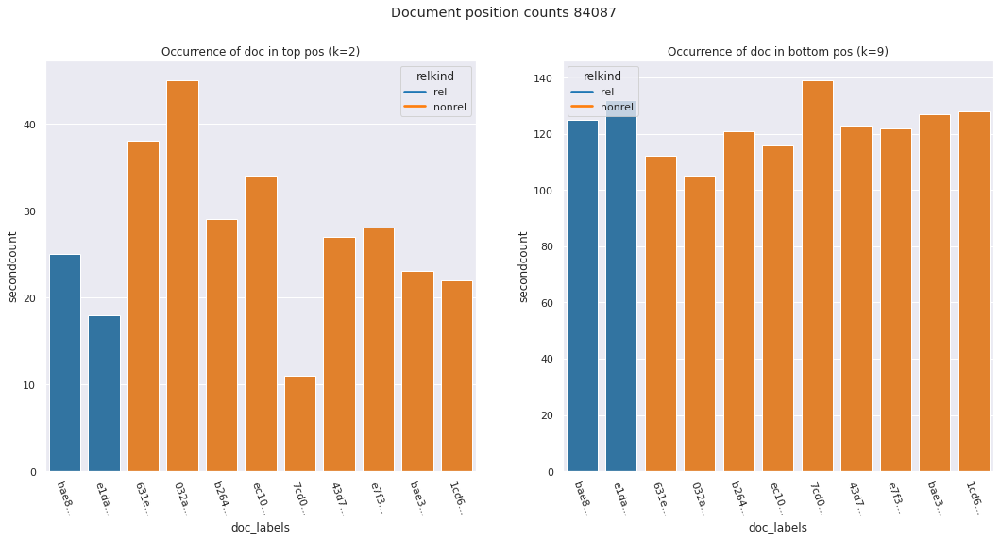

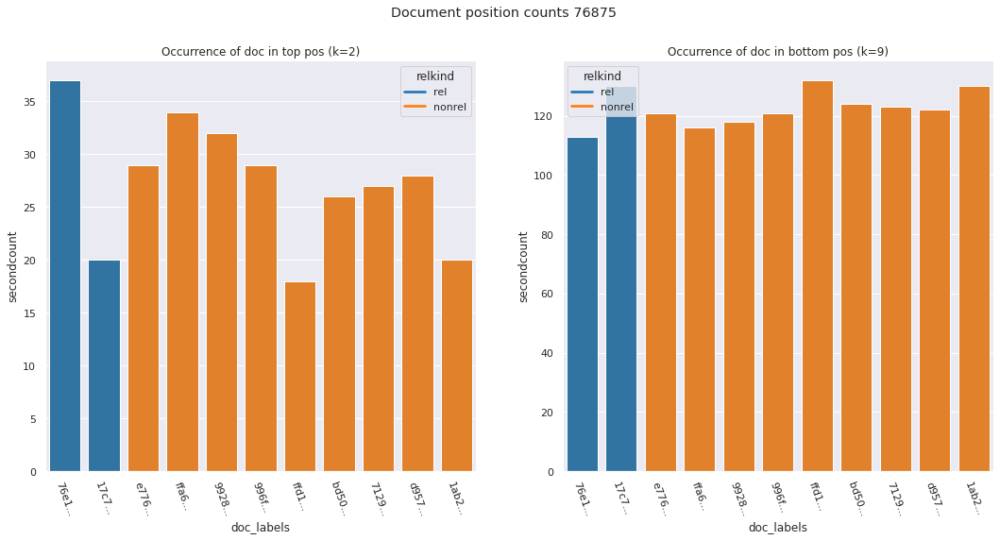

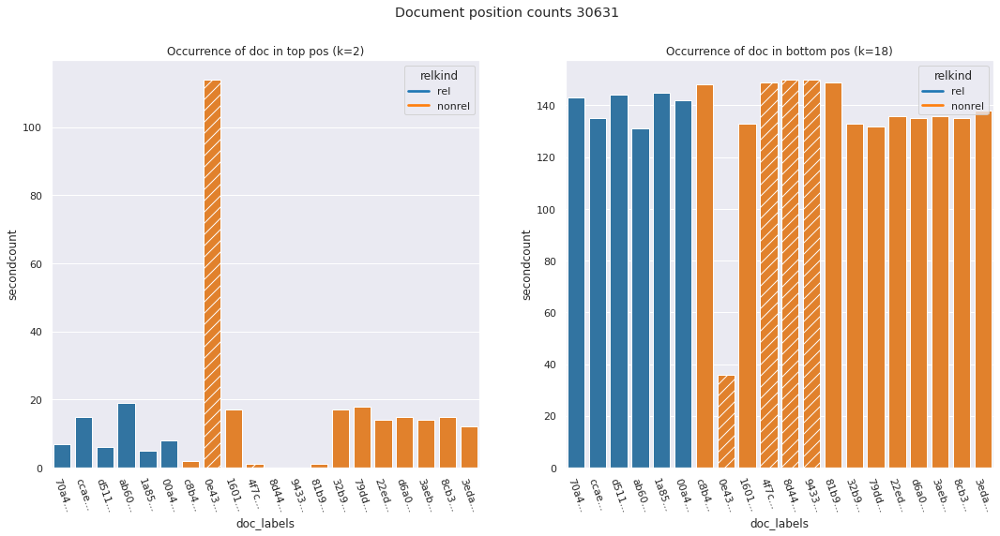

In [120]:
for q in bottomqueries.index.unique():
    plot_doc_pos_count_for_qid(q,rdf,reldf,noauth_ids)

In [142]:
author_and_estrel = pd.merge(est_rel_meta,author_info,on='doc_id')
author_and_estrel.head()

,qid,doc_id,relevance,est_relevance,has_author
0,5438,3e19046c665867bbe557685da60738a40738010a,0,0.179419,True
1,5438,7ef08f1fa127af817cdfd9d3bd00bdf60e32143b,0,0.145612,True
2,5438,ec13c3e7119191802e6f5783d297fe7a5a05293e,0,0.210751,True
3,5438,8fc928bb430d3f72ac876ca156042ad1860acacd,0,0.079591,True
4,5438,b2fdee22aa02477292b858fbafcb418932732bce,1,0.260175,True


###### qid = 30631

For query 30631 there is one authorless doc that spikes, and three that don't. These three have a lower est rel than the spiking document, but not *much* lower, aside from one. The three that spike in fact barely appear in the ranking at all...

In [149]:
inpsect_qid = 30631

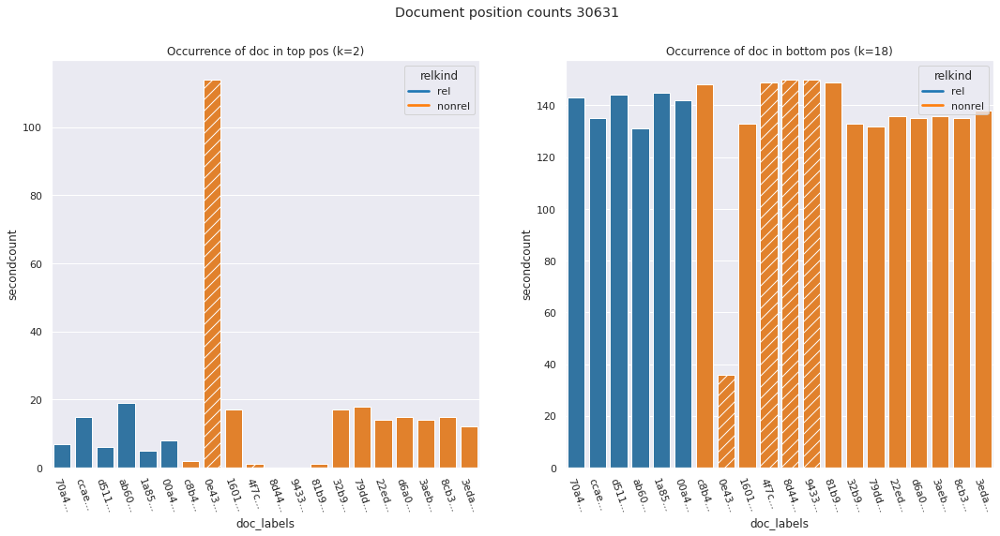

In [150]:
plot_doc_pos_count_for_qid(inpsect_qid,rdf,reldf,noauth_ids)

In [151]:
est_rel_meta[(est_rel_meta.qid == inpsect_qid) & (est_rel_meta.doc_id.isin(['4f7cebcc071e129d41df4766d1aed1c55e236311',
                                                                      '943320b3c05a7aeace900e28d0c6d434804363b4',
                                                                      '8d442ea1c14504e6e5676d82e78e1330c354731f',
                                                                      '0e43caeb9d476264d307e8da0ad71ecc4d804ced']))]

,qid,doc_id,relevance,est_relevance
4467,30631,8d442ea1c14504e6e5676d82e78e1330c354731f,0,0.104101
4472,30631,0e43caeb9d476264d307e8da0ad71ecc4d804ced,0,0.124778
4480,30631,4f7cebcc071e129d41df4766d1aed1c55e236311,0,0.111590
4481,30631,943320b3c05a7aeace900e28d0c6d434804363b4,0,0.069432


In [152]:
author_and_estrel[author_and_estrel.qid == inpsect_qid].sort_values('est_relevance')

,qid,doc_id,relevance,est_relevance,has_author
895,30631,81b95e0483d32945aad0c09849f1a9b2022d59c4,0,0.065416,True
1434,30631,943320b3c05a7aeace900e28d0c6d434804363b4,0,0.069432,False
926,30631,8d442ea1c14504e6e5676d82e78e1330c354731f,0,0.104101,False
4499,30631,4f7cebcc071e129d41df4766d1aed1c55e236311,0,0.111590,False
942,30631,0e43caeb9d476264d307e8da0ad71ecc4d804ced,0,0.124778,False
4497,30631,c8b45c6052cbc388de67682ac02a185fc62ba815,0,0.127159,True
1439,30631,00a407540a8bdd6d7425bd8a561eb21d69682511,0,0.134421,True
1418,30631,d511f3a98d460f7967dd490e34d664caac1529d1,0,0.137287,True
2666,30631,1a854bfceb615249fd9c75f3f4491b0554e59c16,0,0.138070,True
2656,30631,70a462ada6a79125940a46d48e430fa938054819,0,0.148966,True


The four documents with no author have some of the lowest estimated relevances for this query. This may explain why some of them are ranked quite lowly. But it's still strange that one of them spikes?

For query 30631 there is one authorless doc that spikes, and three that don't. These three have a lower est rel than the spiking document, but not *much* lower, aside from one. The three that spike in fact barely appear in the ranking at all...

###### qid = 111469

In [160]:
inpsect_qid = 111469

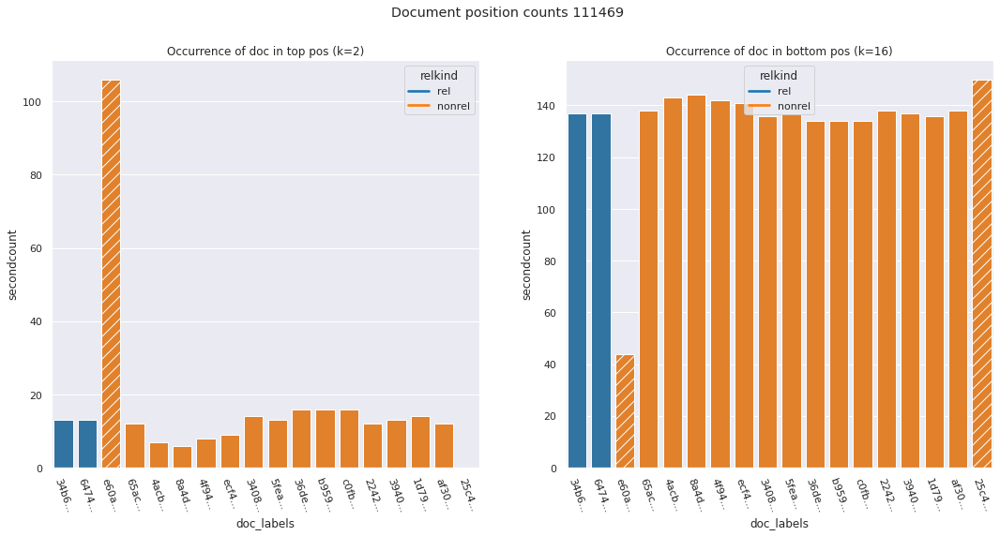

In [161]:
plot_doc_pos_count_for_qid(inpsect_qid,rdf,reldf,noauth_ids)

In [162]:
est_rel_meta[(est_rel_meta.qid == inpsect_qid) & (est_rel_meta.doc_id.isin(['e60af557a1bbfd9b2adee8a3c090d27faab86632',
                                                                      '25c40e796680cdea53578dfad8c7bdbae7ee56a5']))]

,qid,doc_id,relevance,est_relevance
1283,111469,25c40e796680cdea53578dfad8c7bdbae7ee56a5,0,0.060952
1291,111469,e60af557a1bbfd9b2adee8a3c090d27faab86632,0,0.213855


In [163]:
author_and_estrel[author_and_estrel.qid == inpsect_qid].sort_values('est_relevance')

,qid,doc_id,relevance,est_relevance,has_author
1354,111469,25c40e796680cdea53578dfad8c7bdbae7ee56a5,0,0.060952,False
1367,111469,4acbb705dd58fca58d05194c845cda461f6462c7,0,0.072484,True
1365,111469,8a4dd47751709b4e13f611d098a0c6ec10ee3901,0,0.076282,True
1358,111469,4f940b31db19edda00bca85293093c779fa4dd5c,0,0.097344,True
1356,111469,ecf4c446122e770ca0d9031b9b8bdf7d6d40dc9b,0,0.097716,True
1291,111469,647444c4963ddac18626a4d2817eb85e438405c0,1,0.161621,True
1370,111469,340805c6c2806a6aa15c2a0646b2285ddd456375,0,0.177313,True
1364,111469,65acaa6938f34c08b517f49caf5cc82c872ec72f,0,0.180595,True
1369,111469,5fea3a4e2d25d5ad0872d35704d2cbdf210639d9,0,0.187043,True
1363,111469,b9590939f89108838f7499676bb2a58de93c365f,0,0.188831,True


The documents without authors for this query have the highest and the lowest relevance. This is reflected in how often they appear in the top of the ranking.

###### qid = 71096

In [164]:
inpsect_qid = 71096

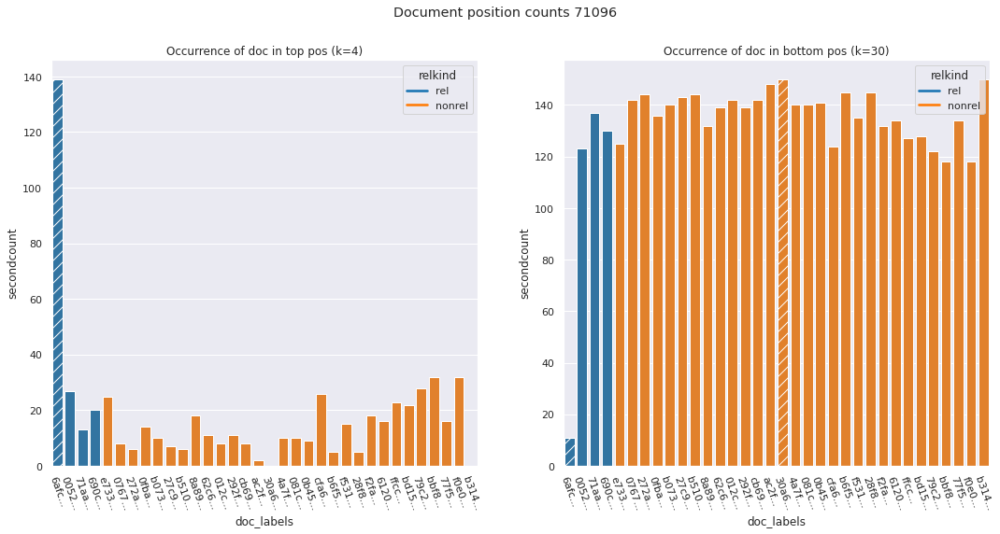

In [165]:
plot_doc_pos_count_for_qid(inpsect_qid,rdf,reldf,noauth_ids)

In [166]:
est_rel_meta[(est_rel_meta.qid == inpsect_qid) & (est_rel_meta.doc_id.isin(['6afc97668839a439e6858691ada76c9ddf798c2a',
                                                                      '30a698ba5648295c91f00545326931eaf07b00be']))]

,qid,doc_id,relevance,est_relevance
432,71096,6afc97668839a439e6858691ada76c9ddf798c2a,1,0.218468
448,71096,30a698ba5648295c91f00545326931eaf07b00be,0,0.069391


In [167]:
author_and_estrel[author_and_estrel.qid == inpsect_qid].sort_values('est_relevance')

,qid,doc_id,relevance,est_relevance,has_author
450,71096,b3146d2601f32d068162d2eb954ed864859bb1cd,0,0.029874,True
457,71096,30a698ba5648295c91f00545326931eaf07b00be,0,0.069391,False
464,71096,ac2f1bf955e79c2522573fb8f508637a9cb272bf,0,0.095152,True
448,71096,cb6940faebc08e4e03c4cfd3adffa567c0946fb2,0,0.095528,True
461,71096,292f1c65fb0a3995411f516e3dc501e44a3fed07,0,0.098981,True
445,71096,012c336ff0a7229cd2c4809f26d9a85e15882bbc,0,0.100853,True
456,71096,b51099d190c827fdfed93b7a459d0808d38ccddb,0,0.105284,True
467,71096,8a892b91e318de54b25809000e818a5efc23d696,0,0.116082,True
437,71096,0767627edb30ac03c910afea561ecc226d4de87a,0,0.120897,True
449,71096,27c92ca493b24d253ef0ad1a3f8c72452f30b3ee,0,0.128345,True


The documents without authors for this query have the highest and the lowest relevance. This is reflected in how often they appear in the top of the ranking.

###### qid = 96265

In [168]:
inpsect_qid = 96265

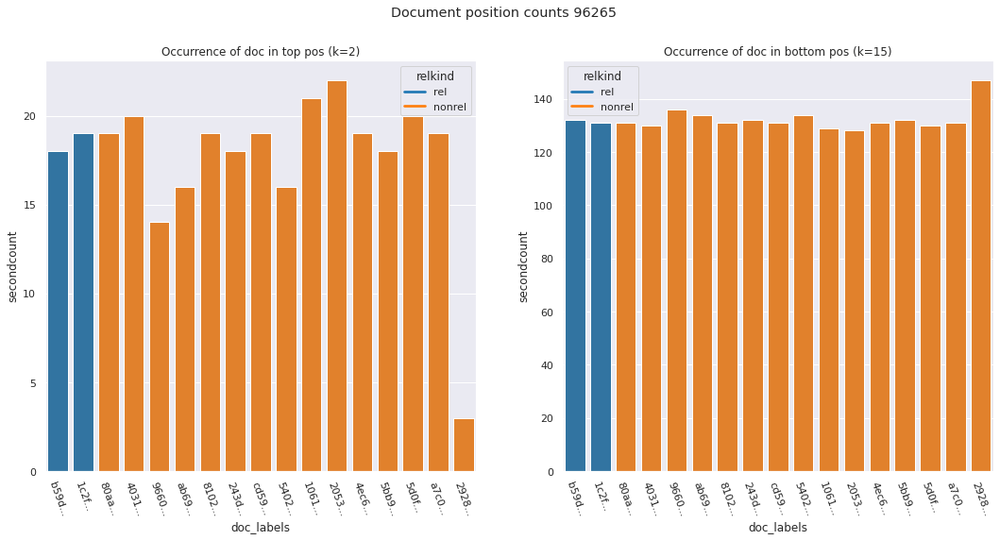

In [169]:
plot_doc_pos_count_for_qid(inpsect_qid,rdf,reldf,noauth_ids)

In [170]:
author_and_estrel[author_and_estrel.qid == inpsect_qid].sort_values('est_relevance')

,qid,doc_id,relevance,est_relevance,has_author
1633,96265,2928bf2cdc03ee57010e14ff97b736614c225c2d,0,0.007426,True
1635,96265,9660c75834ceab591fcc9d357f623c80c39ba8be,0,0.144327,True
1628,96265,ab690da13c9fc04d166471f2e404263b26998e48,0,0.164385,True
1638,96265,81020c906a2977540b20ee3abdffb136ea9ef64f,0,0.165949,True
1637,96265,243d068c29515718dc85c3a6ec5ca00b9b45544d,0,0.167281,True
1639,96265,cd59691aaddb039725107343c2d9d76312bedbec,0,0.168203,True
1629,96265,403136735248d730419f89e3a329b08de98bc0ea,0,0.168249,True
1643,96265,1061d0262c0995d1473c666b624ae64690b6c427,0,0.168793,True
1634,96265,5402520e51e900ab16c624496281bdc3b17fc1fa,0,0.169643,True
1636,96265,4ec6d61f0ceedd0c0b2e9f5d9ac0e7c258c6bfe7,0,0.172527,True


The documents without authors for this query have the highest and the lowest relevance. This is reflected in how often they appear in the top of the ranking.

###### qid = 15898

In [191]:
inpsect_qid = 15395

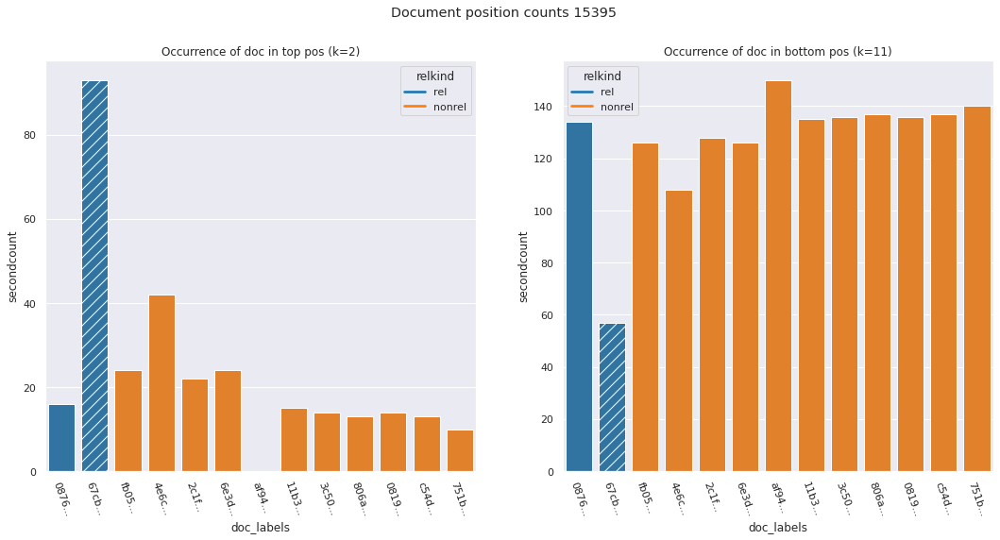

In [192]:
plot_doc_pos_count_for_qid(inpsect_qid,rdf,reldf,noauth_ids)

In [193]:
author_and_estrel[author_and_estrel.qid == inpsect_qid].sort_values('est_relevance')

,qid,doc_id,relevance,est_relevance,has_author
1176,15395,67cb7ec0f36f9396b85b18cad90c0d7eec1658ce,1,0.070658,False
1180,15395,751b1a631daaabbd0e9376b40005c07ca07a5b29,0,0.086387,True
1181,15395,c54d65d53d7ada275d34e1a7c53643ff0c82eb93,0,0.124888,True
1187,15395,08196a4be3e863dd152b3f71aa25e7aeabb6faec,0,0.127366,True
1175,15395,806a330219f49b6e7952e79444477ef512501650,0,0.131350,True
1177,15395,3c50b229b9a59de264df893f6444d515f2546ca1,0,0.136192,True
1179,15395,11b35902e5de5d96046b2db4670e756f1e3a1a3e,0,0.139865,True
1185,15395,08761cfc723bc5dafd6e18203aff6392ae46bd2b,1,0.165807,True
1183,15395,af94eb52e8f7a52b1800414646ab729f34da9191,0,0.177854,True
1184,15395,6e3d8390a0129602e4680baeb9a87ff2b89b7db4,0,0.180306,True


Document af94eb52e8f7a52b1800414646ab729f34da9191 has a reasonably high estimated relevance but nevertheless never occurs in a top position.

**Hypothesis**: Is this because it has multiple authors? And thus is doubly penalized?
--> no

In [214]:
adf[adf['id'] == 'af94eb52e8f7a52b1800414646ab729f34da9191']

,id,missing_authors,authors,name,wiki,country,type,valid,auth_id,h_index,level,region
577,af94eb52e8f7a52b1800414646ab729f34da9191,False,"{'name': 'Yusuf Chisti', 'wiki': 'Massey Unive...",Yusuf Chisti,Massey University,NZ,academic,True,5776192.0,44.0,Advanced,Oceania


In [215]:
pd.merge(author_and_estrel[author_and_estrel.qid == inpsect_qid],adf.rename({'id':'doc_id'},axis=1),on='doc_id',how='left')

,qid,doc_id,relevance,est_relevance,has_author,missing_authors,authors,name,wiki,country,type,valid,auth_id,h_index,level,region
0,15395,806a330219f49b6e7952e79444477ef512501650,0,0.131350,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,15395,67cb7ec0f36f9396b85b18cad90c0d7eec1658ce,1,0.070658,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,15395,3c50b229b9a59de264df893f6444d515f2546ca1,0,0.136192,True,False,"{'name': 'Jason D Hill', 'wiki': 'University o...",Jason D Hill,University of Minnesota,US,academic,True,31418553.0,12.0,Advanced,Americas
3,15395,3c50b229b9a59de264df893f6444d515f2546ca1,0,0.136192,True,False,"{'name': 'Erik O. Nelson', 'wiki': 'University...",Erik O. Nelson,University of Minnesota,US,academic,True,29867411.0,7.0,Advanced,Americas
4,15395,3c50b229b9a59de264df893f6444d515f2546ca1,0,0.136192,True,False,"{'name': 'David Tilman', 'wiki': 'University o...",David Tilman,University of Minnesota,US,academic,True,144913121.0,111.0,Advanced,Americas
5,15395,3c50b229b9a59de264df893f6444d515f2546ca1,0,0.136192,True,False,"{'name': 'Stephen Polasky', 'wiki': 'Universit...",Stephen Polasky,University of Minnesota,US,academic,True,2775332.0,48.0,Advanced,Americas
6,15395,3c50b229b9a59de264df893f6444d515f2546ca1,0,0.136192,True,False,"{'name': 'Douglas G. Tiffany', 'wiki': 'Univer...",Douglas G. Tiffany,University of Minnesota,US,academic,True,37939261.0,12.0,Advanced,Americas
7,15395,2c1fcc403442c999dc78978447099daad73d596b,0,0.185516,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,15395,11b35902e5de5d96046b2db4670e756f1e3a1a3e,0,0.139865,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,15395,751b1a631daaabbd0e9376b40005c07ca07a5b29,0,0.086387,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Some documents have author in the index but not in the merged annotations file? Has influence on the grouping?


In [122]:
noauth_ids

['c4e04c3ad7e58d45d2cfb686f2106b6a6beedff2',
 '332fc6195f1396ad679f8eb9a2bed71aac9e7420',
 '8d442ea1c14504e6e5676d82e78e1330c354731f',
 '17dc9f600d774888aa379aa5574144d5f2a7e3b9',
 '2715db84533cc17ca0d9cc2dce34deca5c15e15f',
 'f16f2aae49f330b9c0f885bf2eb5b4f8a9df00b7',
 '3dc0ee51efd0e893fabb189c23ffd2b4a09ca70d',
 '74bdf73f81b4ceecc9cf216558528e3c7a32cc05',
 '9cea62e2cef93c580b8c82e900241e771f3b914e',
 '9ae8ce5d9ed80df06663f16d7118eaff55c82aeb',
 'a15b28c5b9e2d3842fdb9893be668bc51d63dfbe',
 'cd82bcecd130b6dbef52cf3c16ebb6607c63f9d2',
 'e60af557a1bbfd9b2adee8a3c090d27faab86632',
 '4313bf44960b5b726028b55e76f1c9f99334e347',
 'a774aa22cc1e8bcf9929d3acac63c660c28eab05',
 '3a0130cfab8192a397d79fc1c7c398470157cf48',
 '4c2d8626326664859db2a0500f70d6de736f5bfe',
 '30a698ba5648295c91f00545326931eaf07b00be',
 '86c0337f18d3097836f7348656c6492715c4319d',
 'a6361a0ce9579d5659cad164c7d855c396e227f1',
 '13faea280933c0832cbc3b5b20be796e41f23ca8',
 '1ef0ad9c9382693fd39d8cfbc25aab7929d89abe',
 '0da7a3f0

Some remarks: 
- Many of the bottom queries indeed have a non-relevant no-author item in a top position, and no relevant no-author items.
- Out of the top queries, two have a relevant no-author item in a top position, and no non-relevant no-author items.

    
- there are still numerous rankings with (top?) documents missing from the ranking, why is that?

## Hypothesis: bottom queries have many items without author
- Because they aren't in the index
- Because they are in the index but don't have an author

1. Find all items in the index that do not have an author
2. Find all items that have an estimated relevance but aren't in the index
3. Check how many of the above items occur in the top and the bottom rankings

In [112]:
eval_ids = list(reldf.doc_id.unique())
eval_ids[:10]
len(eval_ids)

4693

In [113]:
est_rel_meta = '../reranking/resources/relevances/Evaluation_rel_scores_model_A.csv'
est_rel_meta = pd.read_csv(est_rel_meta)
est_rel_meta.head()

,qid,doc_id,est_relevance
0,9087,40d8bea494d4ff4c46f7ad5cb2dcdaa6f96ed5a4,0.131015
1,9087,008a2a2c765485af2e035a2572ba9fc1102eabff,0.208199
2,9087,4a1472c575488ed9acee6c5481f68b95a0c34092,0.129001
3,9087,ff8df0745136fb183ea72b783ff38f8a7ad5ceec,0.179983
4,9087,90605deb1da5e3d5548da12dc130fc0341a6a255,0.157544


In [114]:
est_rel_ids = list(est_rel_meta.doc_id.unique())
est_rel_ids[:10]
len(est_rel_ids)

4684

In [115]:
all_ids = list(set(eval_ids).union(set(est_rel_ids)))
len(all_ids)

4693

As established earlier in the research process, there are 9 items in the evaluation sample that do not have an estimated relevance.

In [116]:
no_author = find_docs_without_author(reldf)

Out of the items in the sample file, 4605 are also in the index.

26 items have no author in the index

In [117]:
topmerge = pd.merge(top[['qid']],reldf[['qid','query','doc_id']],on='qid')
topmerge['has_author'] = topmerge.apply(lambda row: row.doc_id not in no_author,axis='columns')
topmerge.head(10)

,qid,query,doc_id,has_author
0,91643,nazi,6fa92e5b2f8d8912026e4e7e6c9a858528499966,True
1,91643,nazi,cdf1901567491b6ad5ecde7042895ec06e99e2b2,True
2,91643,nazi,b2f24606271b959806061c64f81130e5ad75d410,True
3,91643,nazi,10b0693b1f5fe596808c88b9cb14ea8ebc87654c,True
4,91643,nazi,4bbb91eb0fea54bd85774931e299efaaaa1b038f,True
5,91643,nazi,fb1a4e990af505ebef7c643c9231645695d9ce31,True
6,91643,nazi,f520d727e7e76253c1d77f26c573474437858593,True
7,91643,nazi,e38a47e6a3e62abf46804dc77b6e1c1deb3eb9e8,True
8,91643,nazi,17dafc3f0318b8711ca4f07783ef428568abb64b,True
9,91643,nazi,8954067bccf3f36cfb46f22c40df207028ecb63a,True


In [118]:
botmerge = pd.merge(bot[['qid']],reldf[['qid','query','doc_id']],on='qid')
botmerge['has_author'] = botmerge.apply(lambda row: row.doc_id not in no_author,axis='columns')
botmerge.head(10)

,qid,query,doc_id,has_author
0,657,iran,a1b0feb1f82716b0e343453ca214912cfd3ea0e5,True
1,657,iran,b59004dc46558189fa4d846029ccb1ce3f079484,True
2,657,iran,17475d93c5d0b5b6396aa1d3a3928d6154b65695,True
3,657,iran,1436449e0234166b13135df45be1f072df059007,True
4,657,iran,18f883bd5b9ab9771e561a0214af6bd5ddda0d61,True
5,657,iran,a8b58f310e13c171ce7b7890d23860836cbc4534,True
6,657,iran,2aa5e431cd45476cc0432722dfa003a641790830,False
7,657,iran,cb547f0c206fafff203c66a169816f03360cfc89,True
8,657,iran,1a8800cdf999a01022f1db8e5c4c61306d3e43cc,True
9,657,iran,48086bd4f74a8d2aa8a51d1b1406fbd0cad67f25,True


In [119]:
topmerge[(topmerge.has_author == False)]

,qid,query,doc_id,has_author
62,21237,visual landscape,ad5cf96ee7450784e2be79f786c5e54135df6519,False
170,43723,fordyce sebaceous,5778770d9169b220e1d2c7c18d6a7a80808481af,False
189,43723,fordyce sebaceous,f147f0511186715fb2fac0bec242eb30ff720e6b,False
205,9663,covid-19 ai,4313bf44960b5b726028b55e76f1c9f99334e347,False
213,9663,covid-19 ai,2801d473e9c29b3de614030be102fa7245806d00,False
215,9663,covid-19 ai,3cc5762bbdbd60228df3e4160ef8da27c1f065cb,False
216,9663,covid-19 ai,d7852b3c373fa1a5f0a00be37f7ef041763aec42,False
225,9663,covid-19 ai,943320b3c05a7aeace900e28d0c6d434804363b4,False
228,9663,covid-19 ai,0e43caeb9d476264d307e8da0ad71ecc4d804ced,False
235,9663,covid-19 ai,394149ca78b50fb0811a49af46eb95c7ff7241e9,False


In [120]:
botmerge[(botmerge.has_author == False)]

,qid,query,doc_id,has_author
6,657,iran,2aa5e431cd45476cc0432722dfa003a641790830,False
48,100510,the yellow wallpaper,39b10d9aa0f0461f307b4f533d28009b48d294e9,False
58,16607,disneyland and utopia,c0863b393ad68f2a136303ea3e313434a8daa79a,False
80,12885,simulation,5176327e639e6cb53a01c899665350443e3cacf9,False
112,59483,newsql,0ff67ddd8c55b468b7f1b2b19c8ae06429b6bc4a,False
128,59483,newsql,4845b32d9c4153ed299246282d2a06a3d324109c,False
154,89569,qualitative research on brand loyalty,de2ee064a2e367fe8b45bec10f533bff8fdc0090,False
197,2438,tropical rocky shores,2b0a62938189b6295d22e84e1866515491f64c1b,False
205,13096,adam optimizer,b7919bcfa38aa97514187501a23c983e8eb5482b,False
224,13096,adam optimizer,0ba531c0eaf44ace81b54aaee07750cad556edd0,False


In [121]:
top = get_k_results(edf,138,True)
bot = get_k_results(edf,62,False)
print(top)
print()
print(bot)

key    qid  difference  disparity  relevance
0    91643    0.019822   1.006921   0.868206
1     5191    0.044683   1.448939   1.344147
2    81479    0.046552   2.044160   1.889465
3    21237    0.053041   1.358547   1.149610
4     7363    0.053171   1.313280   1.085770
..     ...         ...        ...        ...
133  31385    0.379800   1.297175   1.100566
134  34981    0.383878   2.099273   1.330451
135  96522    0.386489   1.944350   1.278177
136   6657    0.407489   1.966829   1.610183
137  22230    0.409372   1.678485   0.954943

[138 rows x 4 columns]

key     qid  difference  disparity  relevance
0       657    3.700546   2.631709   0.255715
1    100510    3.252370   2.703133   0.514383
2     16607    3.034450   2.557715   0.550634
3     89881    1.987253   1.570899   0.577918
4     12885    1.941179   1.874742   0.848831
..      ...         ...        ...        ...
57     4000    0.469150   1.463646   0.995317
58    80079    0.458209   1.860573   1.564463
59   113942    0.4527

In [122]:
topmerge = pd.merge(top[['qid']],reldf,on='qid')
topmerge['has_author'] = topmerge.apply(lambda row: row.doc_id not in no_author,axis='columns')
topmerge.head(10)

,qid,query,doc_id,doc_rel,has_author
0,91643,nazi,6fa92e5b2f8d8912026e4e7e6c9a858528499966,1,True
1,91643,nazi,cdf1901567491b6ad5ecde7042895ec06e99e2b2,0,True
2,91643,nazi,b2f24606271b959806061c64f81130e5ad75d410,1,True
3,91643,nazi,10b0693b1f5fe596808c88b9cb14ea8ebc87654c,0,True
4,91643,nazi,4bbb91eb0fea54bd85774931e299efaaaa1b038f,0,True
5,91643,nazi,fb1a4e990af505ebef7c643c9231645695d9ce31,1,True
6,91643,nazi,f520d727e7e76253c1d77f26c573474437858593,1,True
7,91643,nazi,e38a47e6a3e62abf46804dc77b6e1c1deb3eb9e8,1,True
8,91643,nazi,17dafc3f0318b8711ca4f07783ef428568abb64b,1,True
9,91643,nazi,8954067bccf3f36cfb46f22c40df207028ecb63a,0,True


In [123]:
botmerge = pd.merge(bot[['qid']],reldf,on='qid')
botmerge['has_author'] = botmerge.apply(lambda row: row.doc_id not in no_author,axis='columns')
botmerge.head(10)

,qid,query,doc_id,doc_rel,has_author
0,657,iran,a1b0feb1f82716b0e343453ca214912cfd3ea0e5,0,True
1,657,iran,b59004dc46558189fa4d846029ccb1ce3f079484,0,True
2,657,iran,17475d93c5d0b5b6396aa1d3a3928d6154b65695,0,True
3,657,iran,1436449e0234166b13135df45be1f072df059007,0,True
4,657,iran,18f883bd5b9ab9771e561a0214af6bd5ddda0d61,0,True
5,657,iran,a8b58f310e13c171ce7b7890d23860836cbc4534,0,True
6,657,iran,2aa5e431cd45476cc0432722dfa003a641790830,0,False
7,657,iran,cb547f0c206fafff203c66a169816f03360cfc89,0,True
8,657,iran,1a8800cdf999a01022f1db8e5c4c61306d3e43cc,1,True
9,657,iran,48086bd4f74a8d2aa8a51d1b1406fbd0cad67f25,0,True


only the presence of no-author files does not have to be an issue? or maybe when there are many nauthor docs on the total it levels out because they're all treated the same, so it basically devolves to "random"

In [124]:
botmerge[(botmerge.has_author == False)]

,qid,query,doc_id,doc_rel,has_author
6,657,iran,2aa5e431cd45476cc0432722dfa003a641790830,0,False
48,100510,the yellow wallpaper,39b10d9aa0f0461f307b4f533d28009b48d294e9,0,False
58,16607,disneyland and utopia,c0863b393ad68f2a136303ea3e313434a8daa79a,0,False
80,12885,simulation,5176327e639e6cb53a01c899665350443e3cacf9,0,False
112,59483,newsql,0ff67ddd8c55b468b7f1b2b19c8ae06429b6bc4a,0,False
128,59483,newsql,4845b32d9c4153ed299246282d2a06a3d324109c,0,False
154,89569,qualitative research on brand loyalty,de2ee064a2e367fe8b45bec10f533bff8fdc0090,0,False
197,2438,tropical rocky shores,2b0a62938189b6295d22e84e1866515491f64c1b,0,False
205,13096,adam optimizer,b7919bcfa38aa97514187501a23c983e8eb5482b,0,False
224,13096,adam optimizer,0ba531c0eaf44ace81b54aaee07750cad556edd0,0,False


so, the top document for the worst query doesn't exist in the index. is this one of those documents that exist in the estimated rel files but not the index? --> yes
how are authorless docs treated in this case?
if there is no author, the advantage mean is set to 0. this means that the document is treated as never having an advantage so the hscore is always the same, namely hscore * rho(document)
the rho of 2aa5e431cd45476cc0432722dfa003a641790830 for nle meta is 0.0704727832842697

In [125]:
topmerge.head(10)

,qid,query,doc_id,doc_rel,has_author
0,91643,nazi,6fa92e5b2f8d8912026e4e7e6c9a858528499966,1,True
1,91643,nazi,cdf1901567491b6ad5ecde7042895ec06e99e2b2,0,True
2,91643,nazi,b2f24606271b959806061c64f81130e5ad75d410,1,True
3,91643,nazi,10b0693b1f5fe596808c88b9cb14ea8ebc87654c,0,True
4,91643,nazi,4bbb91eb0fea54bd85774931e299efaaaa1b038f,0,True
5,91643,nazi,fb1a4e990af505ebef7c643c9231645695d9ce31,1,True
6,91643,nazi,f520d727e7e76253c1d77f26c573474437858593,1,True
7,91643,nazi,e38a47e6a3e62abf46804dc77b6e1c1deb3eb9e8,1,True
8,91643,nazi,17dafc3f0318b8711ca4f07783ef428568abb64b,1,True
9,91643,nazi,8954067bccf3f36cfb46f22c40df207028ecb63a,0,True


In [103]:
edf_sorted = edf.sort_values(by='difference').reset_index().reset_index()
edf_sorted.head()
edf_sorted_with_index = pd.merge(edf_sorted,reldf, on='qid')
edf_sorted_with_index.head()

,index,qid,difference,disparity,relevance,query,doc_id,doc_rel,has_author
0,0,91643,0.019822,1.006921,0.868206,nazi,6fa92e5b2f8d8912026e4e7e6c9a858528499966,1,True
1,0,91643,0.019822,1.006921,0.868206,nazi,cdf1901567491b6ad5ecde7042895ec06e99e2b2,0,True
2,0,91643,0.019822,1.006921,0.868206,nazi,b2f24606271b959806061c64f81130e5ad75d410,1,True
3,0,91643,0.019822,1.006921,0.868206,nazi,10b0693b1f5fe596808c88b9cb14ea8ebc87654c,0,True
4,0,91643,0.019822,1.006921,0.868206,nazi,4bbb91eb0fea54bd85774931e299efaaaa1b038f,0,True


In [104]:
allres = get_k_results(edf,200,True).reset_index()
allres.head(5)
allmerge = pd.merge(allres,reldf,on='qid')
allmerge['has_author'] = allmerge.apply(lambda row: row.doc_id not in no_author,axis='columns')
allmerge.head()

,index,qid,difference,disparity,relevance,query,doc_id,doc_rel,has_author
0,0,91643,0.019822,1.006921,0.868206,nazi,6fa92e5b2f8d8912026e4e7e6c9a858528499966,1,True
1,0,91643,0.019822,1.006921,0.868206,nazi,cdf1901567491b6ad5ecde7042895ec06e99e2b2,0,True
2,0,91643,0.019822,1.006921,0.868206,nazi,b2f24606271b959806061c64f81130e5ad75d410,1,True
3,0,91643,0.019822,1.006921,0.868206,nazi,10b0693b1f5fe596808c88b9cb14ea8ebc87654c,0,True
4,0,91643,0.019822,1.006921,0.868206,nazi,4bbb91eb0fea54bd85774931e299efaaaa1b038f,0,True


In [105]:
all_qs_with_no_auth = allmerge.groupby('qid').filter(lambda df: not df.has_author.all())
all_qs_with_no_auth = all_qs_with_no_auth[['index','qid','difference','query','doc_id','doc_rel', 'has_author']]
len(all_qs_with_no_auth.qid.unique())

58

There are 58 queries for which one or more documents don't have an author.

In [106]:
all_qs_with_no_auth.qid.unique()

array([ 21237,  43723,   9663,  16738,  30379,  67407,  23456,  11322,
         1323,  13083,   5864,  25793,  45776,  12887,  29728, 109863,
         7856,  50315,   1353,   9317, 114159,   6538,  19518,  13170,
        25448,   5098,  32866,  20970,   7122,  22268,   8338,  52620,
           95,  14432,  34981,   6657,  60517,  27924,   4000,  39540,
        15572,  51706,  52128,  17329,    822,  21982,  38920,  61739,
        60030,  15819,  13096,   2438,  89569,  59483,  12885,  16607,
       100510,    657])

In [107]:
all_qs_with_no_auth['index'].unique().mean()

108.8103448275862

Since the mean is higher than the half of the number of rankings the later ranking are slightly heavier on docs w/out authors.

<AxesSubplot:xlabel='index'>

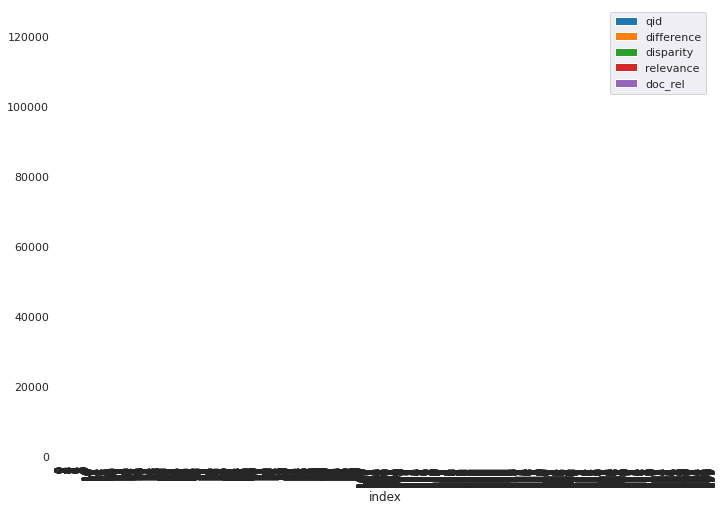

In [108]:
allmerge.set_index('index').plot(kind='bar', stacked=True)

In [109]:
data.head()

key,index,qid,difference,disparity,relevance,r,nr,rfrac,nrfrac
0,0,91643,0.019822,1.006921,0.868206,11,9,0.550000,0.450000
1,1,5191,0.044683,1.448939,1.344147,6,5,0.545455,0.454545
2,2,81479,0.046552,2.044160,1.889465,3,7,0.300000,0.700000
3,3,21237,0.053041,1.358547,1.149610,3,28,0.096774,0.903226
4,4,7363,0.053171,1.313280,1.085770,2,10,0.166667,0.833333


In [110]:
crossdata = pd.crosstab(data['index'],[data['doc_rel'],data['has_author']])

KeyError: 'doc_rel'

In [ ]:
crossdata.head().columns

In [ ]:
crossdata[(0,False)].to_list()

In [ ]:
crossdata.head().index.to_list()

In [ ]:
np.arange(len(rel_has_author)*2,step=2)

In [111]:
rel_has_author = np.array(crossdata[(1,True)].to_list())
rel_not_has_author = np.array(crossdata[(1,False)].to_list())
nonrel_has_author = np.array(crossdata[(0,True)].to_list())
nonrel_not_has_author = np.array(crossdata[(0,False)].to_list())
qid = crossdata.index.to_list()

with sns.axes_style("white"):
    sns.set(rc={'figure.figsize':(100,17)})
    sns.set_style("ticks")
    sns.set_context("talk")
    
    # plot details
    bar_width = 5
    epsilon = .015
    line_width = 1
    opacity = 0.7
    pos_bar_positions = np.arange(len(rel_has_author)*2*bar_width,step=2*bar_width)
    neg_bar_positions = pos_bar_positions + bar_width

    # make bar plots
    rel_has_author_bar = plt.bar(pos_bar_positions, rel_has_author, bar_width,
                              color='#ED0020',
                              label='rel + author')
    print(rel_has_author)
    rel_not_has_author_bar = plt.bar(pos_bar_positions, rel_not_has_author, bar_width-epsilon,
                              bottom=rel_has_author,
                              alpha=opacity,
                              color='white',
                              edgecolor='#ED0020',
                              linewidth=line_width,
                              hatch='//',
                              label='rel + no author')
    
    nonrel_has_author_bar = plt.bar(neg_bar_positions, nonrel_has_author, bar_width,
                              color='#0000DD',
                              label='not rel + author')
    nonrel_not_has_author_bar = plt.bar(neg_bar_positions, nonrel_not_has_author, bar_width-epsilon,
                              bottom=nonrel_has_author,
                              color="white",
                              hatch='//',
                              edgecolor='#0000DD',
                              ecolor="#0000DD",
                              linewidth=line_width,
                              label='not rel + no author')
    
    plt.xticks(neg_bar_positions, qid, rotation=90)
    plt.ylabel('Percentage of Samples')
    plt.legend(loc='best')
    sns.despine()

NameError: name 'crossdata' is not defined

In [ ]:
crossdata.index.to_list()[-10:]

In [ ]:
crossdata.index.to_list()[-10:]

In [ ]:
crossdata.index.to_list()[len(crossdata.index.to_list())-10:len(crossdata.index.to_list())]

In [ ]:
crossdata.index.to_list()[:10]

In [ ]:
def plot_has_authors(crossdata,k=10,asc=True):
    if asc:
        slstart = 0
        slend = k
    else:
        slstart = len(crossdata.index.to_list())-k
        slend = len(crossdata.index.to_list())
    
    
    rel_has_author = np.array(crossdata[(1,True)].to_list()[slstart:slend])
    rel_not_has_author = np.array(crossdata[(1,False)].to_list()[slstart:slend])
    nonrel_has_author = np.array(crossdata[(0,True)].to_list()[slstart:slend])
    nonrel_not_has_author = np.array(crossdata[(0,False)].to_list()[slstart:slend])
    qid = crossdata.index.to_list()[slstart:slend]

    with sns.axes_style("white"):
        sns.set(rc={'figure.figsize':(100,17)})
        sns.set_style("ticks")
        sns.set_context("talk")

        # plot details
        bar_width = 4
        epsilon = .015
        line_width = 1
        opacity = 0.7
        pos_bar_positions = np.arange(len(rel_has_author)*2*bar_width,step=2*bar_width)
        neg_bar_positions = pos_bar_positions + bar_width

        # make bar plots
        rel_has_author_bar = plt.bar(pos_bar_positions, rel_has_author, bar_width,
                                  color='#ED0020',
                                  label='rel + author')
        print(rel_has_author)
        rel_not_has_author_bar = plt.bar(pos_bar_positions, rel_not_has_author, bar_width-epsilon,
                                  bottom=rel_has_author,
                                  alpha=opacity,
                                  color='white',
                                  edgecolor='#ED0020',
                                  linewidth=line_width,
                                  hatch='//',
                                  label='rel + no author')

        nonrel_has_author_bar = plt.bar(neg_bar_positions, nonrel_has_author, bar_width,
                                  color='#0000DD',
                                  label='not rel + author')
        nonrel_not_has_author_bar = plt.bar(neg_bar_positions, nonrel_not_has_author, bar_width-epsilon,
                                  bottom=nonrel_has_author,
                                  color="white",
                                  hatch='//',
                                  edgecolor='#0000DD',
                                  ecolor="#0000DD",
                                  linewidth=line_width,
                                  label='not rel + no author')

        plt.xticks(neg_bar_positions, qid, rotation=90)
        plt.ylabel('Num docs')
        plt.legend(loc='best')
        sns.despine()

In [ ]:
plot_has_authors(crossdata)

In [ ]:
plot_has_authors(crossdata,asc=False)

In [ ]:
dat = crossdata.unstack().reset_index().rename({0:'count'},axis=1)
# dat[dat['index'] <= 10]

In [ ]:
dat = crossdata.unstack().reset_index().rename({0:'count'},axis=1)
# fig, ax = plt.subplots(1,1,figsize = (17.7,8.27))

g = sns.catplot(x="index", y="count",
                hue="has_author", col="doc_rel",
                data=dat[dat['index'] <= 20], kind="bar",
                height=4, aspect=1)
g.fig.set_size_inches(22,8.27)


In [ ]:
g = sns.catplot(x="index", y="count",
                hue="has_author", col="doc_rel",
                data=dat[dat['index'] >= len(dat['index'].unique()) - 20], kind="bar",
                height=4, aspect=1)
g.fig.set_size_inches(22,8.27)

Hypothesis was: bottom queries have many items without author


- Bottom queries mainly have nonrel items without author
- Top queries have both rel and nonrel items without author

Still to check: 


In [ ]:
est_rel_meta.describe()

In [ ]:
reldf.describe()

In [ ]:
pd.merge(est_rel_meta,reldf,on=['qid','doc_id'],how='outer').describe()

In [ ]:
est_and_rel = pd.merge(est_rel_meta,reldf,on=['qid','doc_id'],how='outer').fillna(0)
est_and_rel.head()

In [ ]:
 sns.stripplot(x="doc_rel", y="est_relevance", data=est_and_rel)

interestingly, none of the estimated values are very high? why is that? and there are three points that have rel 1 but are estimated very low, interesting to see if those cause some low results in the rankings

## Bibliography

[1] Buckley, ‘Reliable Information Access Final Workshop Report’.